In [ ]:
from datetime import datetime
import numpy as np
import pandas as pd
import pandas_datareader.data as web
from yahooquery import Ticker
import yfinance as yf
import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
CNFont = FontProperties(fname='simhei.ttf')
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)


# Google colab interactive table
%load_ext google.colab.data_table
%matplotlib inline

CHART_SIZE_X, CHART_SIZE_Y = 12, 8
SMALL_CHART_SIZE_X, SMALL_CHART_SIZE_Y = 8, 6


# Plot stock pair chart
def plotPair(df, stockA, stockB, sizeX, sizeY):
    ax1 = df[stockA].plot(label=stockA, legend=True, figsize = (sizeX, sizeY))
    ax1.set_ylim(df[stockA].min(), df[stockA].max())

    ax2 = df[stockB].plot(secondary_y=True, label=stockB, legend=True, figsize = (sizeX, sizeY))
    ax2.set_ylim(df[stockB].min(), df[stockB].max())

    ax1.legend(prop=CNFont, loc=2)
    ax2.legend(prop=CNFont, loc=1)

    plt.show()


# Display the stock info in Chinese or not
def useChinese(use=True):
  # return COL_NAME, COL_INDUSTRY, COL_SECTOR, AJD_CLOSE_FILE
  if use:
    return 'nameChi', 'industryChi', 'sectorChi', 'hkStocksAdjClosePxChi.csv'

  else:
    return 'shortName', 'industry', 'sector', 'hkStocksAdjClosePx.csv'


COL_NAME, COL_INDUSTRY, COL_SECTOR, AJD_CLOSE_FILE = useChinese(False)




The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


In [ ]:
!pip install yahooquery

  Created wheel for yfinance: filename=yfinance-0.1.55-py2.py3-none-any.whl size=22616 sha256=955c8f04ddf780f4525c35e5d09c1436ef7f0f59a1cfd8ac0641e09c91f4fd0c
  Stored in directory: /root/.cache/pip/wheels/04/98/cc/2702a4242d60bdc14f48b4557c427ded1fe92aedf257d4565c
Successfully built yfinance


In [ ]:
from google.colab import files 
uploaded = files.upload()

Saving simhei.ttf to simhei.ttf


In [ ]:
# Get the pre-downloaded all HK stocks information from yahoo
# Source the Chinese name and stock sectors from http://www1.hket.com/finance/chart/industry-index.do


stocksInfo = pd.read_excel('StockInfoo.xlsx')
stocksInfo

,Symbol,language,region,quoteType,quoteSourceName,triggerable,currency,fiftyTwoWeekLowChange,fiftyTwoWeekLowChangePercent,fiftyTwoWeekRange,fiftyTwoWeekHighChange,fiftyTwoWeekHighChangePercent,fiftyTwoWeekLow,fiftyTwoWeekHigh,dividendDate,earningsTimestamp,earningsTimestampStart,earningsTimestampEnd,sharesOutstanding,fiftyDayAverage,fiftyDayAverageChange,fiftyDayAverageChangePercent,twoHundredDayAverage,twoHundredDayAverageChange,twoHundredDayAverageChangePercent,marketCap,sourceInterval,exchangeDataDelayedBy,tradeable,firstTradeDateMilliseconds,priceHint,regularMarketChange,regularMarketChangePercent,regularMarketTime,regularMarketPrice,regularMarketDayHigh,regularMarketDayRange,regularMarketDayLow,regularMarketVolume,regularMarketPreviousClose,bid,ask,bidSize,askSize,fullExchangeName,financialCurrency,regularMarketOpen,averageDailyVolume3Month,averageDailyVolume10Day,exchange,shortName,longName,messageBoardId,exchangeTimezoneName,exchangeTimezoneShortName,gmtOffSetMilliseconds,market,esgPopulated,marketState,displayName,price,trailingAnnualDividendRate,trailingAnnualDividendYield,epsTrailingTwelveMonths,epsForward,epsCurrentYear,priceEpsCurrentYear,bookValue,forwardPE,priceToBook,trailingPE,ipoExpectedDate,prevName,nameChangeDate,openInterest,sector,industry
0,AACG,en-US,US,EQUITY,Nasdaq Real Time Price,True,USD,4.440000,7.278688,0.61 - 19.75,-14.700000,-0.744304,0.610,19.75,1.535069e+09,1.605215e+09,1.605215e+09,1.605215e+09,31350500.0,3.663636,1.386364,0.378412,1.760074,3.289926,1.869198,1.583200e+08,15,0,False,1.201617e+12,2,0.000000,0.000000,1614626590,5.050,5.200,4.91 - 5.2,4.9100,183094,5.050,5.00,5.07,11,11,NasdaqGS,CNY,5.0200,5952031.0,711216.0,NMS,ATA Creativity Global,ATA Creativity Global,finmb_39920439,America/New_York,EST,-18000000,us_market,False,REGULAR,ATA Creativity Global,5.050,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer Services,Other Consumer Services
1,AACQ,en-US,US,EQUITY,Nasdaq Real Time Price,True,USD,1.485001,0.155091,9.575 - 14.01,-2.950000,-0.210564,9.575,14.01,NaN,NaN,NaN,NaN,72450000.0,11.412121,-0.352120,-0.030855,10.388059,0.671942,0.064684,1.001621e+09,15,0,False,1.599226e+12,2,0.180000,1.654414,1614626690,11.060,11.270,10.83 - 11.27,10.8300,3250628,10.880,11.02,11.02,10,22,NasdaqGS,USD,11.0700,2216853.0,4839583.0,NMS,Artius Acquisition Inc.,Artius Acquisition Inc.,finmb_673556560,America/New_York,EST,-18000000,us_market,False,REGULAR,NaN,11.060,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Finance,Business Services
2,AACQU,en-US,US,EQUITY,Nasdaq Real Time Price,True,USD,2.060000,0.207244,9.94 - 15.39,-3.390000,-0.220273,9.940,15.39,NaN,NaN,NaN,NaN,NaN,12.292121,-0.292121,-0.023765,10.873559,1.126441,0.103595,NaN,15,0,False,1.594733e+12,2,0.080000,0.671140,1614626030,12.000,12.180,11.85 - 12.18,11.8500,23654,11.920,11.89,12.10,13,11,NasdaqGS,USD,12.0600,170235.0,183350.0,NMS,Artius Acquisition Inc.,Artius Acquisition Inc.,finmb_673556560,America/New_York,EST,-18000000,us_market,False,REGULAR,NaN,12.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Finance,Business Services
3,AAL,en-US,US,EQUITY,Nasdaq Real Time Price,True,USD,12.919001,1.565939,8.25 - 22.8,-1.630999,-0.071535,8.250,22.80,1.582070e+09,1.611817e+09,1.619613e+09,1.620045e+09,639676032.0,17.397272,3.771729,0.216800,14.534633,6.634368,0.456452,1.354130e+10,15,0,False,1.127828e+12,2,0.229000,1.093601,1614626704,21.169,22.290,21.05 - 22.29,21.0500,38106988,20.940,21.11,21.12,18,13,NasdaqGS,USD,21.7500,69920940.0,68033783.0,NMS,"American Airlines Group, Inc.",American Airlines Group Inc.,finmb_168569,America/New_York,EST,-18000000,us_market,False,REGULAR,American Airlines,21.169,0.10,0.004776,-18.362,-0.01,-7.98,-2.652757,-11.049,-2116.900100,-1.915920,NaN,NaN,NaN,NaN,NaN,Transportation,Air Freight/Delivery Services
4,AAME,en-US,US,EQUITY,Nasdaq Real Time Price,True,USD,3.260000,2.063291,1.58 - 15.97,-11.130000,-0.696932,1.580,15.97,1.556064e+09,1.605006e+09,1.605006e+09,1.605006e+09,20414300.0

In [ ]:
# list the unique industries names
industryNames = stocksInfo[COL_INDUSTRY].unique()
print('Count:', len(industryNames))
print(industryNames)

Count: 128
['Other Consumer Services' 'Business Services'
 'Air Freight/Delivery Services' 'Life Insurance' 'Semiconductors'
 'Industrial Machinery/Components' 'Computer Manufacturing'
 'Transportation Services' 'Major Banks' 'Major Pharmaceuticals'
 'Biotechnology: Biological Products (No Diagnostic Substances)'
 'Biotechnology: In Vitro & In Vivo Diagnostic Substances'
 'Medical/Dental Instruments' 'Diversified Commercial Services'
 'Computer Software: Prepackaged Software' 'Property-Casualty Insurers'
 'Medical Specialities' 'Auto Manufacturing' 'Multi-Sector Companies'
 'Major Chemicals' 'EDP Services' 'Telecommunications Equipment'
 'Medical/Nursing Services' 'Water Supply' 'Building Materials'
 'Electrical Products' 'Electric Utilities: Central'
 'Services-Misc. Amusement & Recreation'
 'Office Equipment/Supplies/Services' 'Savings Institutions'
 'Real Estate Investment Trusts' 'Agricultural Chemicals'
 'Industrial Specialties' 'Finance: Consumer Services'
 'Biotechnology: Commer

In [ ]:
# Exploring the data 
# Look at the subset of useful columns and sort by largest marketCap
SELECTED_COLUMNS = ['Symbol', 'quoteType', COL_NAME, COL_INDUSTRY, COL_SECTOR, 'marketCap', 'regularMarketPreviousClose', 'averageDailyVolume10Day']

stocksInfo[SELECTED_COLUMNS].sort_values(by=['marketCap'], ascending=False)

,Symbol,quoteType,shortName,industry,sector,marketCap,regularMarketPreviousClose,averageDailyVolume10Day
7,AAPL,EQUITY,Apple Inc.,Computer Manufacturing,Technology,2.132760e+12,121.26,128551766.0
1889,MSFT,EQUITY,Microsoft Corporation,Computer Software: Prepackaged Software,Technology,1.785998e+12,232.38,32570866.0
184,AMZN,EQUITY,"Amazon.com, Inc.",Catalog/Specialty Distribution,Consumer Services,1.578535e+12,3092.93,4042483.0
1231,GOOGL,EQUITY,Alphabet Inc.,Computer Software: Programming Data Processing,Technology,1.400186e+12,2021.91,1712083.0
1230,GOOG,EQUITY,Alphabet Inc.,Computer Software: Programming Data Processing,Technology,1.396900e+12,2036.86,1607833.0
...,...,...,...,...,...,...,...,...
3156,ZIONN,EQUITY,Zions Bancorporation N.A. - Dep,Major Banks,Finance,NaN,25.55,7483.0
3157,ZIONO,EQUITY,Zions Bancorporation N.A. - Dep,Major Banks,Finance,NaN,26.12,12633.0
3158,ZIONP,EQUITY,Zions Bancorporation N.A. - Dep,Major Banks,Finance,NaN,24.56,3012.0
3165,ZNTE,EQUITY,Zanite Acquisition Corp.,Business Services,Finance,NaN,10.89,1562666.0


In [ ]:
# Before we look at the stock price correlation, select only liquid equity names for the trading purpose
# thus add a new colume 'turnover' 
stocksInfo['turnover'] = round(stocksInfo['regularMarketPreviousClose'] * stocksInfo['averageDailyVolume10Day'])

# Select only EQUITY and turnover is bigger than certain numbers
QUOTE_TYPE = 'EQUITY'
MIN_TURNOVER = 100000000  # 100 millions
SELECTED_COLUMNS = ['Symbol', COL_NAME, COL_INDUSTRY, COL_SECTOR, 'turnover']

stocksFilteredInfo = stocksInfo[(stocksInfo.quoteType == QUOTE_TYPE) & (stocksInfo.turnover > MIN_TURNOVER)].reset_index()
stocksFilteredInfo.sort_values(by=['turnover'], ascending=False)[SELECTED_COLUMNS]

,Symbol,shortName,industry,sector,turnover
281,TSLA,"Tesla, Inc.",Auto Manufacturing,Capital Goods,2.686484e+10
1,AAPL,Apple Inc.,Computer Manufacturing,Technology,1.558819e+10
18,AMZN,"Amazon.com, Inc.",Catalog/Specialty Distribution,Consumer Services,1.250312e+10
179,MSFT,Microsoft Corporation,Computer Software: Prepackaged Software,Technology,7.568818e+09
201,NVDA,NVIDIA Corporation,Semiconductors,Technology,6.274768e+09
...,...,...,...,...,...
121,GHSI,"Guardion Health Sciences, Inc.",Major Pharmaceuticals,Health Care,1.018920e+08
253,SLM,SLM Corporation,Finance: Consumer Services,Finance,1.013971e+08
100,EXPI,"eXp World Holdings, Inc.",Real Estate,Finance,1.008291e+08
160,LITE,Lumentum Holdings Inc.,Telecommunications Equipment,Capital Goods,1.004265e+08


In [ ]:
# Industry Distribution with an interactive pie chart
import plotly.express as px

# Count the company names per industry
industryCount = stocksFilteredInfo[[COL_INDUSTRY, 'Symbol']].groupby([COL_INDUSTRY]).count().reset_index()
industryCount.rename(columns={'Symbol' : 'count'}, inplace=True)

# Concat the company names per industry
industryStocks = stocksFilteredInfo[[COL_INDUSTRY, COL_NAME]].groupby([COL_INDUSTRY])[COL_NAME].apply(', '.join).reset_index()

# Sum the marketCap and turnover per industry
industryDetails = stocksFilteredInfo[[COL_INDUSTRY, 'marketCap', 'turnover']].groupby([COL_INDUSTRY]).sum().reset_index()

# Combine all in one dataframe
industryInfo = industryCount.merge(industryStocks, on=COL_INDUSTRY, how='left')
industryInfo = industryInfo.merge(industryDetails, on=COL_INDUSTRY, how='left')

fig = px.pie(industryInfo, values='count', names=COL_INDUSTRY, hover_name=COL_NAME, title='Industry Distribution')
fig.show()

In [ ]:
# Industry Distribution table
industryInfo.sort_values(by=['count'], ascending=False)

,industry,count,shortName,marketCap,turnover
17,Computer Software: Prepackaged Software,36,"Adobe Inc., Autodesk, Inc., ANSYS, Inc., Agora...",2.977132e+12,2.067114e+10
63,Semiconductors,26,"Analog Devices, Inc., Applied Materials, Inc.,...",1.692631e+12,2.357172e+10
36,Major Pharmaceuticals,21,"Alexion Pharmaceuticals, Inc., Astrazeneca PLC...",5.374726e+11,4.795522e+09
24,EDP Services,17,"Automatic Data Processing, Inc., Bilibili Inc....",4.916426e+11,8.126523e+09
7,Biotechnology: Biological Products (No Diagnos...,16,"Amgen Inc., Beam Therapeutics Inc., Biogen Inc...",4.316016e+11,5.860658e+09
...,...,...,...,...,...
25,Electric Utilities: Central,1,American Electric Power Company,3.843963e+10,2.885779e+08
16,Computer Manufacturing,1,Apple Inc.,2.132760e+12,1.558819e+10
14,Clothing/Shoe/Accessory Stores,1,"Ross Stores, Inc.",4.299484e+10,2.363962e+08
4,Auto Parts:O.E.M.,1,"Luminar Technologies, Inc.",9.517239e+09,1.584103e+08


In [ ]:
# download the latest stock price info (Open, High, Low, Close, Volume) from Yahoo
# will use the daily stock price to find the correlated stocks
SOURCE = 'yahoo'
start = '2020' # accepts strings
end = datetime.today()

columnNames = []
stocksDownload = []

for code, name in zip(stocksFilteredInfo['Symbol'], stocksFilteredInfo[COL_NAME]):
    try:
        stocksDownload.append(web.DataReader(code, SOURCE, start=start, end=end))
        columnNames.append(name)
        print("Completed:", code, name)
    except Exception as e:
        print(code, name, ": error:", e)

print("All Completed")    

Completed: AAL American Airlines Group, Inc.
Completed: AAPL Apple Inc.
Completed: ABMD ABIOMED, Inc.
Completed: ABNB Airbnb, Inc.
Completed: ACGL Arch Capital Group Ltd.
Completed: ADBE Adobe Inc.
Completed: ADI Analog Devices, Inc.
Completed: ADP Automatic Data Processing, Inc.
Completed: ADSK Autodesk, Inc.
Completed: AEP American Electric Power Company
Completed: AFRM Affirm Holdings, Inc.
Completed: AGNC AGNC Investment Corp.
Completed: AKAM Akamai Technologies, Inc.
Completed: ALGN Align Technology, Inc.
Completed: ALXN Alexion Pharmaceuticals, Inc.
Completed: AMAT Applied Materials, Inc.
Completed: AMD Advanced Micro Devices, Inc.
Completed: AMGN Amgen Inc.
Completed: AMZN Amazon.com, Inc.
Completed: ANSS ANSYS, Inc.
Completed: APA Apache Corporation
Completed: APHA Aphria Inc.
Completed: API Agora, Inc.
Completed: APPN Appian Corporation
Completed: APPS Digital Turbine, Inc.
Completed: ASML ASML Holding N.V. - New York Re
Completed: ATVI Activision Blizzard, Inc
Completed: AVGO

In [ ]:
# look at the downloaded stock price
index = 0
print(columnNames[index])
stocksDownload[index]

American Airlines Group, Inc.


,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-01-02,29.299999,28.650000,28.980000,29.090000,6451100.0,28.982893
2020-01-03,28.290001,27.340000,28.270000,27.650000,14008900.0,27.548195
2020-01-06,27.490000,27.080000,27.190001,27.320000,6105800.0,27.219410
2020-01-07,27.680000,27.059999,27.559999,27.219999,6105900.0,27.119778
2020-01-08,28.090000,27.070000,27.100000,27.840000,10496800.0,27.737495
...,...,...,...,...,...,...
2021-02-23,21.049999,18.740000,20.680000,20.660000,78817600.0,20.660000
2021-02-24,22.120001,20.750000,20.870001,21.820000,74610200.0,21.820000
2021-02-25,22.440001,20.379999,22.129999,20.860001,65571000.0,20.860001


In [ ]:
# Only use "Adj Close" instead of the close price
adjCloses = [stock['Adj Close'] for stock in stocksDownload]

# Combine the stocks adjusted closes to one pandas data frame
stocks = pd.concat(adjCloses, axis=1)
stocks.columns = columnNames
stocks

,"American Airlines Group, Inc.",Apple Inc.,"ABIOMED, Inc.","Airbnb, Inc.",Arch Capital Group Ltd.,Adobe Inc.,"Analog Devices, Inc.","Automatic Data Processing, Inc.","Autodesk, Inc.",American Electric Power Company,"Affirm Holdings, Inc.",AGNC Investment Corp.,"Akamai Technologies, Inc.","Align Technology, Inc.","Alexion Pharmaceuticals, Inc.","Applied Materials, Inc.","Advanced Micro Devices, Inc.",Amgen Inc.,"Amazon.com, Inc.","ANSYS, Inc.",Apache Corporation,Aphria Inc.,"Agora, Inc.",Appian Corporation,"Digital Turbine, Inc.",ASML Holding N.V. - New York Re,"Activision Blizzard, Inc",Broadcom Inc.,Astrazeneca PLC,Bed Bath & Beyond Inc.,"BridgeBio Pharma, Inc.",Beam Therapeutics Inc.,"BeiGene, Ltd.","Baidu, Inc.","BigCommerce Holdings, Inc. - Se",Biogen Inc.,Bilibili Inc.,Booking Holdings Inc. Common St,"Ballard Power Systems, Inc.",Blink Charging Co. Common Stock,...,"Tesla, Inc.","The Trade Desk, Inc.","Take-Two Interactive Software,",Twist Bioscience Corporation,"10x Genomics, Inc.",Texas Instruments Incorporated,"Texas Roadhouse, Inc.","United Continental Holdings, In","Ulta Beauty, Inc.",Upwork Inc.,"Vaccinex, Inc.",ViacomCBS Inc.,"Velodyne Lidar, Inc.","21Vianet Group, Inc.","Varonis Systems, Inc.","Verisk Analytics, Inc.","VeriSign, Inc.",Vertex Pharmaceuticals Incorpor,Viatris Inc.,Vuzix Corporation,Energous Corporation,"Walgreens Boots Alliance, Inc.","Workday, Inc.",Western Digital Corporation,ContextLogic Inc.,Wix.com Ltd.,"Workhorse Group, Inc.",Willis Towers Watson Public Lim,WSFS Financial Corporation,"Wynn Resorts, Limited",Xcel Energy Inc.,"Xilinx, Inc.",Yandex N.V.,JOYY Inc.,"Zillow Group, Inc.",Zebra Technologies Corporation,ZoomInfo Technologies Inc.,"Zoom Video Communications, Inc.",Zynga Inc.,"Zscaler, Inc."
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-02,28.982893,74.333511,168.809998,NaN,43.400002,334.429993,117.493614,166.275650,187.830002,89.671913,NaN,15.736695,87.639999,283.679993,107.839996,61.255821,49.099998,231.917572,1898.010010,259.589996,24.944719,5.000000,NaN,38.779999,7.310000,300.139832,58.266792,308.307312,48.063030,15.967111,33.220001,NaN,165.919998,138.220001,NaN,294.239990,20.950001,2074.580078,8.000000,1.890000,...,86.052002,271.450012,122.080002,20.850000,72.830002,125.107719,55.818554,89.739998,254.550003,10.520000,5.01,40.431446,NaN,7.640000,78.050003,150.167465,196.729996,219.449997,20.650000,2.110000,1.98,56.046688,167.460007,64.771545,NaN,127.550003,3.070000,201.381180,43.216713,142.405029,60.782249,100.115349,44.080002,58.253845,45.209999,259.140015,NaN,68.720001,6.15,47.330002
2020-01-03,27.548195,73.610840,166.820007,NaN,43.349998,331.809998,115.425301,165.924194,184.949997,89.575974,NaN,15.692435,87.239998,280.440002,106.410004,60.280842,48.599998,230.343124,1874.969971,256.970001,25.269314,4.960000,NaN,38.130001,7.350000,295.303223,58.286655,300.465515,47.776886,15.722667,32.220001,NaN,162.339996,133.800003,NaN,290.850006,22.080000,2065.479980,7.810000,1.930000,...,88.601997,271.910004,122.209999,20.889999,75.559998,123.446953,55.649826,87.900002,250.169998,10.090000,4.94,39.816662,NaN,8.250000,78.470001,151.628220,200.880005,217.979996,20.200001,2.260000,1.92,56.046688,168.440002,63.774597,NaN,128.919998,3.070000,201.430481,43.216713,140.292755,61.074562,97.810677,43.209999,57.085209,44.720001,256.049988,NaN,67.279999,6.23,47.380001
2020-01-06,27.219410,74.197395,179.039993,NaN,43.520000,333.709991,114.069199,166.148743,187.119995,89.873413,NaN,15.692435,87.550003,285.880005,106.580002,58.980885,48.389999,232.110748,1902.880005,254.589996,25.220131,4.810000,NaN,38.889999,7.380000,292.954254,59.349670,300.016022,47.576584,16.191999,34.849998,NaN,164.500000,135.940002,NaN,290.820007,23.209999,2047.400024,8.300000,1.910000,...,90.307999,277.910004,124.690002,22.340000,75.550003,122.587608,55.649826,87.699997,250.949997,9.950000,4.99,40.402630,NaN,9.300000,79.400002,151.976013,202.740005,224.029999,20.870001,2.310000,1.78,56.5

In [ ]:
# Run the price correlation for all stock Pair combination
# Using the the default "pearson correlatoin"


stocksCorr = stocks.corr()
stocksCorr

,"American Airlines Group, Inc.",Apple Inc.,"ABIOMED, Inc.","Airbnb, Inc.",Arch Capital Group Ltd.,Adobe Inc.,"Analog Devices, Inc.","Automatic Data Processing, Inc.","Autodesk, Inc.",American Electric Power Company,"Affirm Holdings, Inc.",AGNC Investment Corp.,"Akamai Technologies, Inc.","Align Technology, Inc.","Alexion Pharmaceuticals, Inc.","Applied Materials, Inc.","Advanced Micro Devices, Inc.",Amgen Inc.,"Amazon.com, Inc.","ANSYS, Inc.",Apache Corporation,Aphria Inc.,"Agora, Inc.",Appian Corporation,"Digital Turbine, Inc.",ASML Holding N.V. - New York Re,"Activision Blizzard, Inc",Broadcom Inc.,Astrazeneca PLC,Bed Bath & Beyond Inc.,"BridgeBio Pharma, Inc.",Beam Therapeutics Inc.,"BeiGene, Ltd.","Baidu, Inc.","BigCommerce Holdings, Inc. - Se",Biogen Inc.,Bilibili Inc.,Booking Holdings Inc. Common St,"Ballard Power Systems, Inc.",Blink Charging Co. Common Stock,...,"Tesla, Inc.","The Trade Desk, Inc.","Take-Two Interactive Software,",Twist Bioscience Corporation,"10x Genomics, Inc.",Texas Instruments Incorporated,"Texas Roadhouse, Inc.","United Continental Holdings, In","Ulta Beauty, Inc.",Upwork Inc.,"Vaccinex, Inc.",ViacomCBS Inc.,"Velodyne Lidar, Inc.","21Vianet Group, Inc.","Varonis Systems, Inc.","Verisk Analytics, Inc.","VeriSign, Inc.",Vertex Pharmaceuticals Incorpor,Viatris Inc.,Vuzix Corporation,Energous Corporation,"Walgreens Boots Alliance, Inc.","Workday, Inc.",Western Digital Corporation,ContextLogic Inc.,Wix.com Ltd.,"Workhorse Group, Inc.",Willis Towers Watson Public Lim,WSFS Financial Corporation,"Wynn Resorts, Limited",Xcel Energy Inc.,"Xilinx, Inc.",Yandex N.V.,JOYY Inc.,"Zillow Group, Inc.",Zebra Technologies Corporation,ZoomInfo Technologies Inc.,"Zoom Video Communications, Inc.",Zynga Inc.,"Zscaler, Inc."
"American Airlines Group, Inc.",1.000000,-0.122022,-0.213525,0.522642,0.913992,-0.227284,0.180139,0.649331,-0.005052,0.662046,-0.424085,0.750182,-0.361537,0.085241,0.082290,0.221763,-0.183168,-0.159373,-0.404659,-0.003058,0.891987,0.189016,0.536297,0.095695,-0.008743,-0.010092,-0.264090,0.094571,-0.351878,0.228225,0.158217,0.331251,-0.129774,0.250663,-0.354177,0.180974,0.011416,0.509517,-0.004197,0.051004,...,-0.081056,-0.069444,-0.177504,-0.080456,0.009008,0.102119,0.250848,0.970297,0.615981,0.022341,0.358665,0.469205,0.562982,-0.198814,0.052834,-0.090470,0.113897,-0.369311,0.860018,0.063601,-0.096155,0.774885,0.136976,0.868814,-0.033803,-0.281035,-0.187734,0.339240,0.635305,0.865628,-0.011239,0.005545,-0.038839,-0.053873,-0.015739,0.098922,0.590415,-0.383224,-0.324410,-0.184070
Apple Inc.,-0.122022,1.000000,0.930291,0.357229,0.006972,0.941713,0.835300,0.392584,0.927032,-0.191398,0.434823,0.442949,0.644907,0.874305,0.802747,0.769396,0.961571,0.592451,0.916002,0.955874,-0.059495,0.635131,0.332029,0.764966,0.876548,0.888342,0.905184,0.925862,0.538481,0.793152,0.750341,0.722266,0.901682,0.681890,-0.084585,-0.636662,0.777519,0.703337,0.817664,0.777031,...,0.922836,0.909149,0.958204,0.881789,0.913427,0.934759,0.856399,-0.113238,0.494804,0.821875,-0.445330,0.684327,0.849248,0.867211,0.911391,0.909968,0.194314,-0.186734,-0.104129,0.722738,0.661649,-0.203958,0.907430,-0.010217,0.551045,0.854336,0.910502,0.641286,0.529729,0.174865,0.469885,0.888285,0.968225,0.802143,0.907287,0.840458,0.192508,0.852042,0.772397,0.944688
"ABIOMED, Inc.",-0.213525,0.930291,1.000000,0.551980,-0.108698,0.910269,0.777931,0.248161,0.910439,-0.283769,-0.093968,0.302184,0.733019,0.779637,0.746056,0.711109,0.864799,0.688455,0.931372,0.906442,-0.092731,0.603356,0.414382,0.663012,0.781658,0.864928,0.935613,0.843956,0.645588,0.673927,0.635883,0.642027,0.846683,0.635785,-0.174233,-0.609786,0.746221,0.609814,0.804616,0.708012,...,0.844657,0.805148,0.926204,0.793355,0.810745,0.844298,0.723560,-0.225167,0.355391,0.739712,-0.299968,0.611258,0.816990,0.853170,0.862327,0.852947,0.241433,0.030612,-0.159581,0.707704,0.780687,-0.230726,0.812841,-0.084872,0.450294,0.926559,0.851584,0.611882,0.400671,0.068498,0.404332,0.787620,0.897864,0.815977,0.8

In [ ]:
def get_duplicate_cols(df: pd.DataFrame) -> pd.Series:
    return pd.Series(df.columns).value_counts()[lambda x: x>1]

In [ ]:
# Filter the correlated stocks pair with the THRESHOLD
THRESHOLD = 0.95
highCorr = np.where(((stocksCorr >= THRESHOLD) & (stocksCorr < 1)))


#Found the price correlated pairs and store in a dataframe
pairsDf = pd.DataFrame(columns=['corr', 'stockA', 'stockB', 'sameSector', 'sectorA', 'sectorB'])
count = 0
pairs = {}

for i in range(len(highCorr[0])):
  a, b = highCorr[0][i], highCorr[1][i]
  revKey = str(b) + str(a)

  # prevent duplicated plot as (a,b) pair is the same as (b,a) pair
  if revKey not in pairs:
    # Get the sector from the Pair
    sectorA = stocksFilteredInfo.loc[stocksFilteredInfo[COL_NAME]==columnNames[a], COL_SECTOR].values[0]
    sectorB = stocksFilteredInfo.loc[stocksFilteredInfo[COL_NAME]==columnNames[b], COL_SECTOR].values[0]

    if sectorA == sectorB:
      sameSector = True
    else:
      sameSector = False

    # Construct the pair key id for comparing duplication
    key = str(a) +str(b)
    pairs[key] = [a, b]

    # Get the Pair correlation and store the details in a dataframe
    corr = round(stocksCorr.at[columnNames[a], columnNames[b]], 4)
    pairsDf.loc[count] = [corr, columnNames[a], columnNames[b], sameSector, sectorA, sectorB]
    count += 1

# shows the Pairs sorted by correlations
pairsDf = pairsDf.sort_values(by='corr',ascending=False)  
pairsDf         

,corr,stockA,stockB,sameSector,sectorA,sectorB
353,0.9913,"Discovery, Inc. - Series A","Discovery, Inc. - Series C",True,Consumer Services,Consumer Services
253,0.9898,"Cadence Design Systems, Inc.","Synopsys, Inc.",True,Technology,Technology
456,0.9870,"Fate Therapeutics, Inc.","Intellia Therapeutics, Inc.",True,Health Care,Health Care
612,0.9868,"IDEXX Laboratories, Inc.","Match Group, Inc.",False,Health Care,Technology
33,0.9855,"Analog Devices, Inc.",Microchip Technology Incorporat,True,Technology,Technology
...,...,...,...,...,...,...
264,0.9501,Coupa Software Incorporated,"Old Dominion Freight Line, Inc.",False,Technology,Transportation
47,0.9501,"Autodesk, Inc.",NICE Ltd,True,Technology,Technology
817,0.9501,"Microvision, Inc.",Vuzix Corporation,False,Capital Goods,Technology
128,0.9501,ASML Holding N.V. - New York Re,"Ballard Power Systems, Inc.",False,Technology,Energy


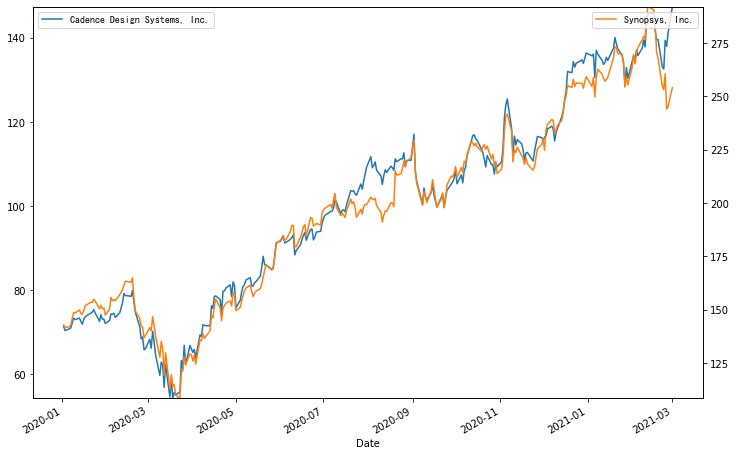

In [ ]:
# Pick 2 stocks price chart to to show the price correlation
stockA = 'Cadence Design Systems, Inc.'
stockB = 'Synopsys, Inc.'
plotPair(stocks, stockA, stockB, CHART_SIZE_X, CHART_SIZE_Y)


 353 : Discovery, Inc. - Series A vs Discovery, Inc. - Series C ( 0.9913 )


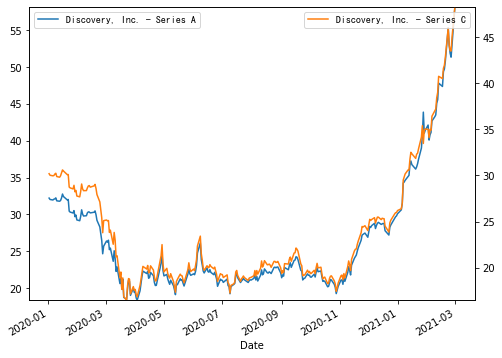


 253 : Cadence Design Systems, Inc. vs Synopsys, Inc. ( 0.9898 )


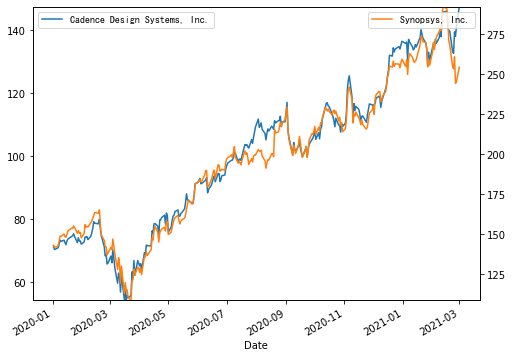


 456 : Fate Therapeutics, Inc. vs Intellia Therapeutics, Inc. ( 0.987 )


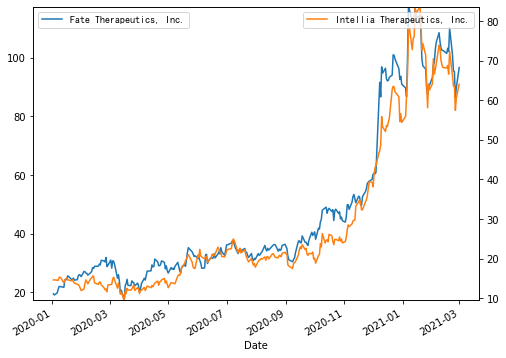


 33 : Analog Devices, Inc. vs Microchip Technology Incorporat ( 0.9855 )


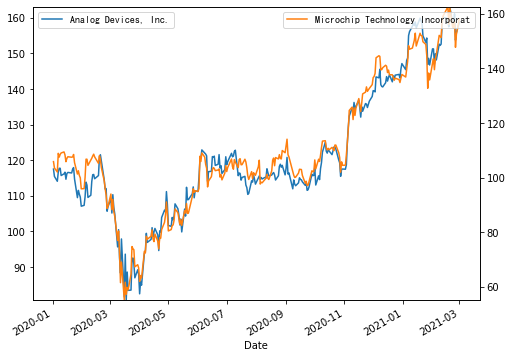


 204 : Beam Therapeutics Inc. vs Intellia Therapeutics, Inc. ( 0.9851 )


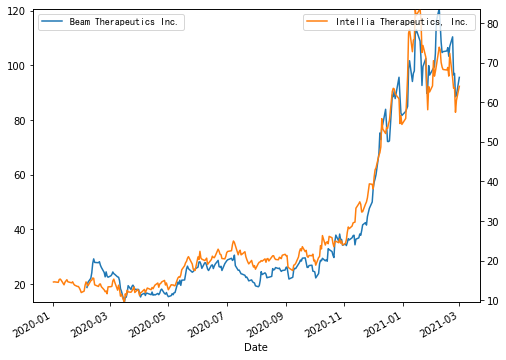


 760 : Magnite, Inc. vs MicroStrategy Incorporated ( 0.9846 )


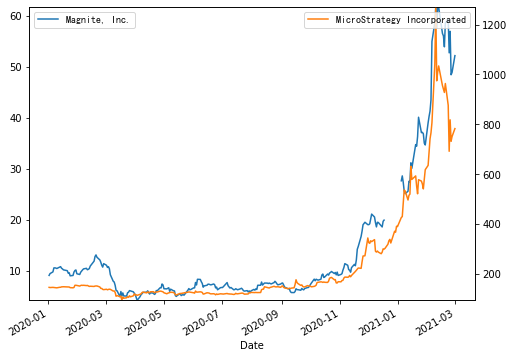


 191 : Broadcom Inc. vs Texas Instruments Incorporated ( 0.9844 )


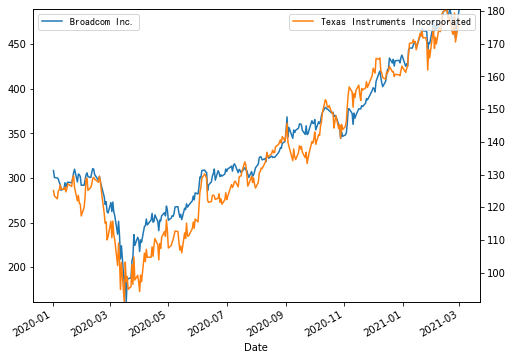


 565 : GrowGeneration Corp. vs Roku, Inc. ( 0.9843 )


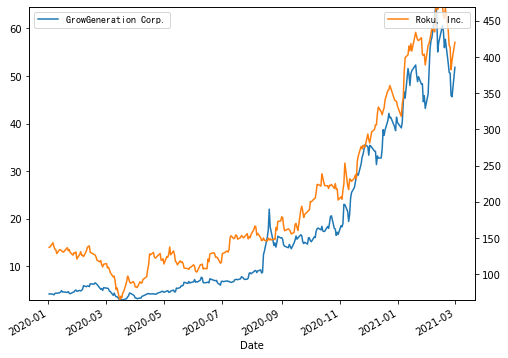


 680 : Logitech International S.A. - R vs Monolithic Power Systems, Inc. ( 0.9843 )


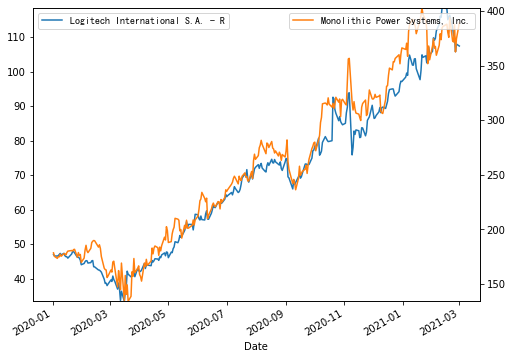


 674 : KLA Corporation vs Teradyne, Inc. ( 0.9841 )


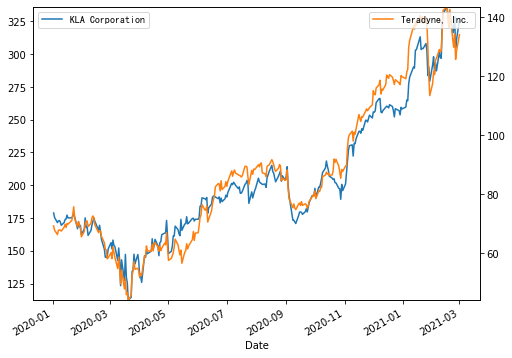


 828 : Maxim Integrated Products, Inc. vs Texas Instruments Incorporated ( 0.984 )


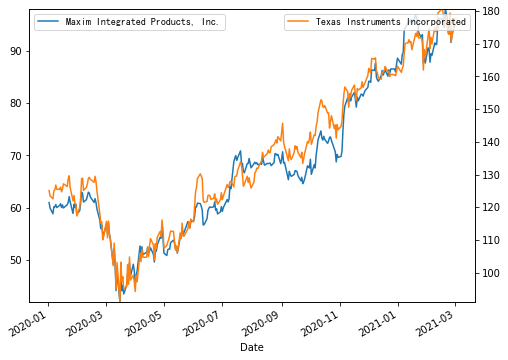


 823 : Maxim Integrated Products, Inc. vs Qorvo, Inc. ( 0.9835 )


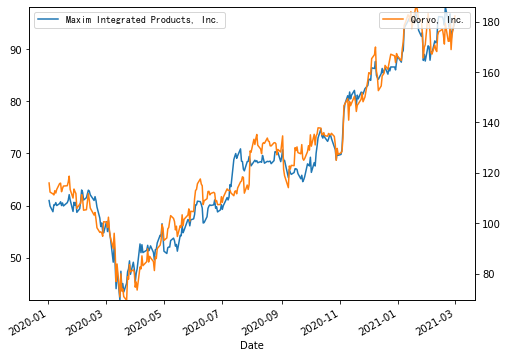


 246 : Cadence Design Systems, Inc. vs Monolithic Power Systems, Inc. ( 0.9833 )


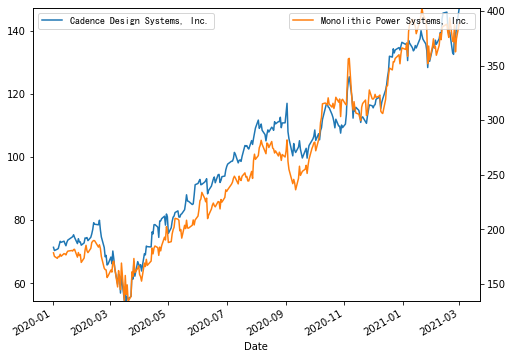


 332 : CrowdStrike Holdings, Inc. vs Zscaler, Inc. ( 0.9832 )


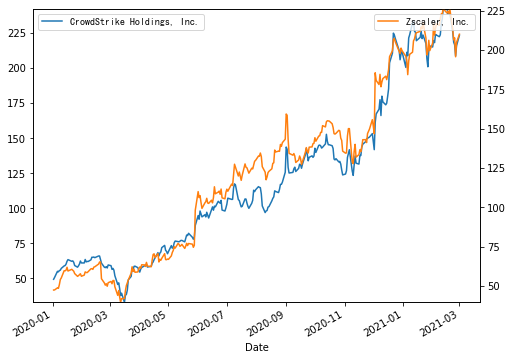


 897 : NXP Semiconductors N.V. vs ON Semiconductor Corporation ( 0.9822 )


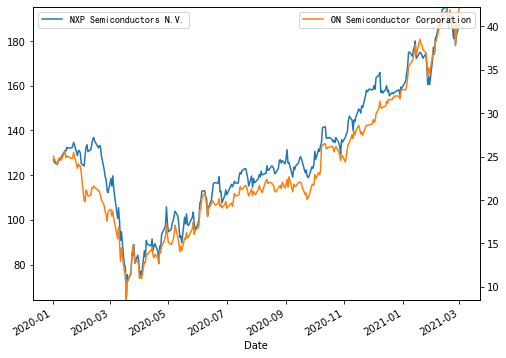


 425 : Etsy, Inc. vs MercadoLibre, Inc. ( 0.9818 )


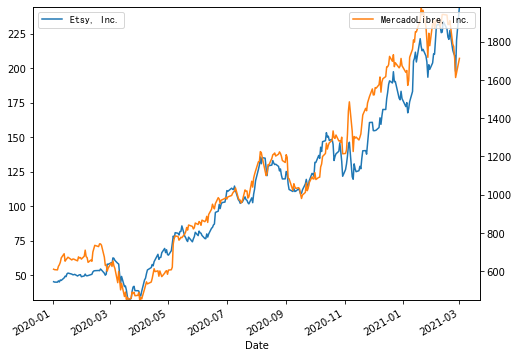


 862 : Natera, Inc. vs Twist Bioscience Corporation ( 0.9813 )


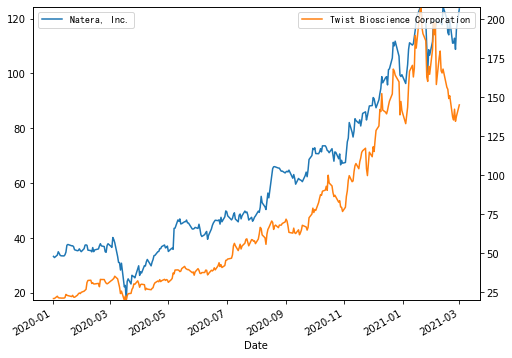


 486 : Five9, Inc. vs Monolithic Power Systems, Inc. ( 0.9808 )


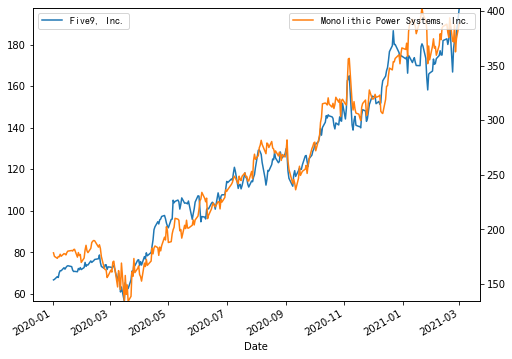


 536 : Futu Holdings Limited vs UP Fintech Holding Limited ( 0.9807 )


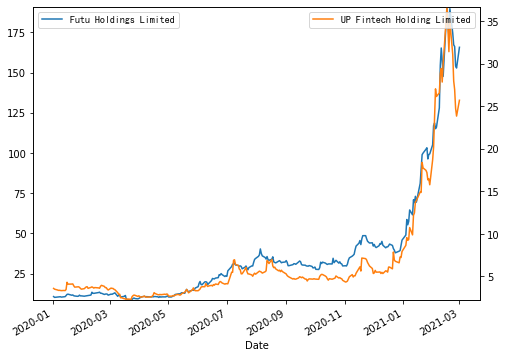


 954 : Qorvo, Inc. vs Texas Instruments Incorporated ( 0.9806 )


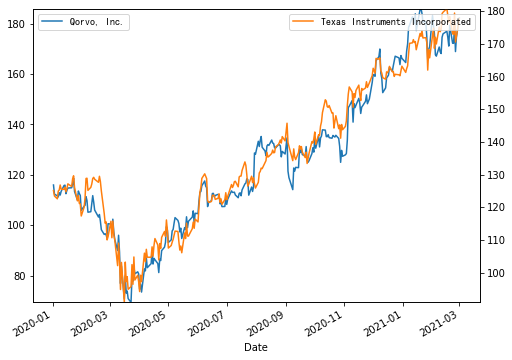


 200 : Beam Therapeutics Inc. vs Fate Therapeutics, Inc. ( 0.9804 )


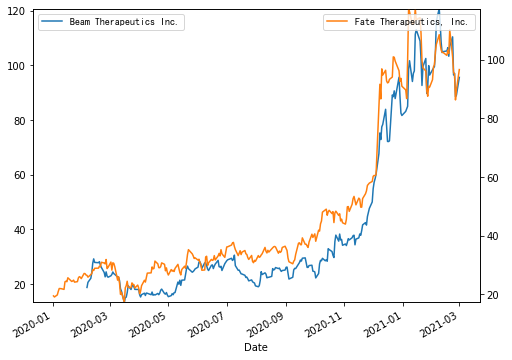


 793 : Marvell Technology Group Ltd. vs Synopsys, Inc. ( 0.9802 )


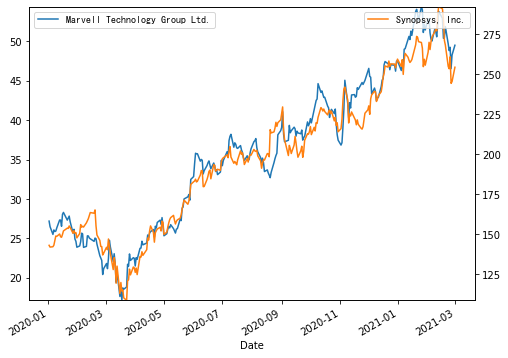


 694 : Logitech International S.A. - R vs Zscaler, Inc. ( 0.9798 )


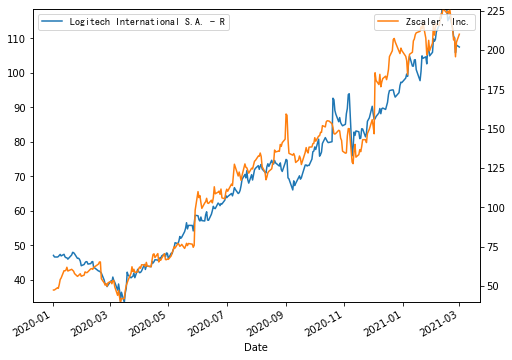


 255 : Cadence Design Systems, Inc. vs Zscaler, Inc. ( 0.9795 )


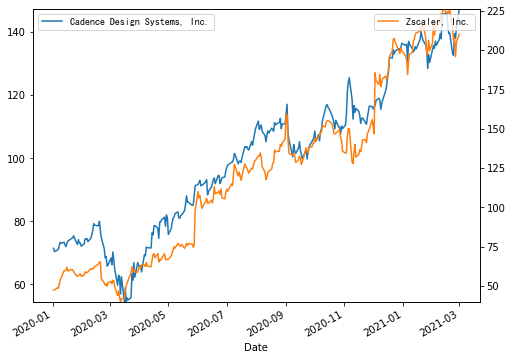


 984 : Synopsys, Inc. vs Zscaler, Inc. ( 0.9795 )


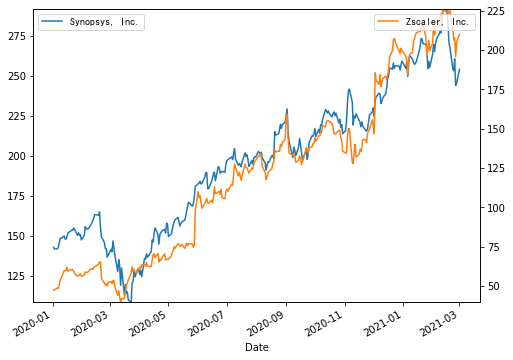


 125 : Digital Turbine, Inc. vs Zillow Group, Inc. ( 0.979 )


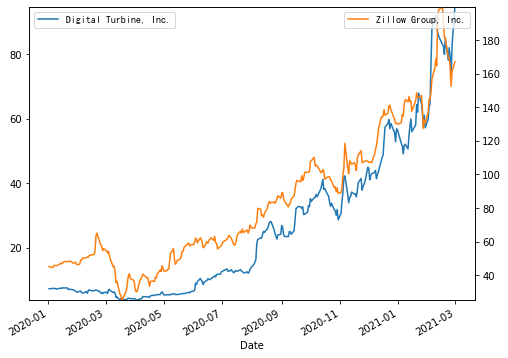


 697 : Lam Research Corporation vs Maxim Integrated Products, Inc. ( 0.979 )


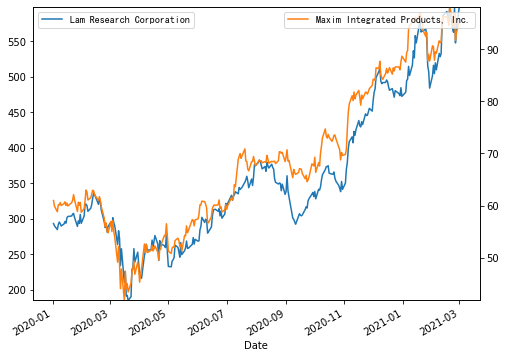


 315 : CrowdStrike Holdings, Inc. vs MongoDB, Inc. ( 0.9785 )


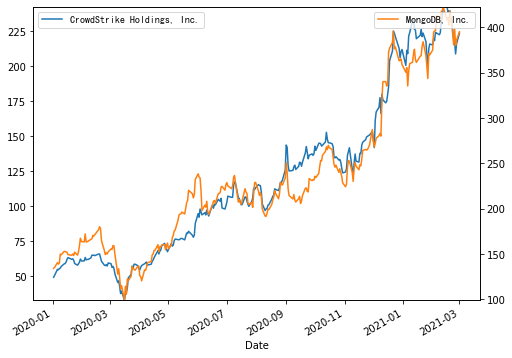


 433 : Etsy, Inc. vs PayPal Holdings, Inc. ( 0.9785 )


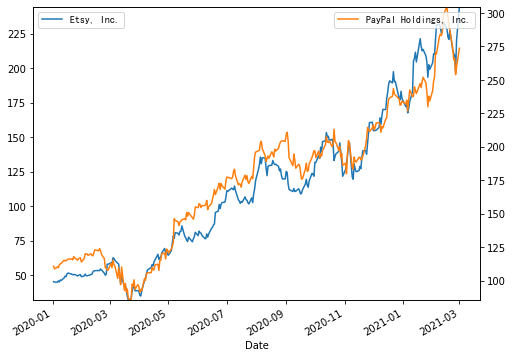


 467 : Fifth Third Bancorp vs Huntington Bancshares Incorpora ( 0.9783 )


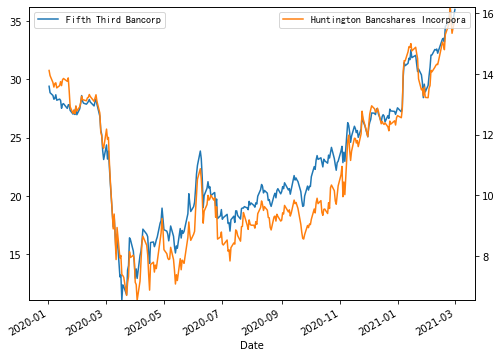


 782 : Monolithic Power Systems, Inc. vs Synopsys, Inc. ( 0.9782 )


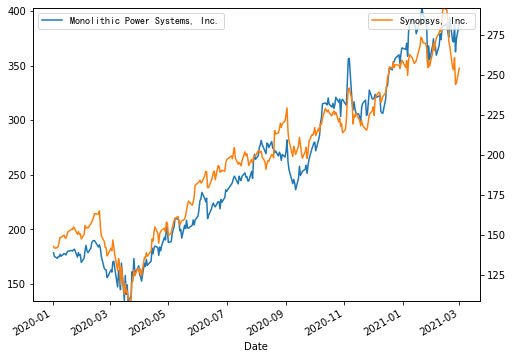


 238 : Cadence Design Systems, Inc. vs Five9, Inc. ( 0.9779 )


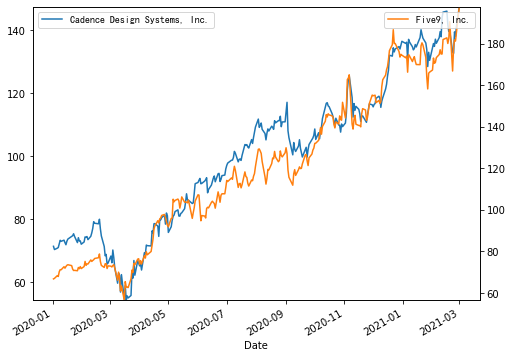


 243 : Cadence Design Systems, Inc. vs Logitech International S.A. - R ( 0.9776 )


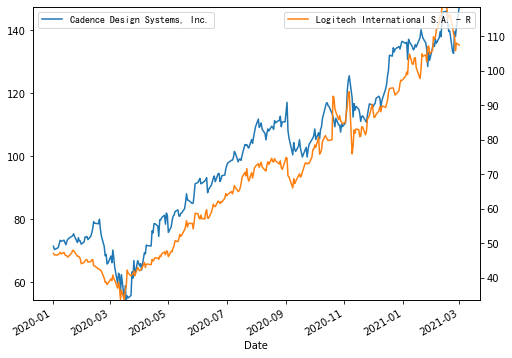


 183 : Broadcom Inc. vs Qorvo, Inc. ( 0.9771 )


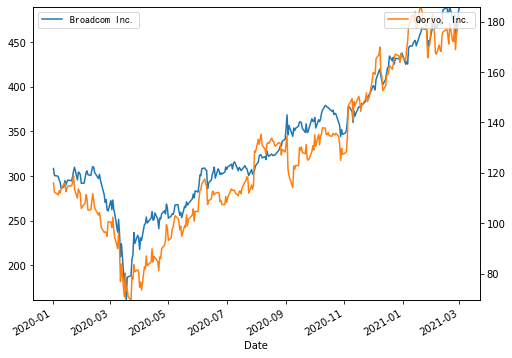


 589 : Huntington Bancshares Incorpora vs WSFS Financial Corporation ( 0.9767 )


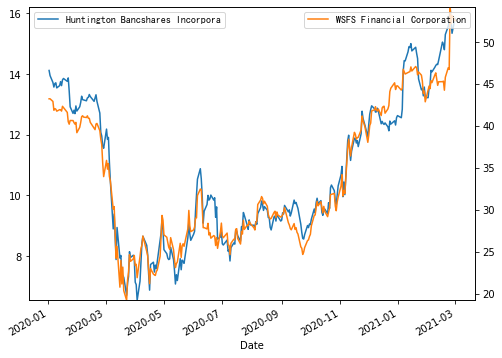


 689 : Logitech International S.A. - R vs Synopsys, Inc. ( 0.9764 )


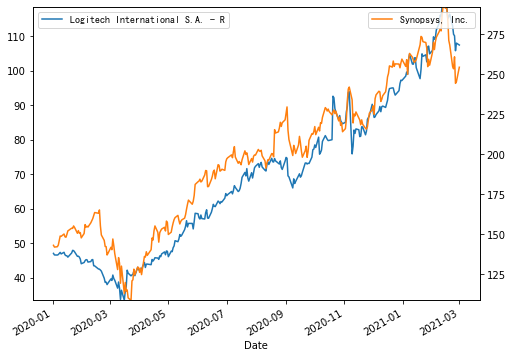


 129 : ASML Holding N.V. - New York Re vs Cree, Inc. ( 0.9755 )


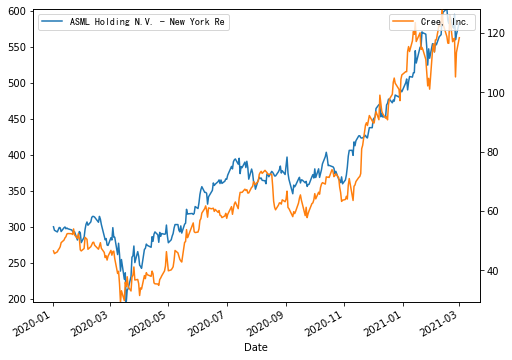


 177 : Broadcom Inc. vs Maxim Integrated Products, Inc. ( 0.9747 )


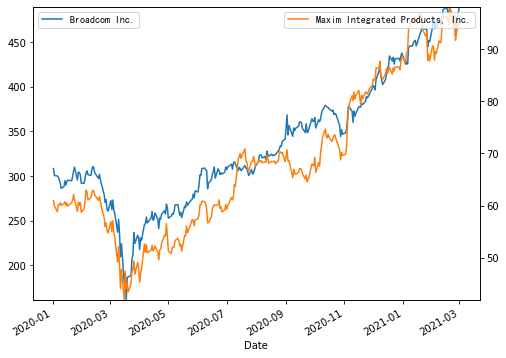


 838 : NICE Ltd vs Synopsys, Inc. ( 0.9745 )


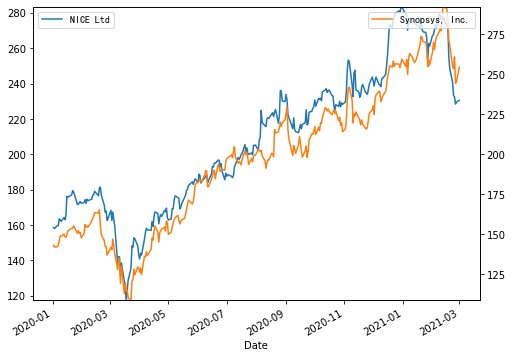


 251 : Cadence Design Systems, Inc. vs Okta, Inc. ( 0.9739 )


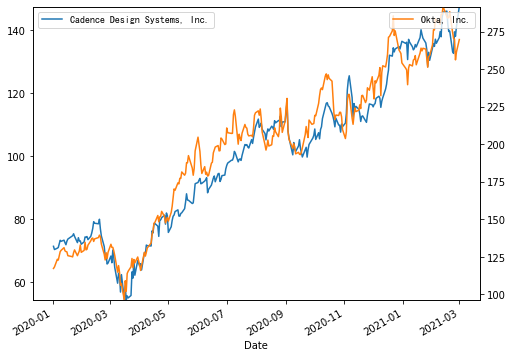


 716 : Microchip Technology Incorporat vs NXP Semiconductors N.V. ( 0.9738 )


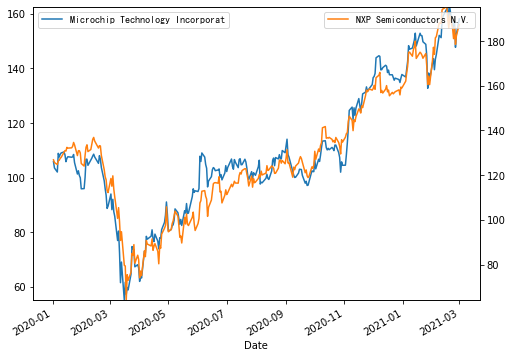


 484 : Five9, Inc. vs Logitech International S.A. - R ( 0.9737 )


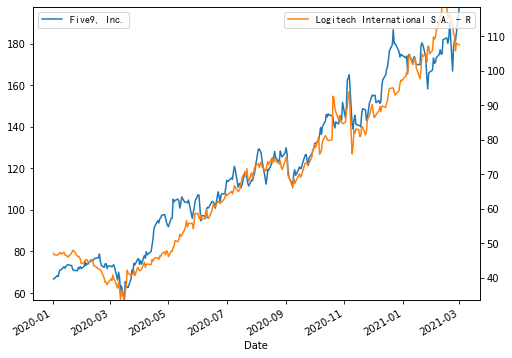


 320 : CrowdStrike Holdings, Inc. vs Nuance Communications, Inc. ( 0.9736 )


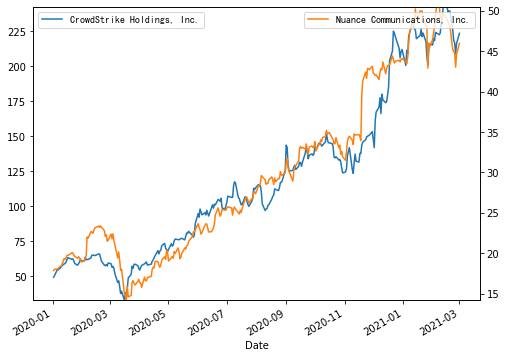


 95 : ANSYS, Inc. vs Synopsys, Inc. ( 0.9731 )


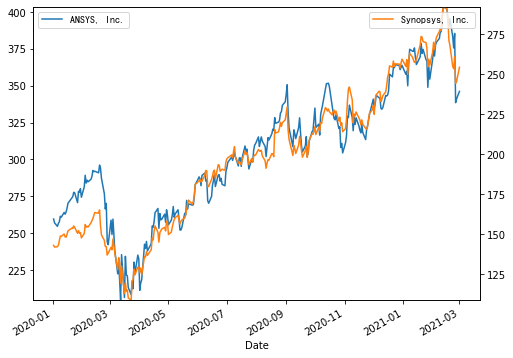


 530 : First Solar, Inc. vs QUALCOMM Incorporated ( 0.9731 )


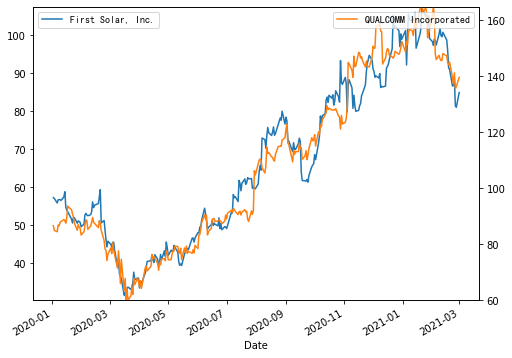


 712 : Marathon Patent Group, Inc. vs Riot Blockchain, Inc ( 0.973 )


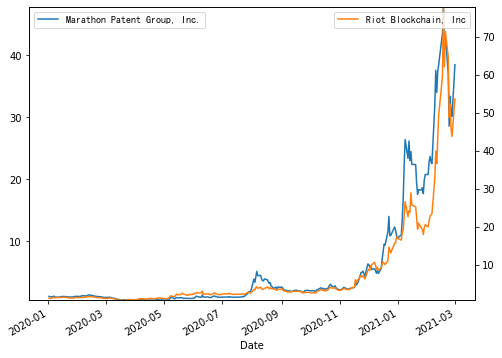


 498 : Five9, Inc. vs Zscaler, Inc. ( 0.9727 )


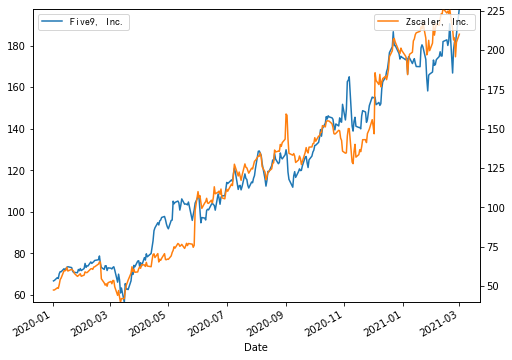


 710 : Marathon Patent Group, Inc. vs MicroStrategy Incorporated ( 0.9726 )


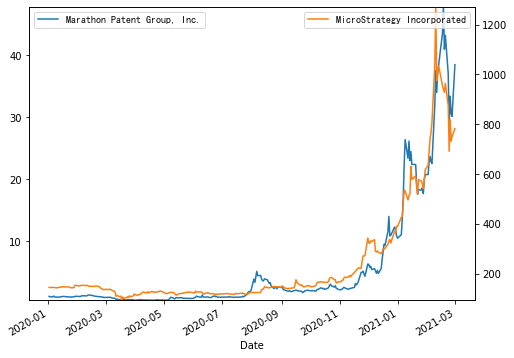


 580 : Halozyme Therapeutics, Inc. vs Natera, Inc. ( 0.9725 )


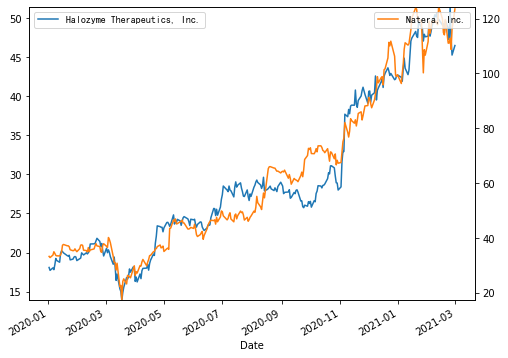


 72 : Applied Materials, Inc. vs Lam Research Corporation ( 0.9724 )


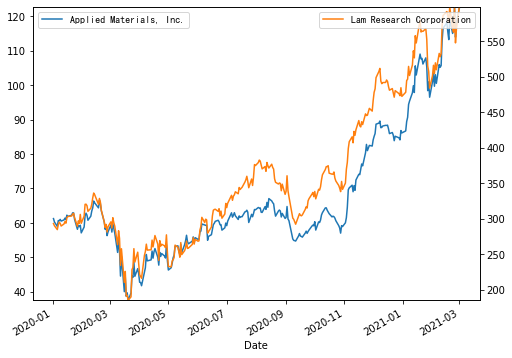


 786 : Monolithic Power Systems, Inc. vs Zscaler, Inc. ( 0.9724 )


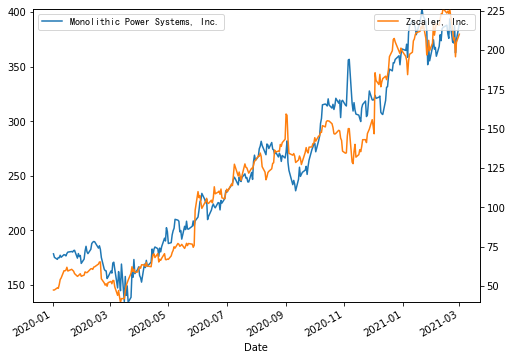


 629 : II-VI Incorporated vs KLA Corporation ( 0.9721 )


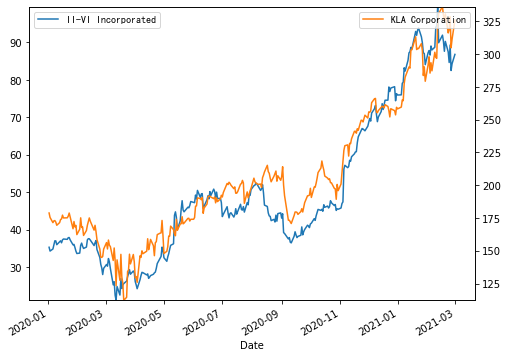


 261 : Coupa Software Incorporated vs DocuSign, Inc. ( 0.9721 )


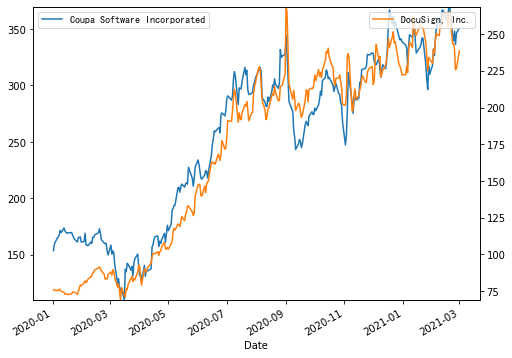


 306 : CRISPR Therapeutics AG vs Twist Bioscience Corporation ( 0.972 )


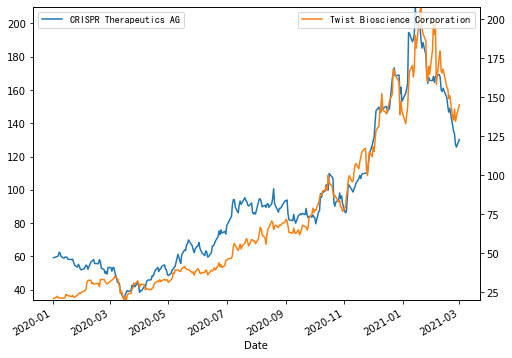


 247 : Cadence Design Systems, Inc. vs Marvell Technology Group Ltd. ( 0.972 )


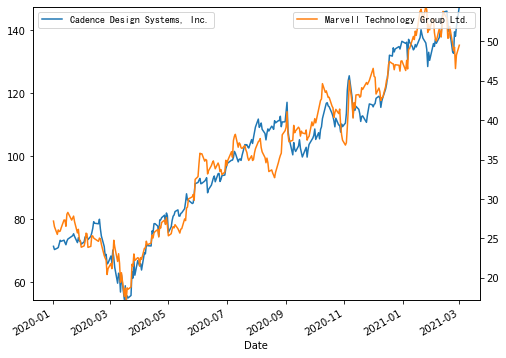


 367 : DocuSign, Inc. vs NVIDIA Corporation ( 0.9717 )


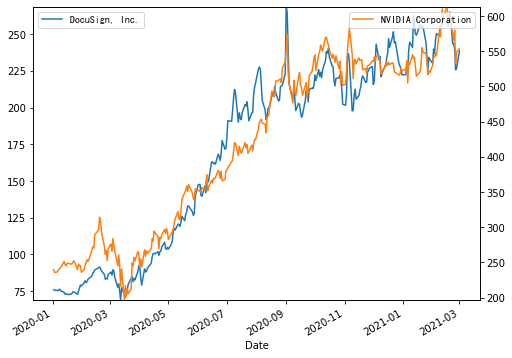


 907 : Okta, Inc. vs Synopsys, Inc. ( 0.9716 )


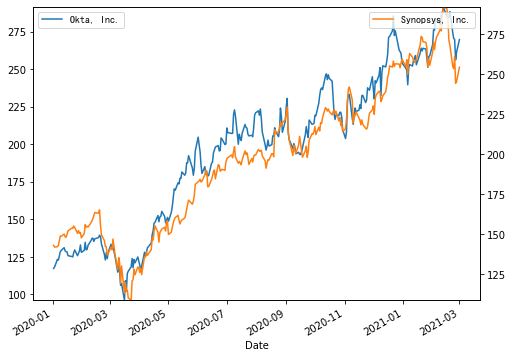


 794 : Marvell Technology Group Ltd. vs Zscaler, Inc. ( 0.9715 )


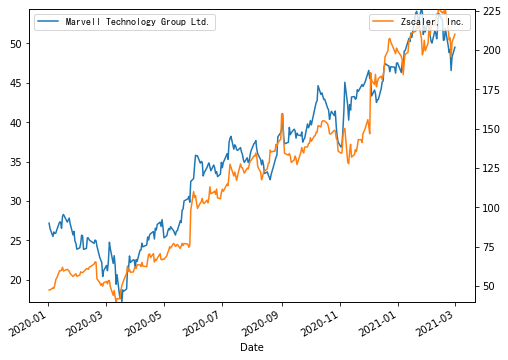


 771 : Monolithic Power Systems, Inc. vs Marvell Technology Group Ltd. ( 0.9714 )


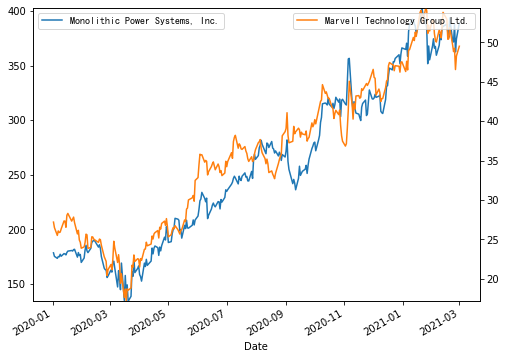


 647 : Intuit Inc. vs Texas Instruments Incorporated ( 0.9707 )


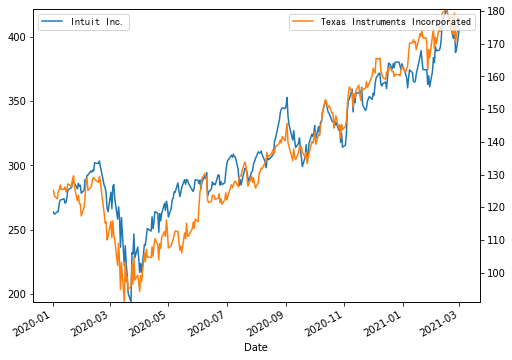


 1003 : The Trade Desk, Inc. vs Xilinx, Inc. ( 0.9704 )


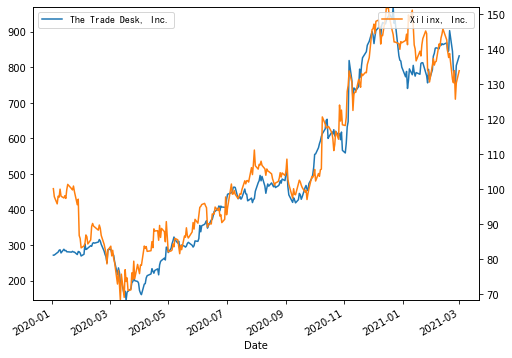


 1 : American Airlines Group, Inc. vs United Continental Holdings, In ( 0.9703 )


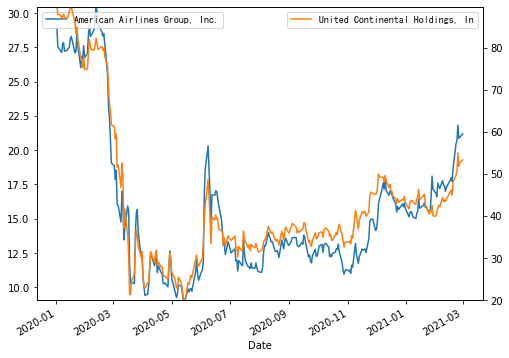


 139 : ASML Holding N.V. - New York Re vs MongoDB, Inc. ( 0.9699 )


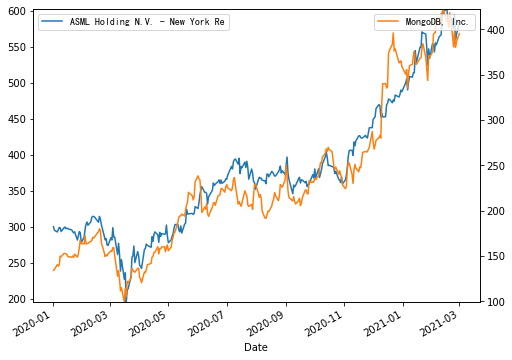


 249 : Cadence Design Systems, Inc. vs Match Group, Inc. ( 0.9699 )


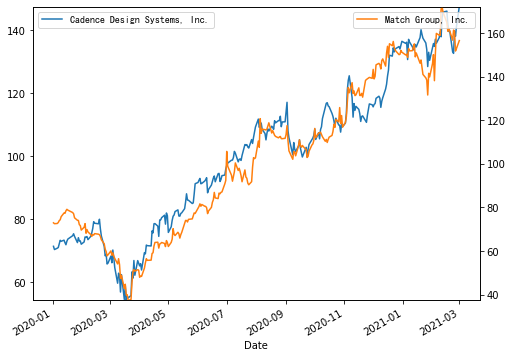


 491 : Five9, Inc. vs Okta, Inc. ( 0.9698 )


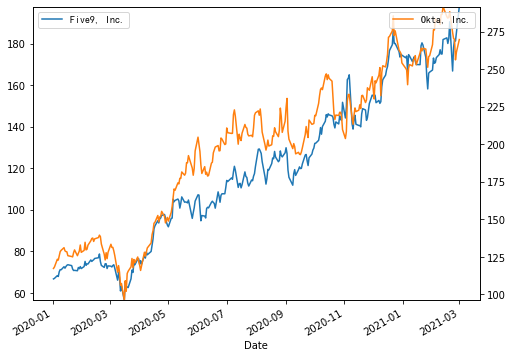


 717 : Microchip Technology Incorporat vs ON Semiconductor Corporation ( 0.9695 )


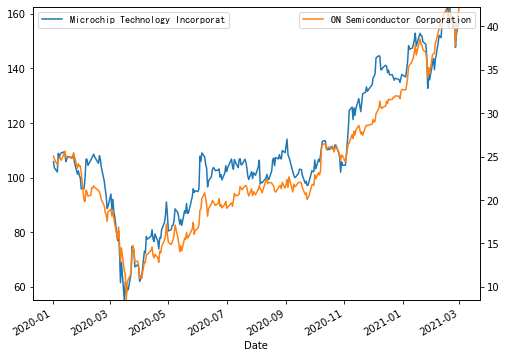


 171 : Broadcom Inc. vs Intuit Inc. ( 0.9694 )


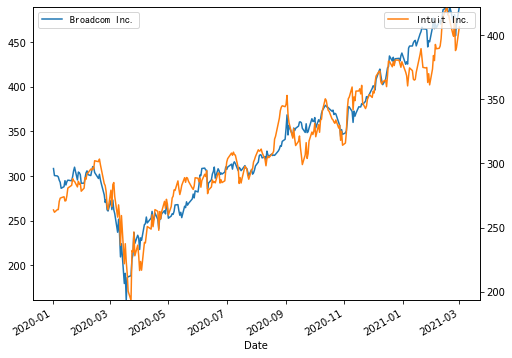


 744 : MercadoLibre, Inc. vs PayPal Holdings, Inc. ( 0.9691 )


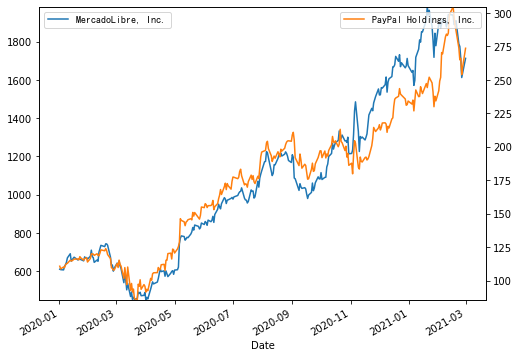


 314 : CrowdStrike Holdings, Inc. vs Logitech International S.A. - R ( 0.969 )


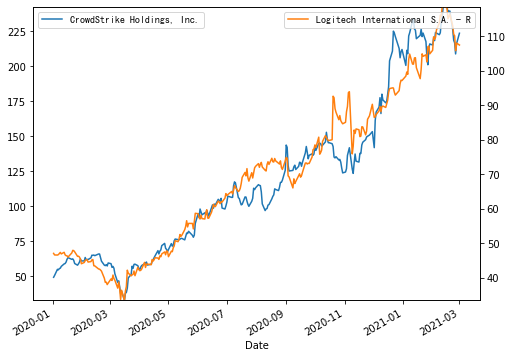


 772 : Monolithic Power Systems, Inc. vs Match Group, Inc. ( 0.9688 )


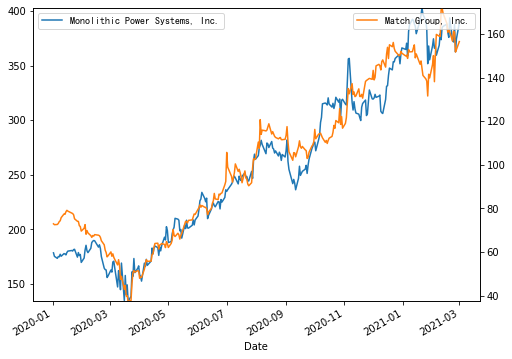


 265 : Coupa Software Incorporated vs Okta, Inc. ( 0.9687 )


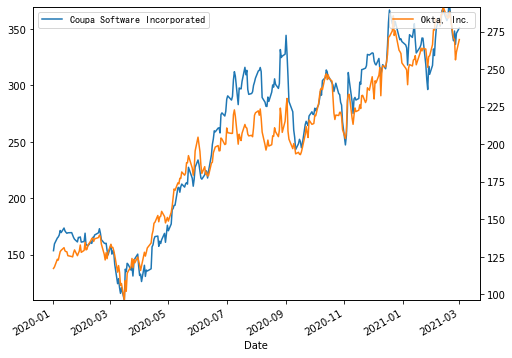


 334 : Canadian Solar Inc. vs Enphase Energy, Inc. ( 0.9687 )


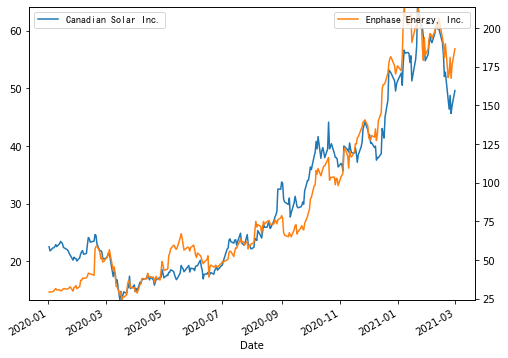


 807 : Match Group, Inc. vs Synopsys, Inc. ( 0.9687 )


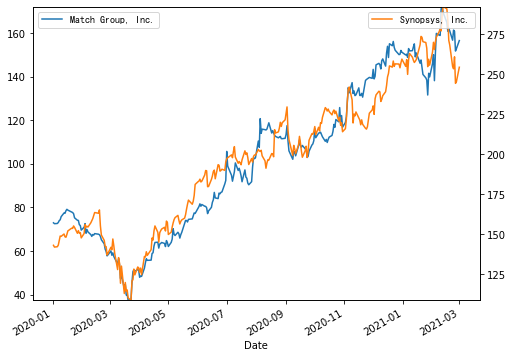


 681 : Logitech International S.A. - R vs Marvell Technology Group Ltd. ( 0.9687 )


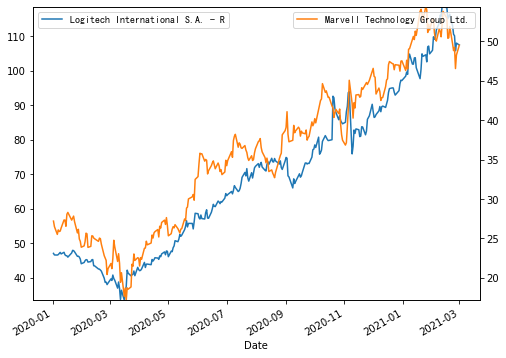


 909 : Okta, Inc. vs Zscaler, Inc. ( 0.9685 )


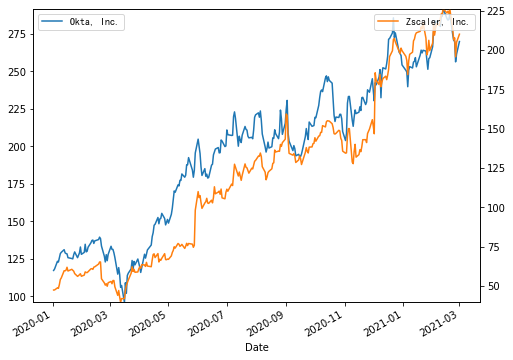


 550 : Guardant Health, Inc. vs Natera, Inc. ( 0.9685 )


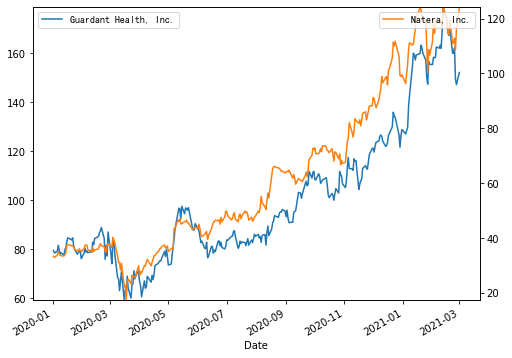


 682 : Logitech International S.A. - R vs Match Group, Inc. ( 0.9684 )


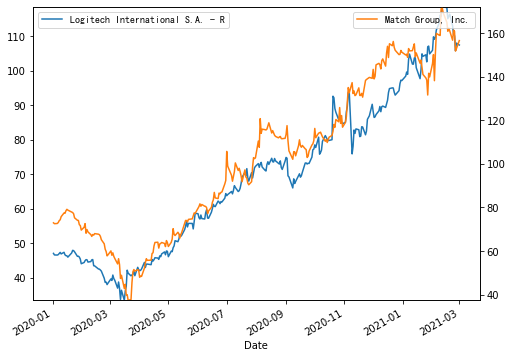


 707 : Lam Research Corporation vs Zebra Technologies Corporation ( 0.9684 )


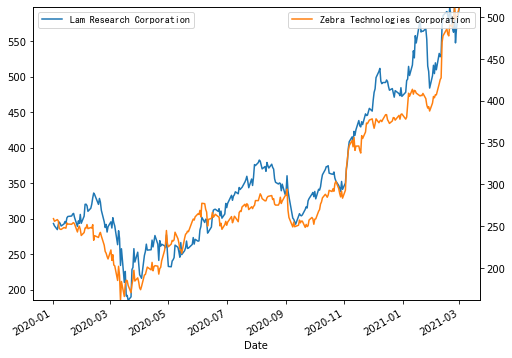


 179 : Broadcom Inc. vs Nuance Communications, Inc. ( 0.9683 )


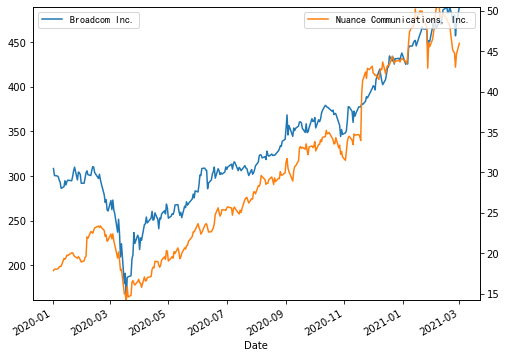


 48 : Autodesk, Inc. vs Synopsys, Inc. ( 0.9683 )


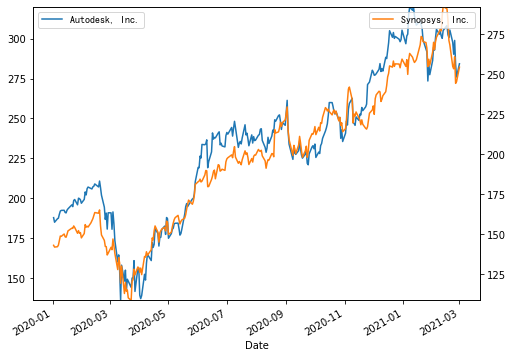


 19 : Apple Inc. vs Yandex N.V. ( 0.9682 )


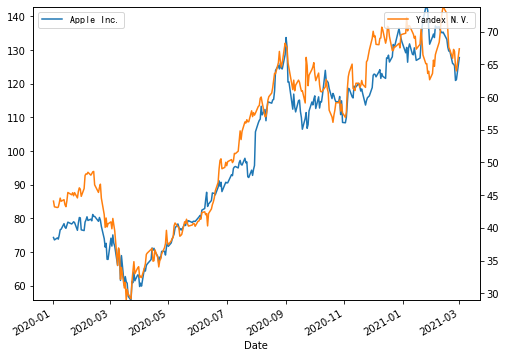


 254 : Cadence Design Systems, Inc. vs Take-Two Interactive Software,  ( 0.968 )


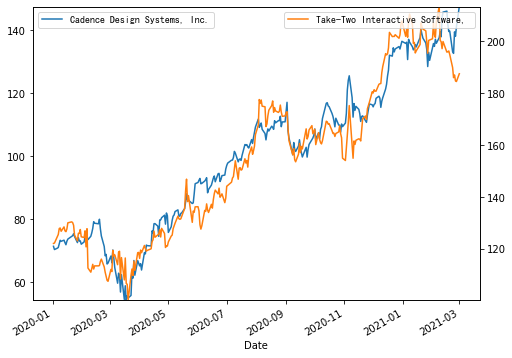


 495 : Five9, Inc. vs Synopsys, Inc. ( 0.968 )


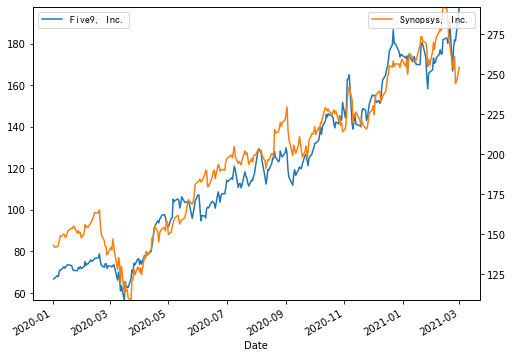


 211 : Baidu, Inc. vs Magnite, Inc. ( 0.9679 )


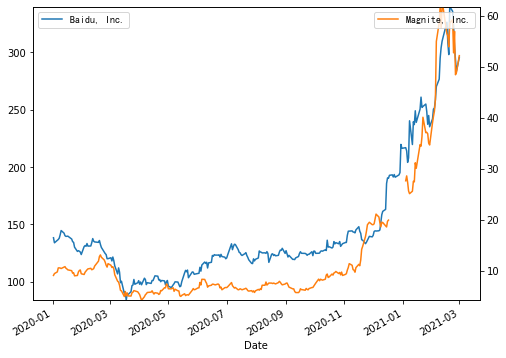


 250 : Cadence Design Systems, Inc. vs NICE Ltd ( 0.9677 )


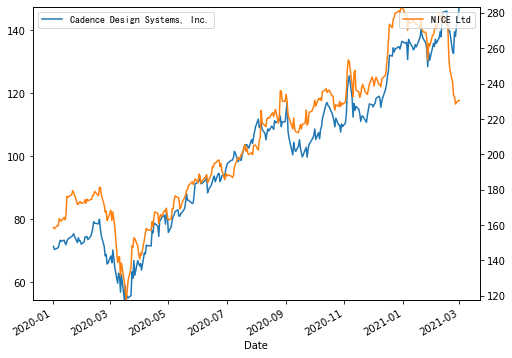


 987 : StoneCo Ltd. vs Texas Instruments Incorporated ( 0.9676 )


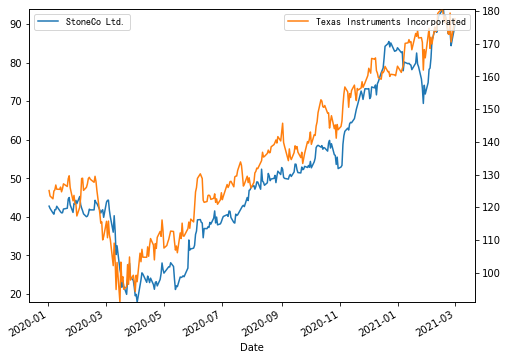


 14 : Apple Inc. vs NICE Ltd ( 0.9676 )


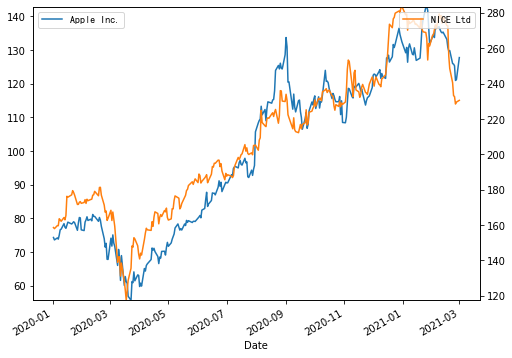


 949 : QUALCOMM Incorporated vs Texas Instruments Incorporated ( 0.9673 )


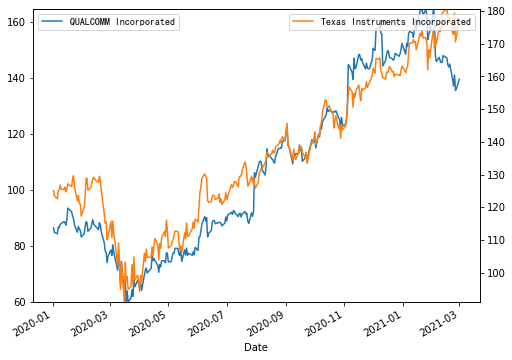


 765 : MKS Instruments, Inc. vs Teradyne, Inc. ( 0.9672 )


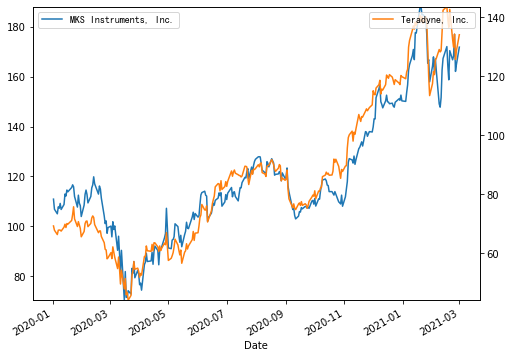


 824 : Maxim Integrated Products, Inc. vs StoneCo Ltd. ( 0.9666 )


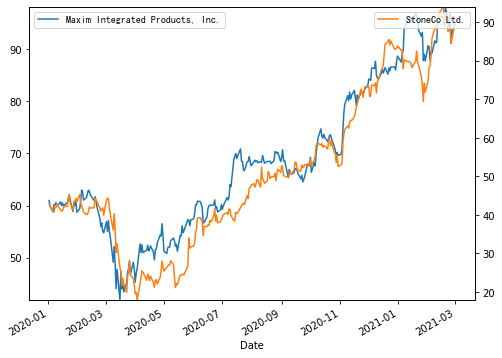


 350 : Caesars Entertainment, Inc. vs Expedia Group, Inc. ( 0.9666 )


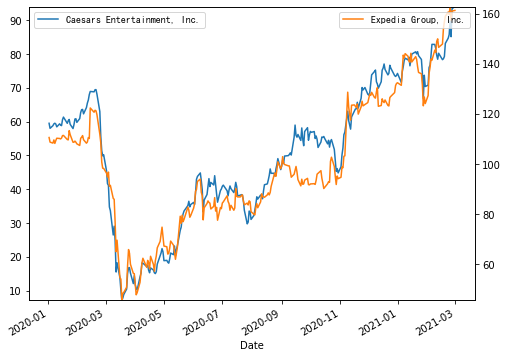


 154 : ASML Holding N.V. - New York Re vs Varonis Systems, Inc. ( 0.9666 )


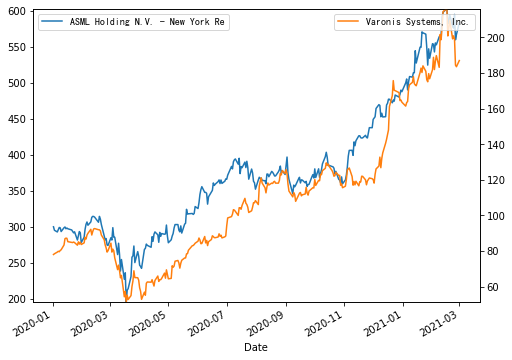


 715 : Microchip Technology Incorporat vs Maxim Integrated Products, Inc. ( 0.9663 )


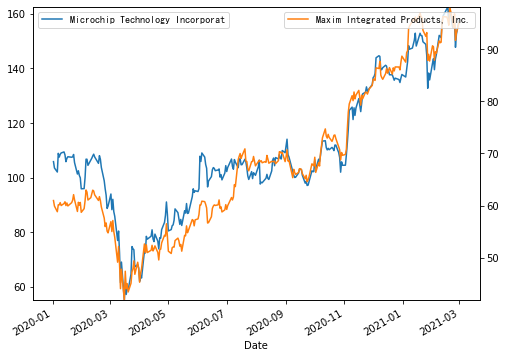


 1004 : Take-Two Interactive Software,  vs Zscaler, Inc. ( 0.9663 )


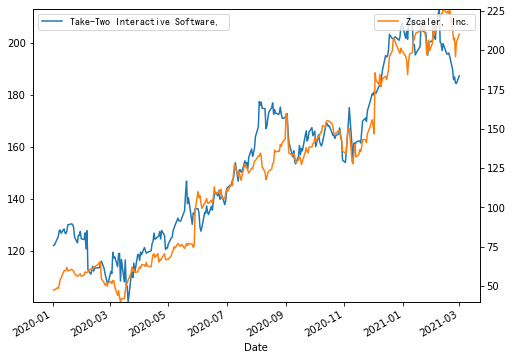


 278 : Cree, Inc. vs Lam Research Corporation ( 0.9662 )


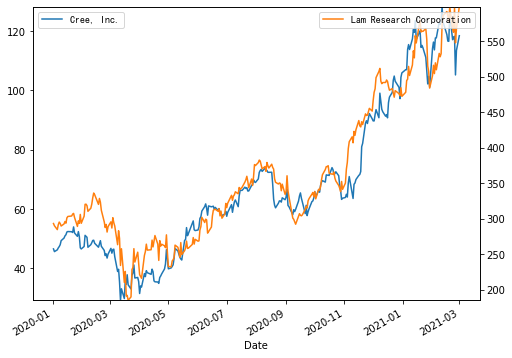


 947 : QUALCOMM Incorporated vs Qorvo, Inc. ( 0.9661 )


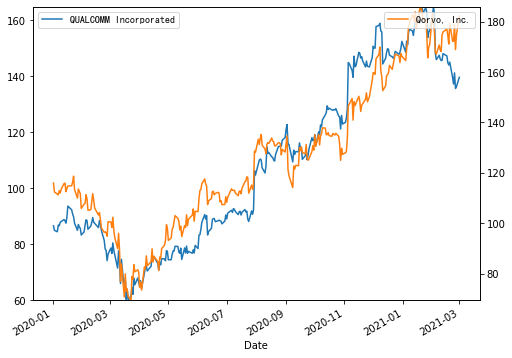


 1011 : Upwork Inc. vs Zebra Technologies Corporation ( 0.9661 )


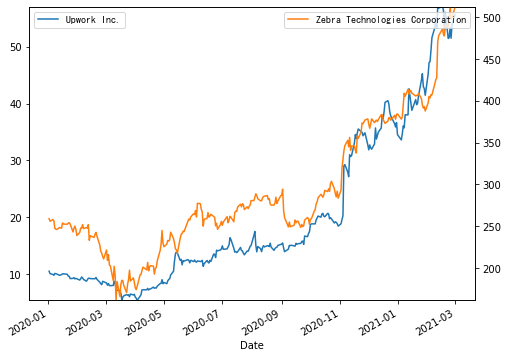


 742 : MercadoLibre, Inc. vs Pinduoduo Inc. ( 0.9661 )


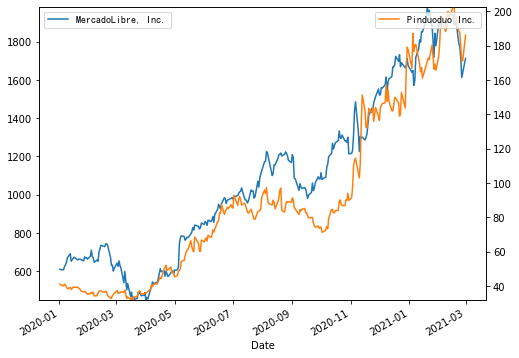


 819 : Maxim Integrated Products, Inc. vs Nuance Communications, Inc. ( 0.9661 )


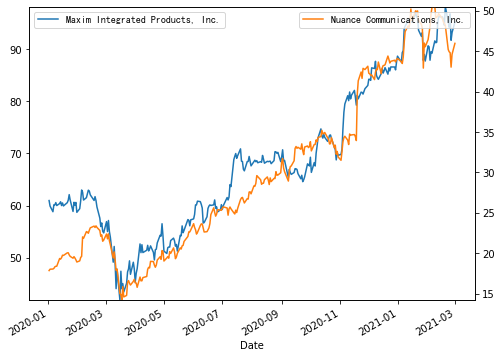


 130 : ASML Holding N.V. - New York Re vs CrowdStrike Holdings, Inc. ( 0.9659 )


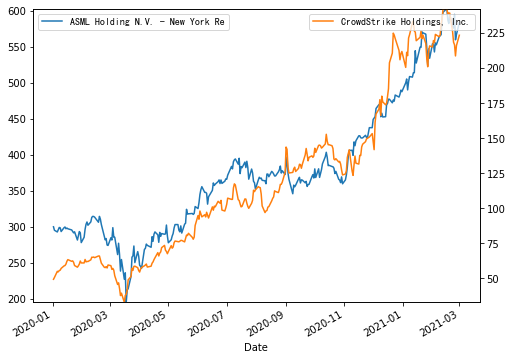


 74 : Applied Materials, Inc. vs Micron Technology, Inc. ( 0.9659 )


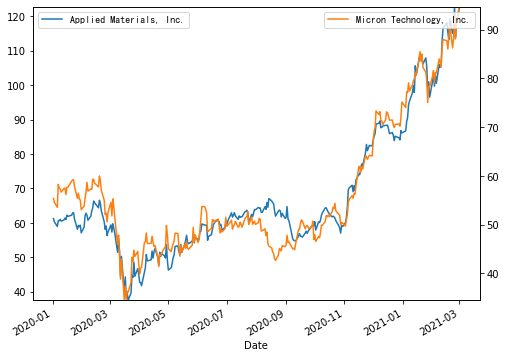


 282 : Cree, Inc. vs Maxim Integrated Products, Inc. ( 0.9657 )


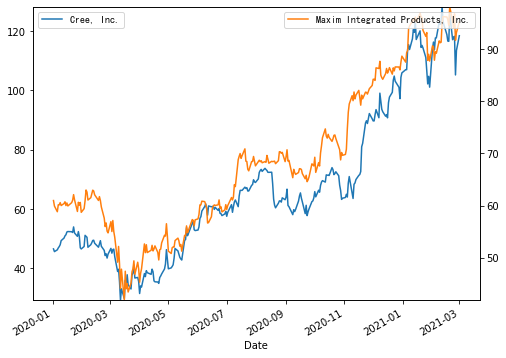


 110 : Appian Corporation vs Upwork Inc. ( 0.9657 )


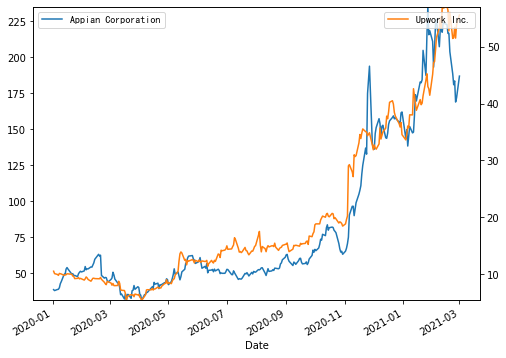


 192 : Broadcom Inc. vs Varonis Systems, Inc. ( 0.9654 )


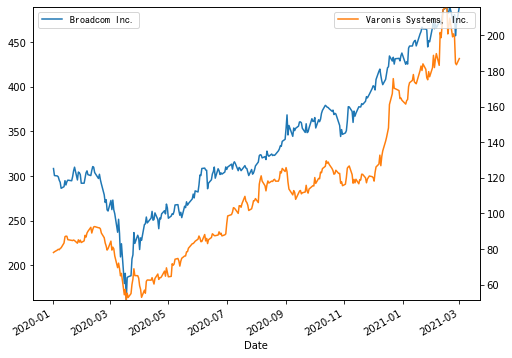


 468 : Fifth Third Bancorp vs WSFS Financial Corporation ( 0.965 )


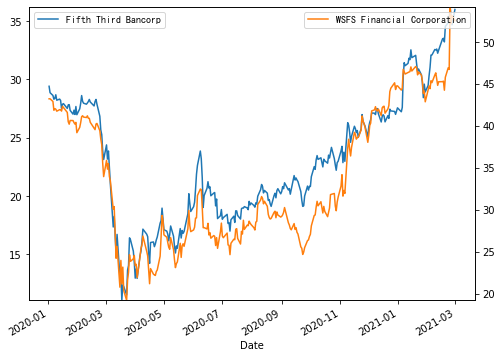


 586 : Halozyme Therapeutics, Inc. vs Twist Bioscience Corporation ( 0.9648 )


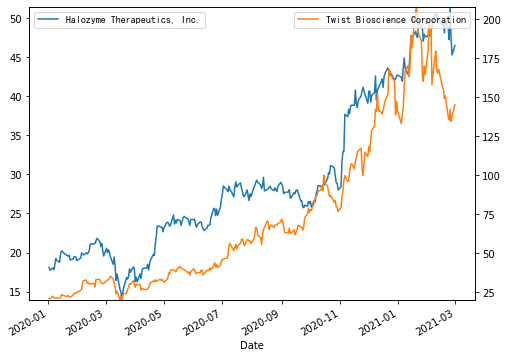


 138 : ASML Holding N.V. - New York Re vs Lam Research Corporation ( 0.9647 )


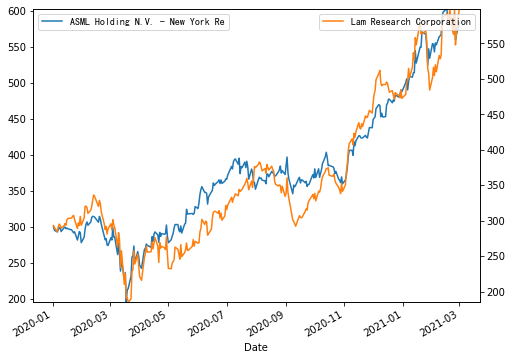


 781 : Monolithic Power Systems, Inc. vs SolarEdge Technologies, Inc. ( 0.9647 )


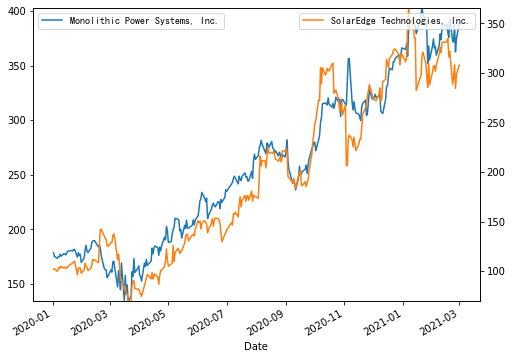


 91 : ANSYS, Inc. vs Intuit Inc. ( 0.9647 )


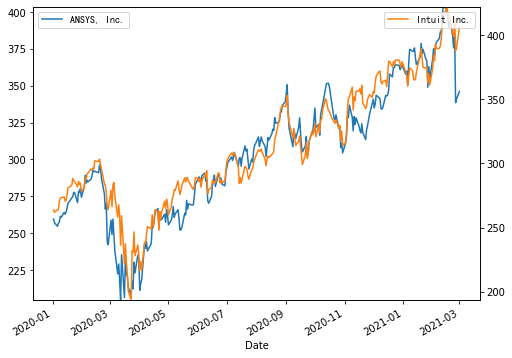


 812 : Match Group, Inc. vs Texas Instruments Incorporated ( 0.9645 )


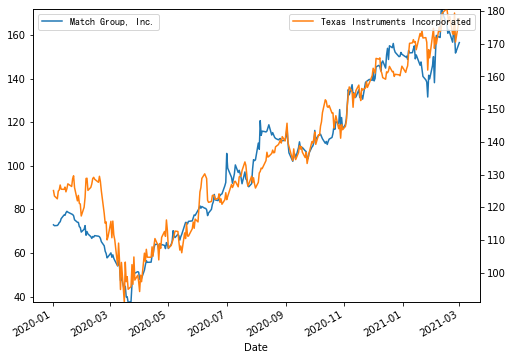


 540 : GDS Holdings Limited vs Logitech International S.A. - R ( 0.9644 )


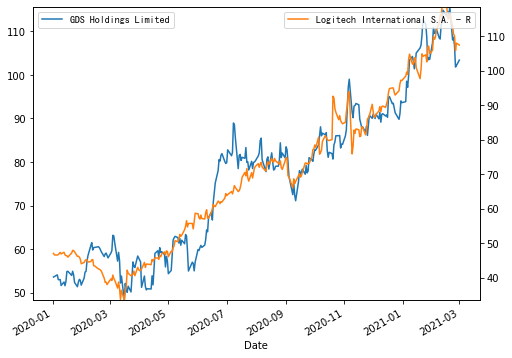


 806 : Match Group, Inc. vs Qorvo, Inc. ( 0.9644 )


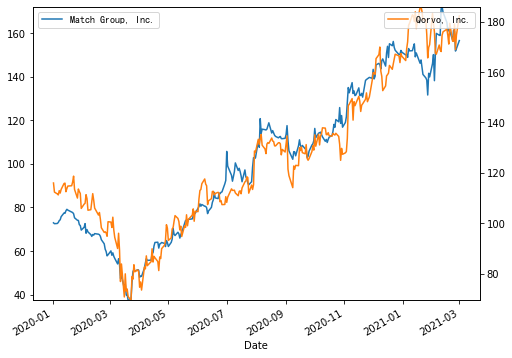


 105 : Appian Corporation vs Nano Dimension Ltd. ( 0.9644 )


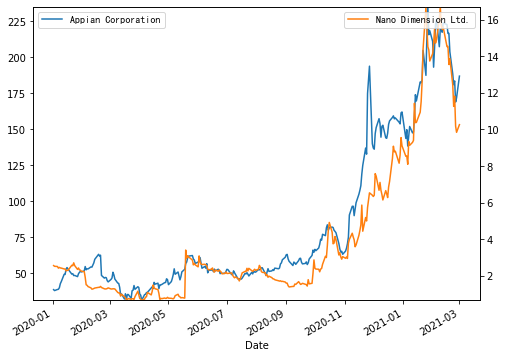


 383 : Enphase Energy, Inc. vs Nuance Communications, Inc. ( 0.9643 )


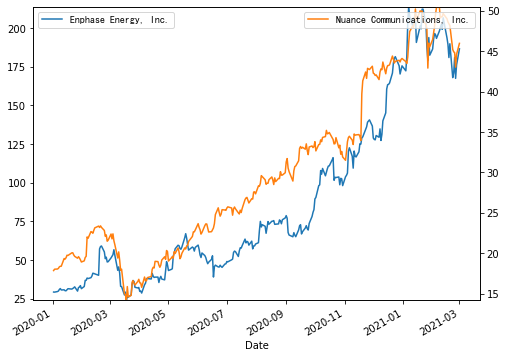


 393 : Entegris, Inc. vs Freshpet, Inc. ( 0.9643 )


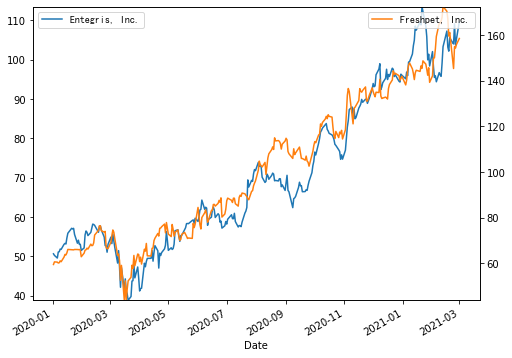


 109 : Appian Corporation vs SunPower Corporation ( 0.9642 )


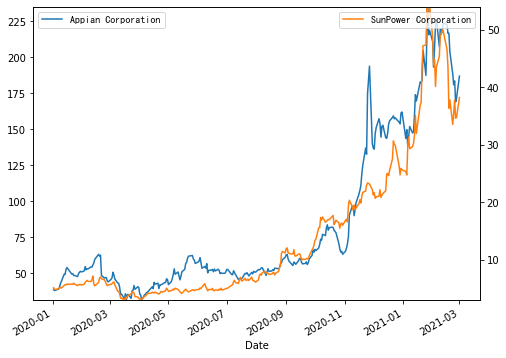


 667 : KLA Corporation vs MKS Instruments, Inc. ( 0.9639 )


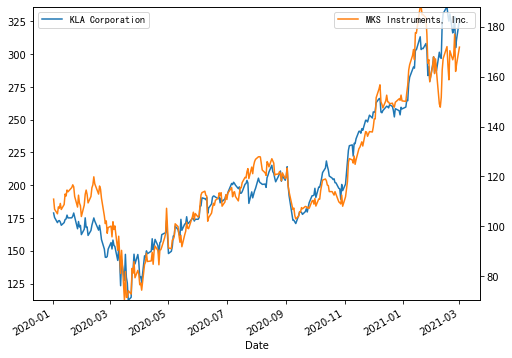


 533 : First Solar, Inc. vs Texas Instruments Incorporated ( 0.9639 )


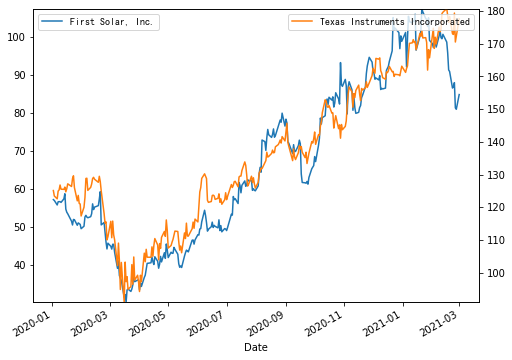


 832 : Maxim Integrated Products, Inc. vs Zebra Technologies Corporation ( 0.9637 )


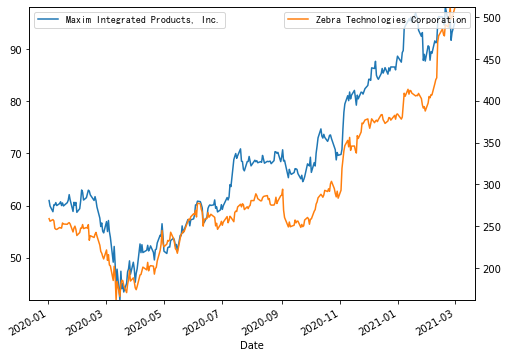


 293 : Cree, Inc. vs Varonis Systems, Inc. ( 0.9637 )


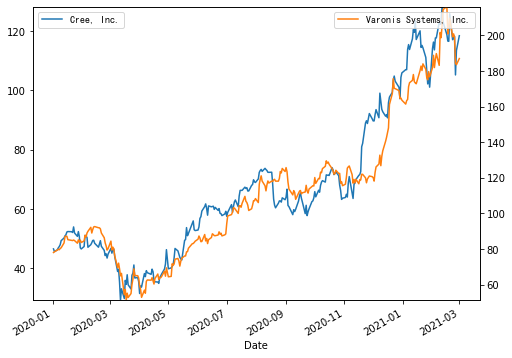


 810 : Match Group, Inc. vs The Trade Desk, Inc. ( 0.9635 )


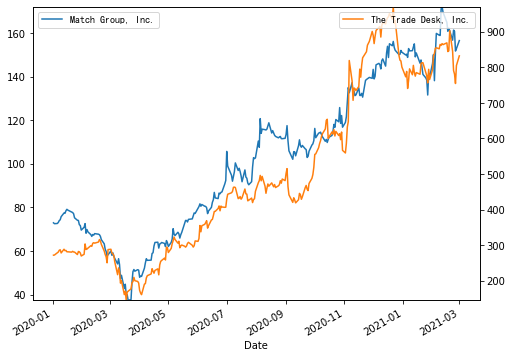


 801 : Match Group, Inc. vs NICE Ltd ( 0.9634 )


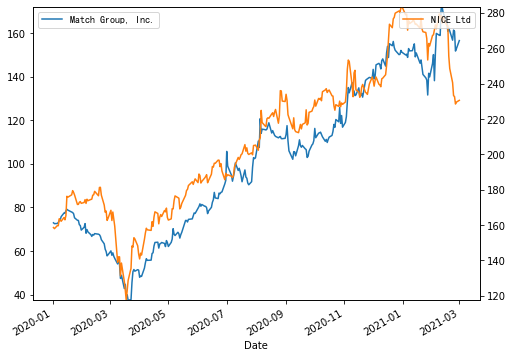


 872 : Nuance Communications, Inc. vs Qorvo, Inc. ( 0.9634 )


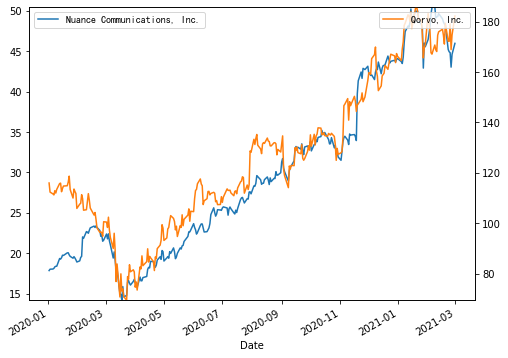


 774 : Monolithic Power Systems, Inc. vs NICE Ltd ( 0.9634 )


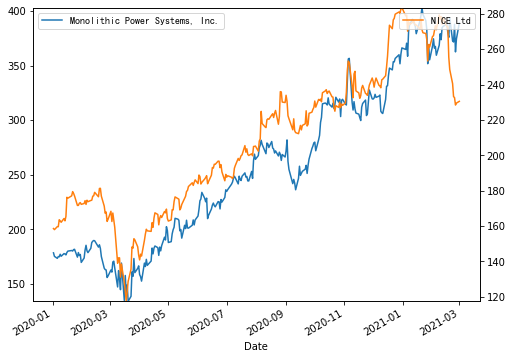


 83 : Amazon.com, Inc. vs Netflix, Inc. ( 0.9633 )


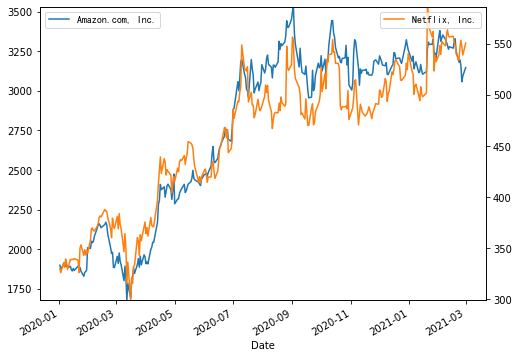


 186 : Broadcom Inc. vs StoneCo Ltd. ( 0.9633 )


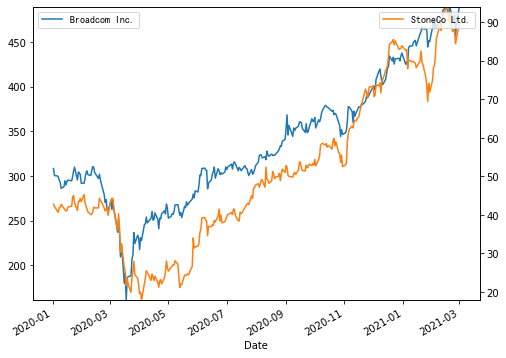


 545 : GDS Holdings Limited vs 21Vianet Group, Inc. ( 0.9633 )


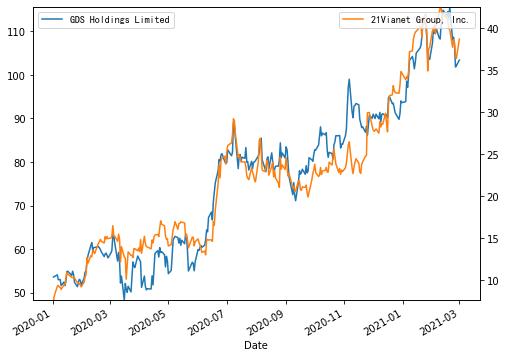


 225 : Ballard Power Systems, Inc. vs Plug Power, Inc. ( 0.9632 )


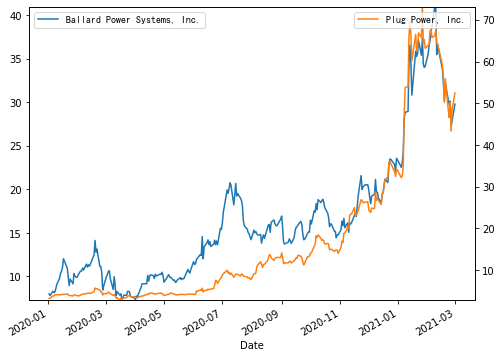


 327 : CrowdStrike Holdings, Inc. vs Synopsys, Inc. ( 0.9631 )


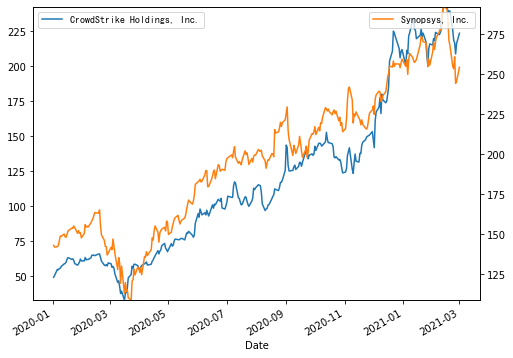


 310 : CrowdStrike Holdings, Inc. vs Five9, Inc. ( 0.9631 )


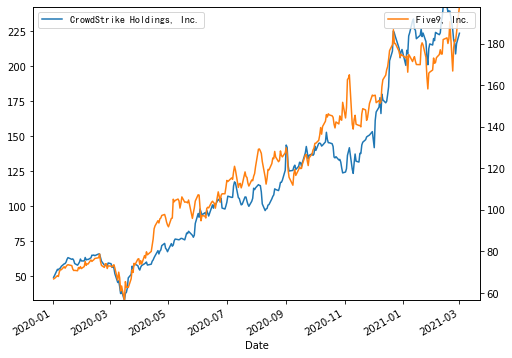


 43 : Analog Devices, Inc. vs Zebra Technologies Corporation ( 0.9629 )


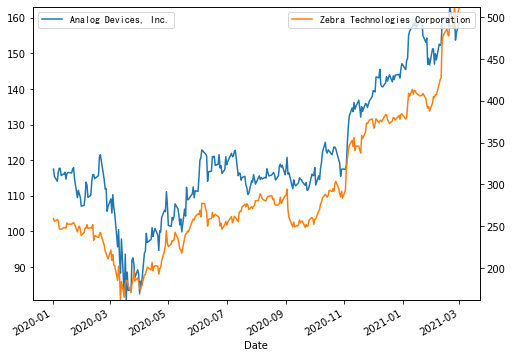


 17 : Apple Inc. vs Synopsys, Inc. ( 0.9629 )


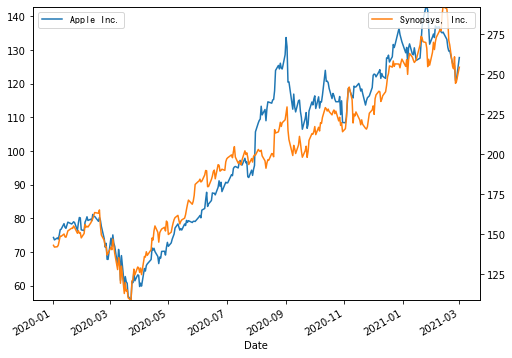


 722 : Microchip Technology Incorporat vs Texas Instruments Incorporated ( 0.9629 )


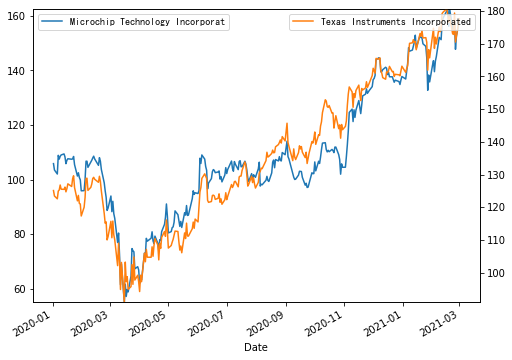


 317 : CrowdStrike Holdings, Inc. vs Monolithic Power Systems, Inc. ( 0.9628 )


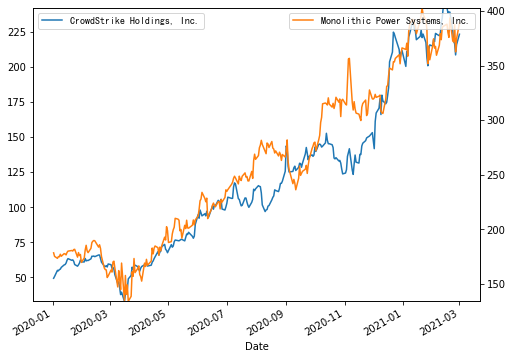


 330 : CrowdStrike Holdings, Inc. vs Varonis Systems, Inc. ( 0.9627 )


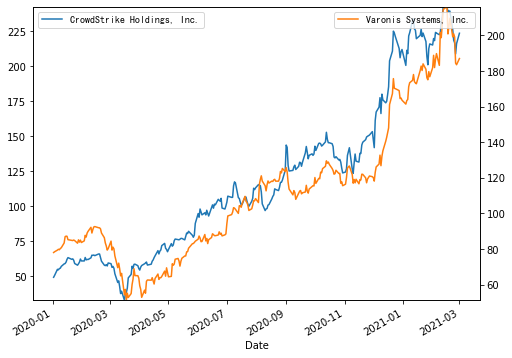


 800 : Match Group, Inc. vs Maxim Integrated Products, Inc. ( 0.9627 )


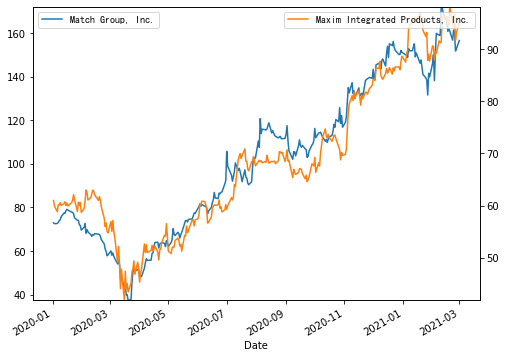


 948 : QUALCOMM Incorporated vs The Trade Desk, Inc. ( 0.9626 )


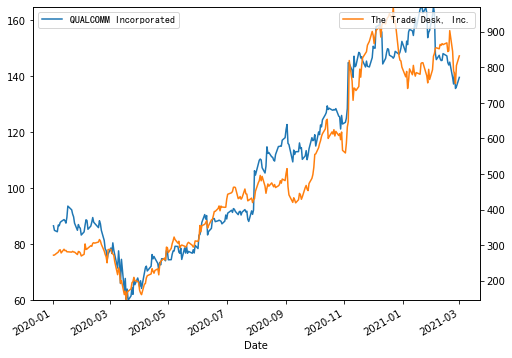


 776 : Monolithic Power Systems, Inc. vs Nuance Communications, Inc. ( 0.9626 )


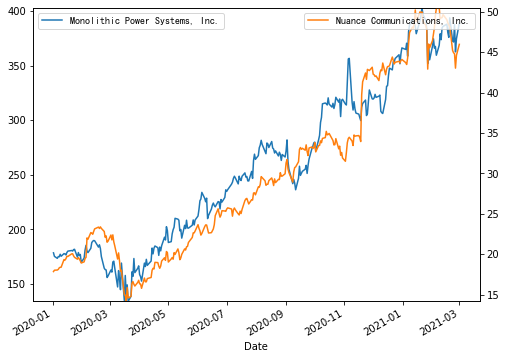


 884 : Nuance Communications, Inc. vs Texas Instruments Incorporated ( 0.9624 )


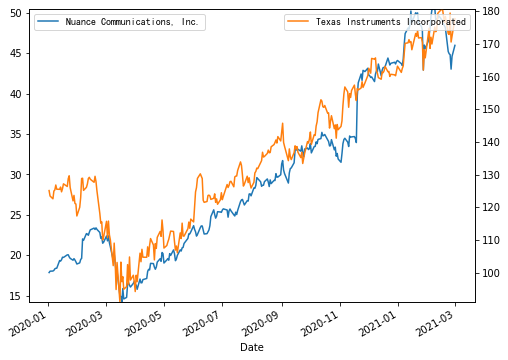


 635 : II-VI Incorporated vs Teradyne, Inc. ( 0.9622 )


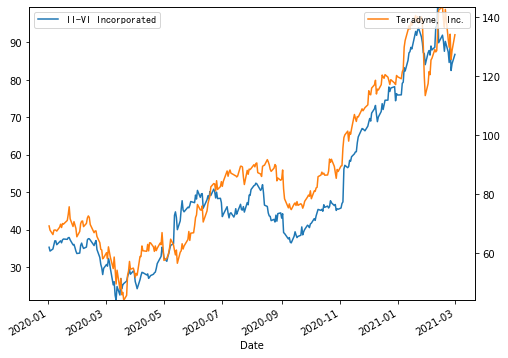


 81 : Applied Materials, Inc. vs Zebra Technologies Corporation ( 0.9621 )


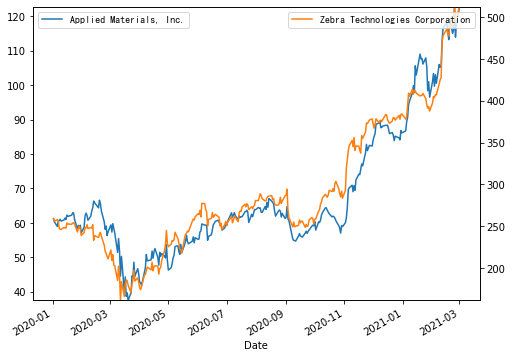


 279 : Cree, Inc. vs MongoDB, Inc. ( 0.9621 )


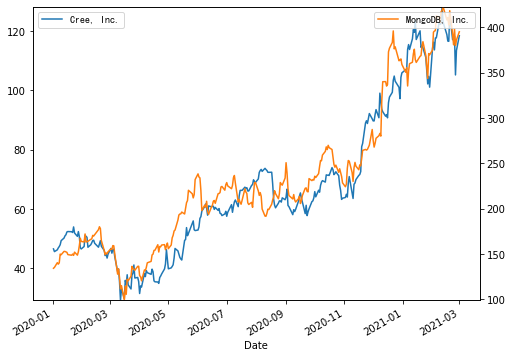


 369 : DocuSign, Inc. vs Okta, Inc. ( 0.962 )


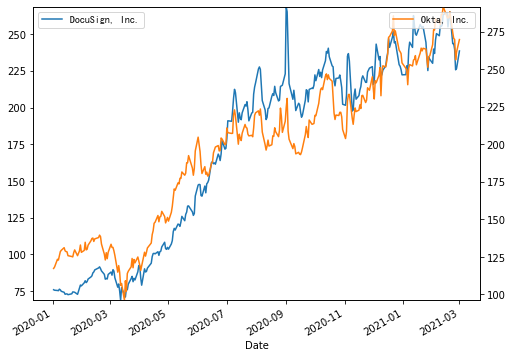


 351 : Datadog, Inc. vs DocuSign, Inc. ( 0.9619 )


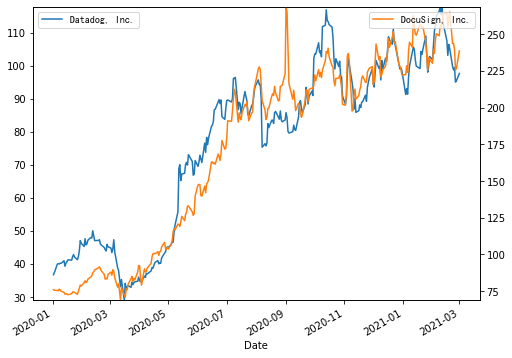


 871 : Nuance Communications, Inc. vs QUALCOMM Incorporated ( 0.9619 )


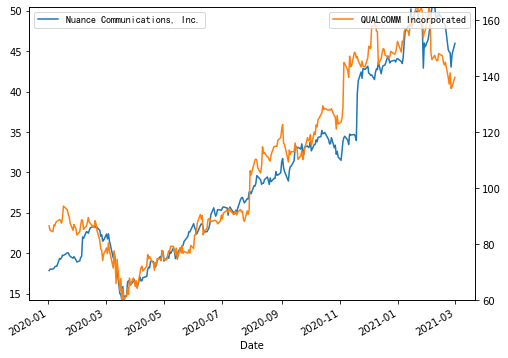


 730 : MongoDB, Inc. vs Atlassian Corporation Plc ( 0.9618 )


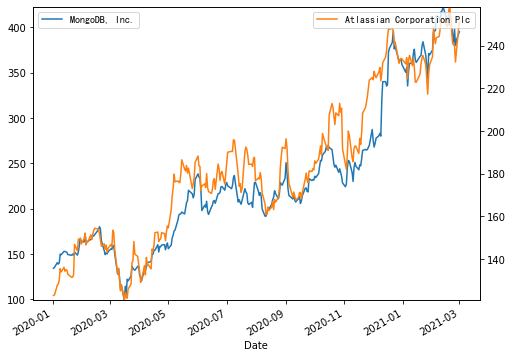


 141 : ASML Holding N.V. - New York Re vs Maxim Integrated Products, Inc. ( 0.9616 )


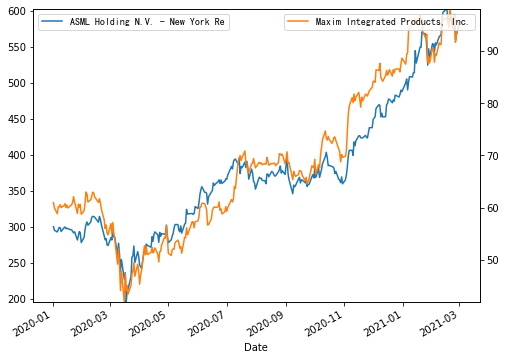


 2 : Apple Inc. vs Advanced Micro Devices, Inc. ( 0.9616 )


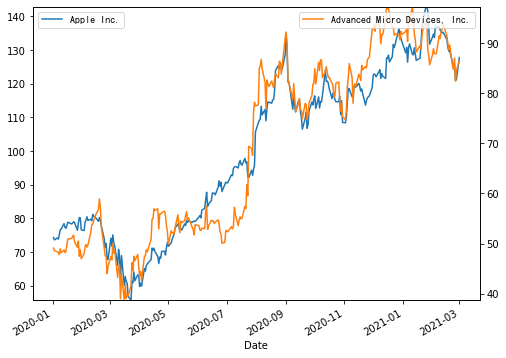


 318 : CrowdStrike Holdings, Inc. vs Marvell Technology Group Ltd. ( 0.9615 )


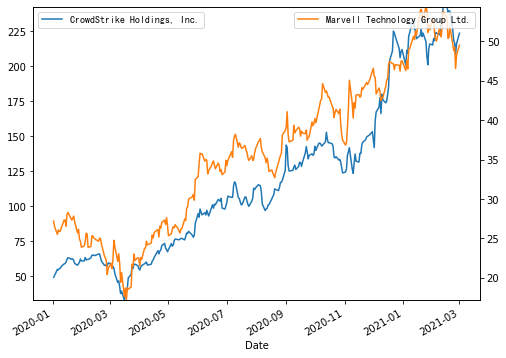


 594 : Host Hotels & Resorts, Inc. vs Wynn Resorts, Limited ( 0.9615 )


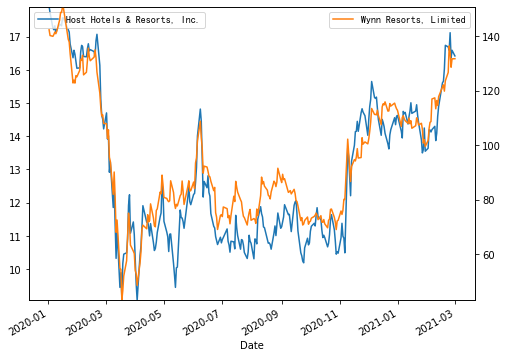


 35 : Analog Devices, Inc. vs Maxim Integrated Products, Inc. ( 0.9615 )


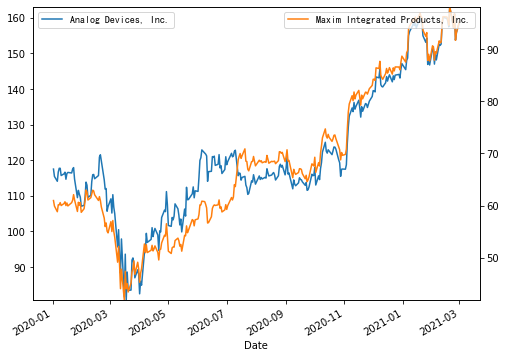


 803 : Match Group, Inc. vs Nuance Communications, Inc. ( 0.9615 )


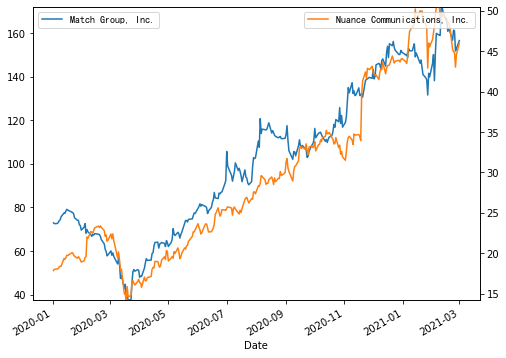


 844 : Nano Dimension Ltd. vs SunPower Corporation ( 0.9615 )


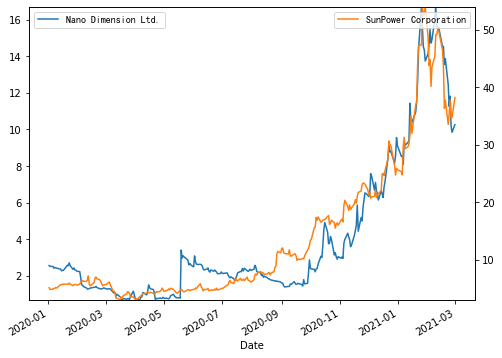


 195 : BridgeBio Pharma, Inc. vs Fate Therapeutics, Inc. ( 0.9614 )


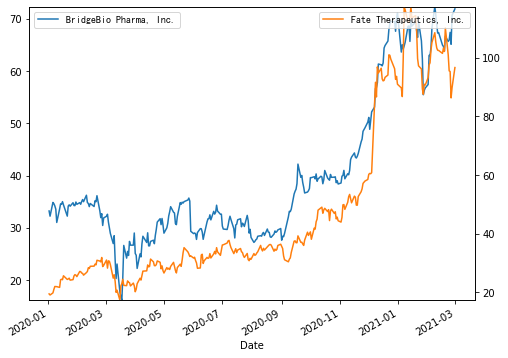


 270 : Cree, Inc. vs CrowdStrike Holdings, Inc. ( 0.9613 )


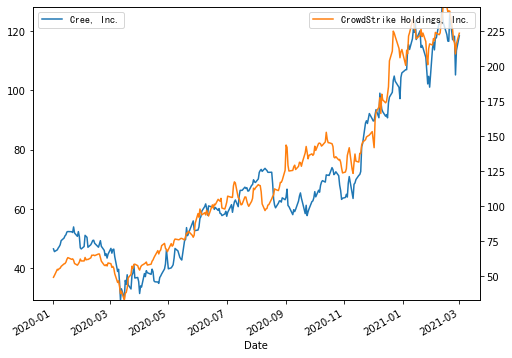


 950 : QUALCOMM Incorporated vs Xilinx, Inc. ( 0.9613 )


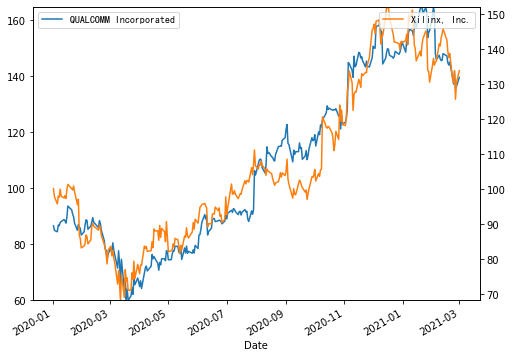


 354 : Discovery, Inc. - Series A vs IAC/InterActiveCorp ( 0.9613 )


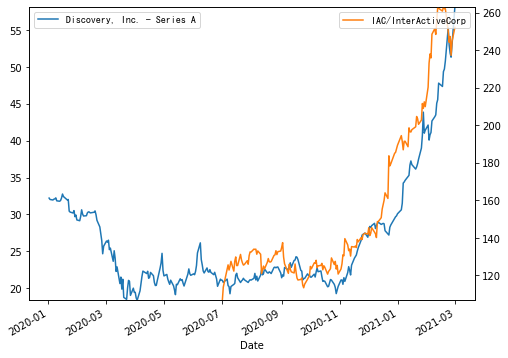


 89 : ANSYS, Inc. vs Cadence Design Systems, Inc. ( 0.9612 )


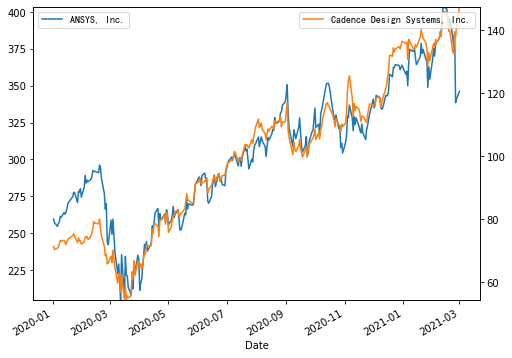


 951 : Qorvo, Inc. vs StoneCo Ltd. ( 0.9612 )


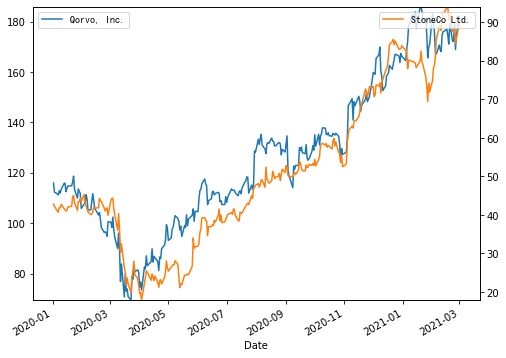


 161 : Activision Blizzard, Inc vs Okta, Inc. ( 0.9612 )


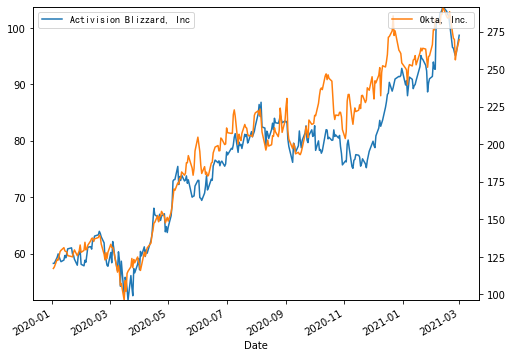


 126 : ASML Holding N.V. - New York Re vs Broadcom Inc. ( 0.9611 )


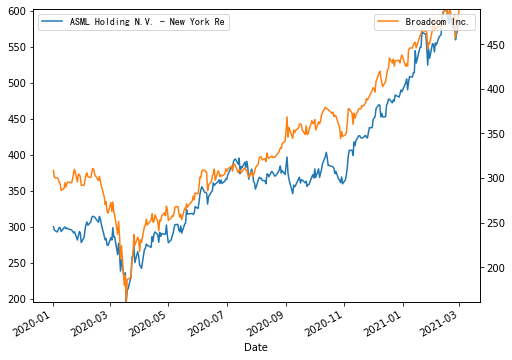


 790 : Marvell Technology Group Ltd. vs Okta, Inc. ( 0.9611 )


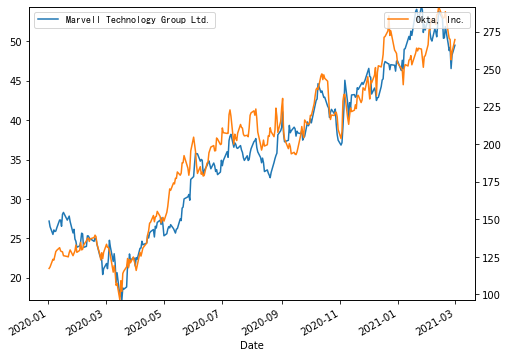


 156 : ASML Holding N.V. - New York Re vs Zebra Technologies Corporation ( 0.9611 )


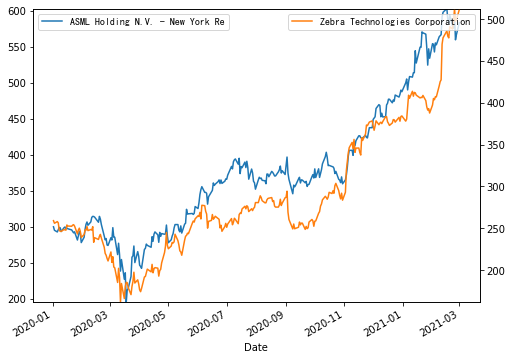


 887 : Nuance Communications, Inc. vs Zscaler, Inc. ( 0.9608 )


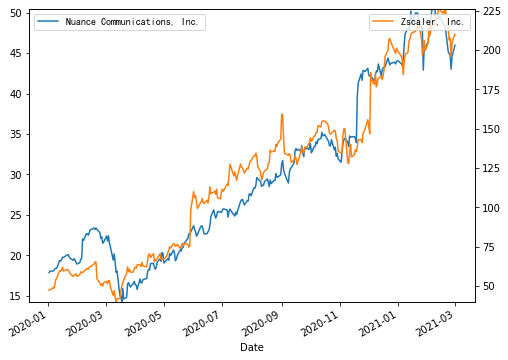


 158 : Activision Blizzard, Inc vs Cadence Design Systems, Inc. ( 0.9607 )


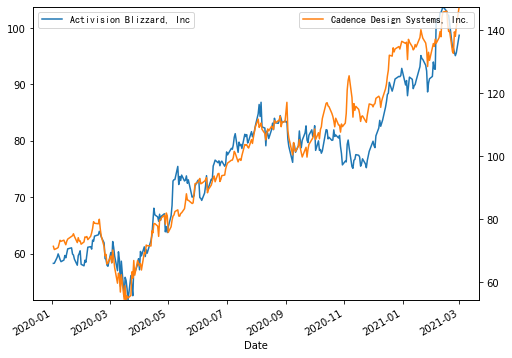


 542 : GDS Holdings Limited vs Monolithic Power Systems, Inc. ( 0.9606 )


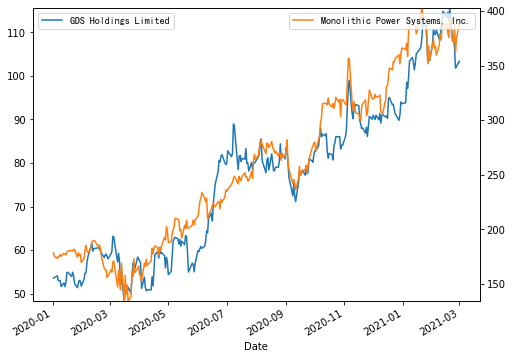


 459 : Fate Therapeutics, Inc. vs Twist Bioscience Corporation ( 0.9606 )


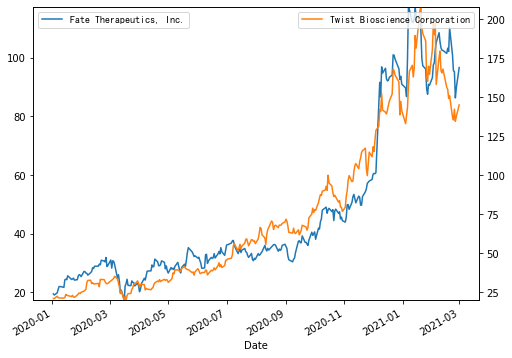


 529 : First Solar, Inc. vs NICE Ltd ( 0.9605 )


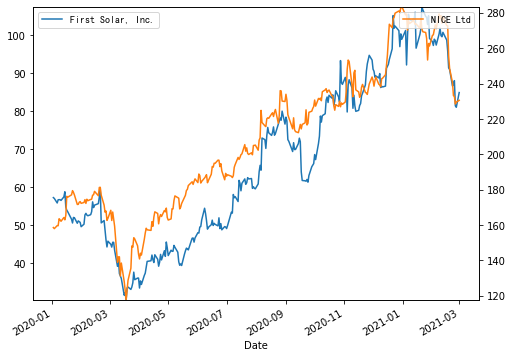


 256 : Charter Communications, Inc. vs Liberty Broadband Corporation ( 0.9604 )


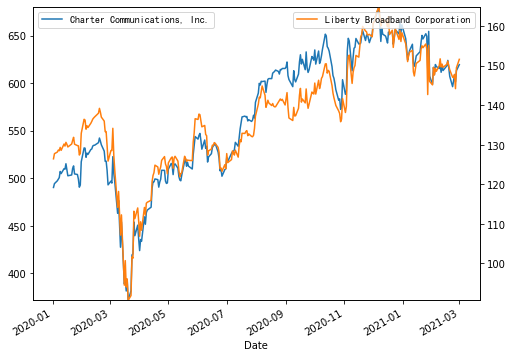


 811 : Match Group, Inc. vs Take-Two Interactive Software,  ( 0.9604 )


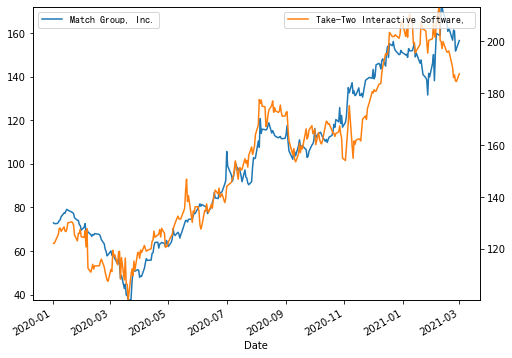


 615 : IDEXX Laboratories, Inc. vs Natera, Inc. ( 0.9603 )


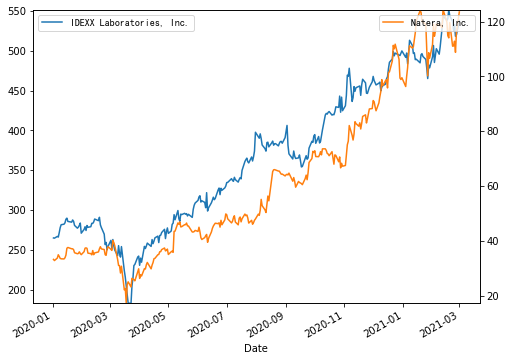


 544 : GDS Holdings Limited vs Synopsys, Inc. ( 0.9602 )


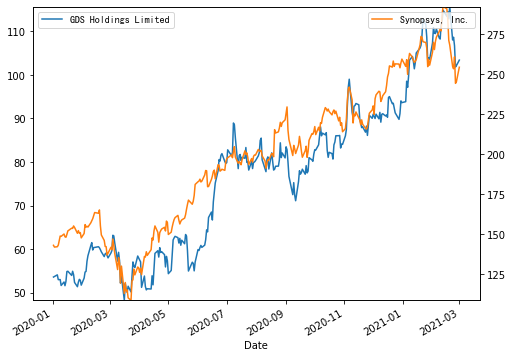


 287 : Cree, Inc. vs Qorvo, Inc. ( 0.9602 )


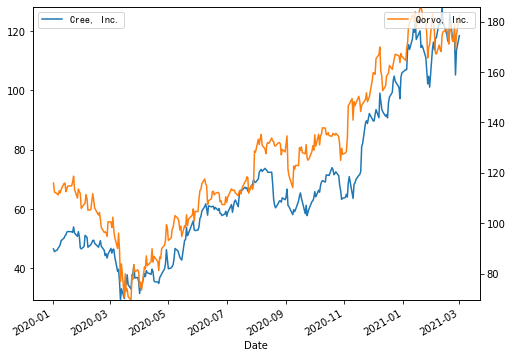


 37 : Analog Devices, Inc. vs ON Semiconductor Corporation ( 0.9602 )


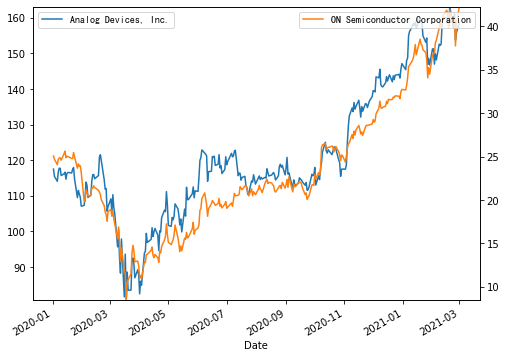


 805 : Match Group, Inc. vs QUALCOMM Incorporated ( 0.9599 )


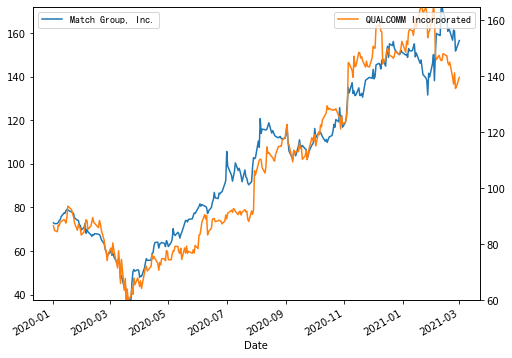


 285 : Cree, Inc. vs Nuance Communications, Inc. ( 0.9599 )


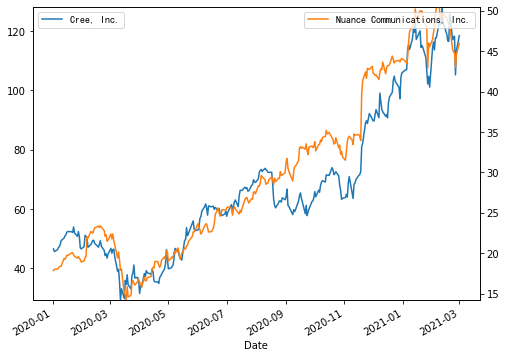


 881 : Nuance Communications, Inc. vs The Trade Desk, Inc. ( 0.9597 )


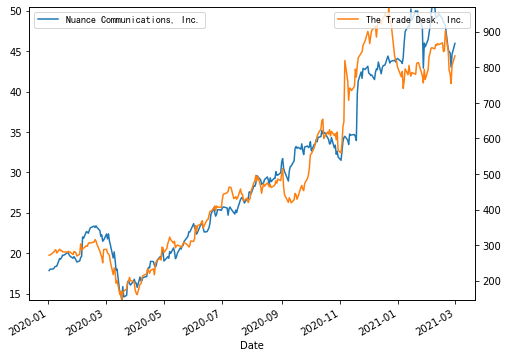


 356 : Discovery, Inc. - Series C vs IAC/InterActiveCorp ( 0.9597 )


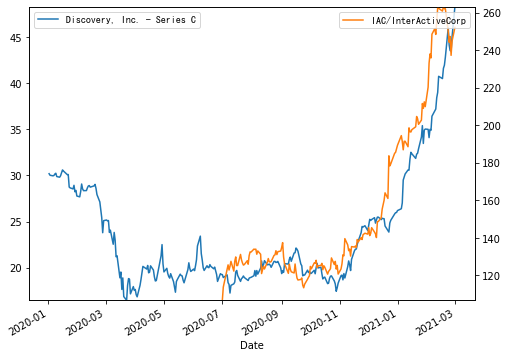


 684 : Logitech International S.A. - R vs Nuance Communications, Inc. ( 0.9597 )


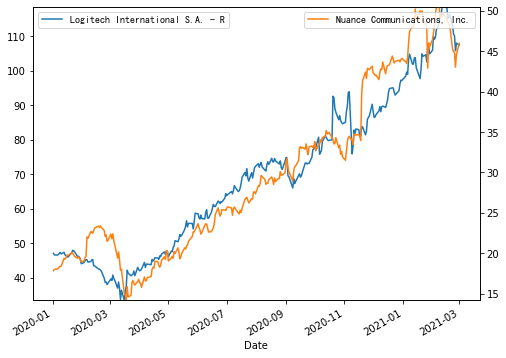


 723 : Microchip Technology Incorporat vs Zebra Technologies Corporation ( 0.9595 )


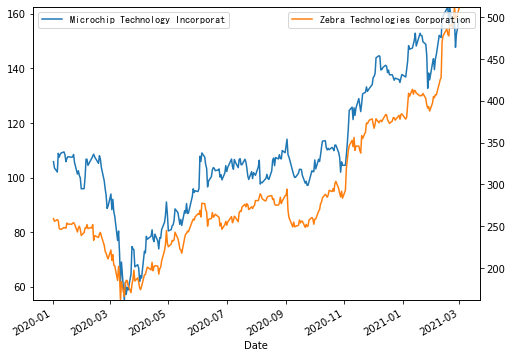


 236 : Cadence Design Systems, Inc. vs CrowdStrike Holdings, Inc. ( 0.9595 )


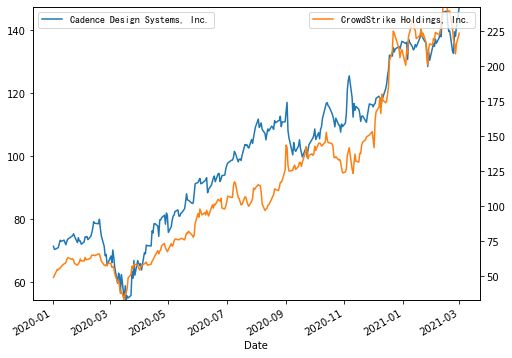


 990 : Teradyne, Inc. vs Trimble Inc. ( 0.9595 )


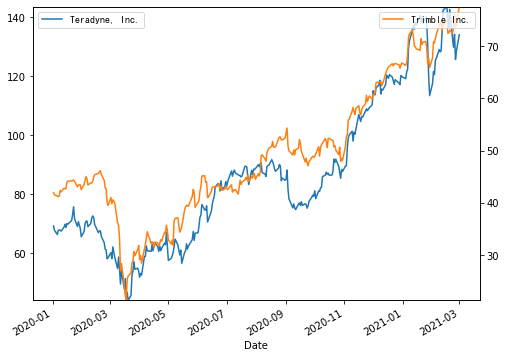


 93 : ANSYS, Inc. vs NICE Ltd ( 0.9595 )


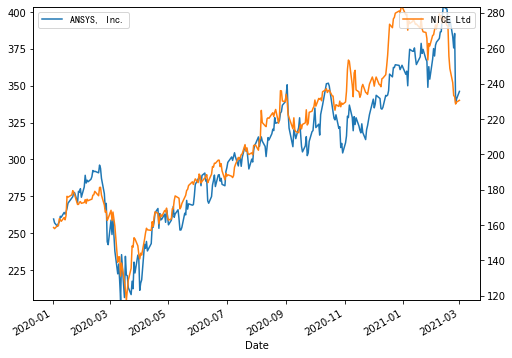


 294 : Cree, Inc. vs Zebra Technologies Corporation ( 0.9594 )


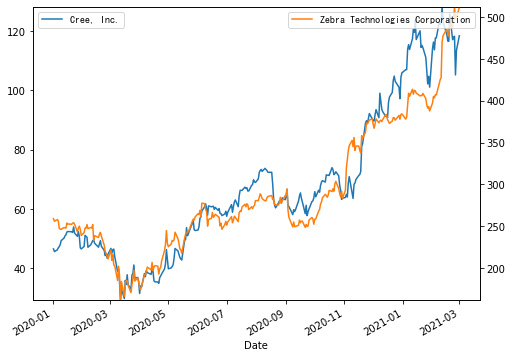


 338 : Canadian Solar Inc. vs Nuance Communications, Inc. ( 0.9594 )


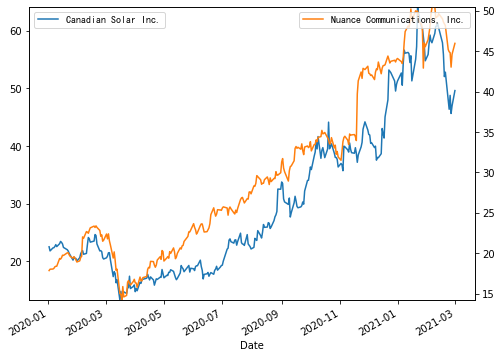


 900 : NXP Semiconductors N.V. vs StoneCo Ltd. ( 0.9592 )


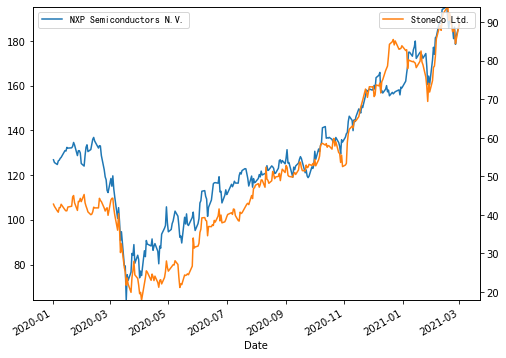


 24 : Adobe Inc. vs NVIDIA Corporation ( 0.9591 )


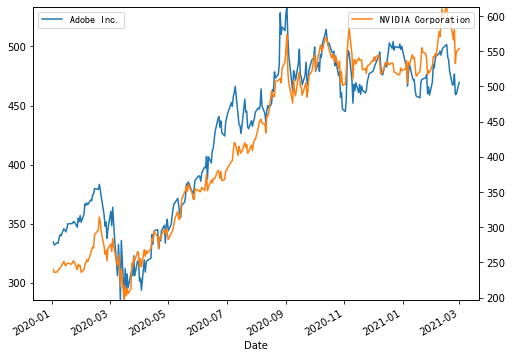


 902 : NXP Semiconductors N.V. vs Texas Instruments Incorporated ( 0.959 )


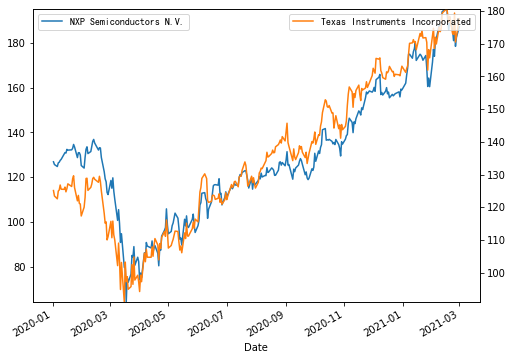


 839 : NICE Ltd vs Take-Two Interactive Software,  ( 0.959 )


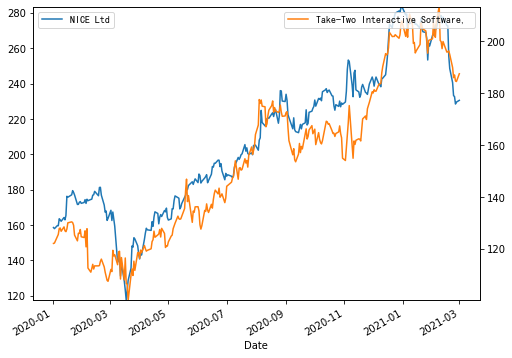


 699 : Lam Research Corporation vs Qorvo, Inc. ( 0.9588 )


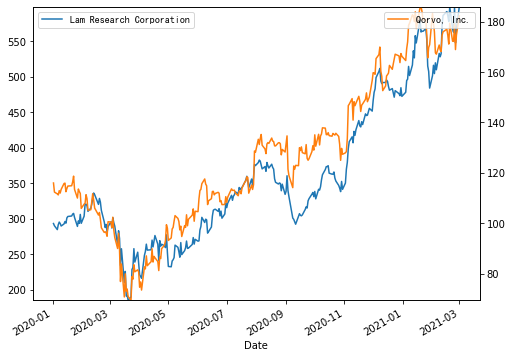


 307 : CrowdStrike Holdings, Inc. vs Enphase Energy, Inc. ( 0.9586 )


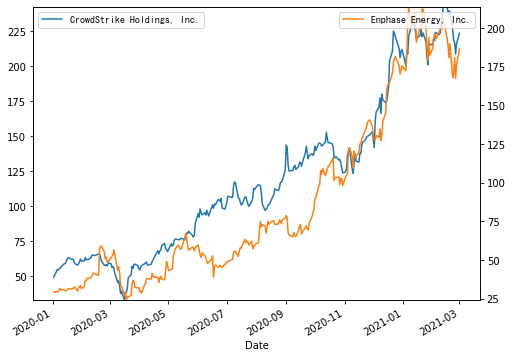


 440 : Etsy, Inc. vs Zillow Group, Inc. ( 0.9586 )


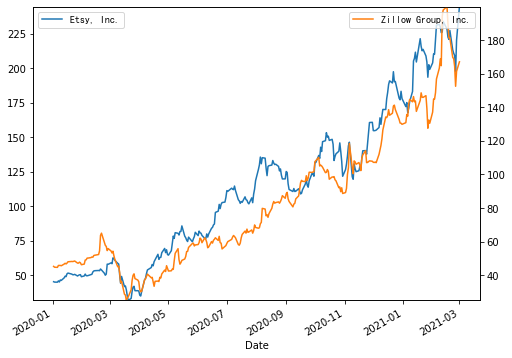


 87 : ANSYS, Inc. vs Autodesk, Inc. ( 0.9584 )


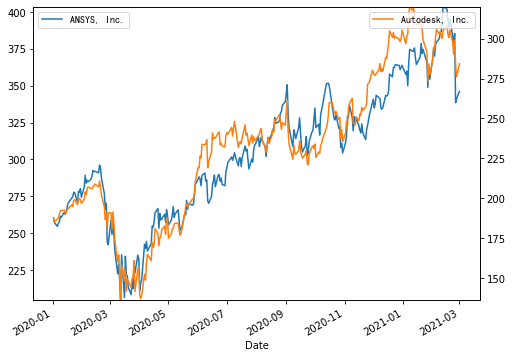


 352 : Datadog, Inc. vs Okta, Inc. ( 0.9583 )


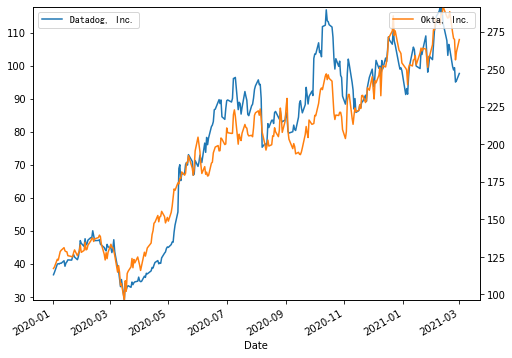


 18 : Apple Inc. vs Take-Two Interactive Software,  ( 0.9582 )


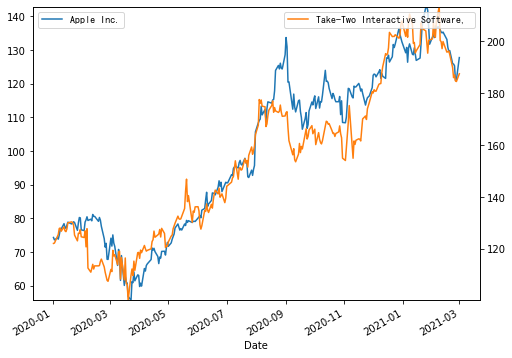


 165 : Broadcom Inc. vs CrowdStrike Holdings, Inc. ( 0.9582 )


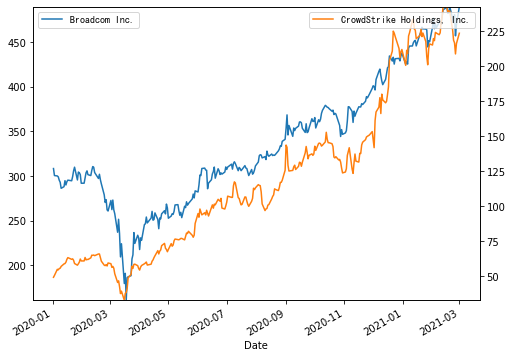


 44 : Autodesk, Inc. vs Cadence Design Systems, Inc. ( 0.9582 )


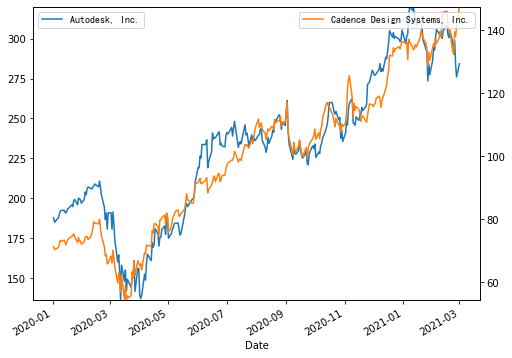


 546 : GDS Holdings Limited vs Zscaler, Inc. ( 0.9581 )


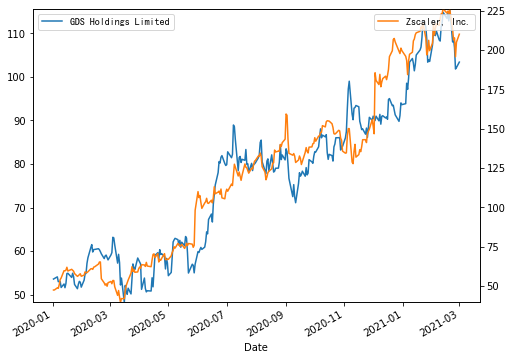


 488 : Five9, Inc. vs Match Group, Inc. ( 0.9579 )


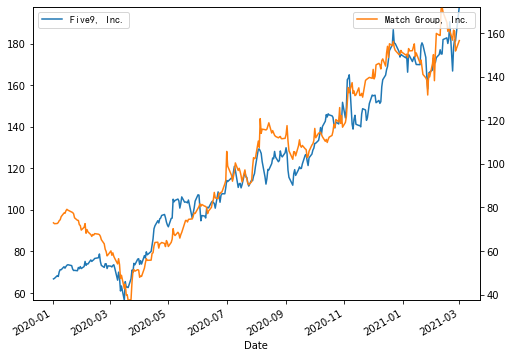


 88 : ANSYS, Inc. vs Broadcom Inc. ( 0.9579 )


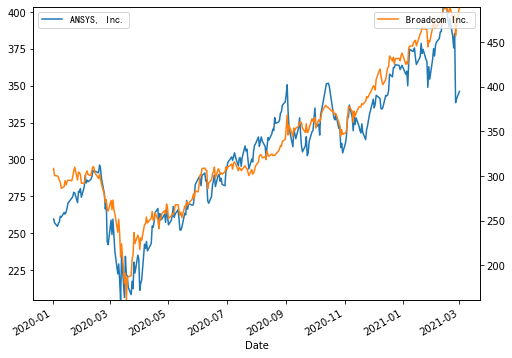


 709 : Marathon Patent Group, Inc. vs Magnite, Inc. ( 0.9579 )


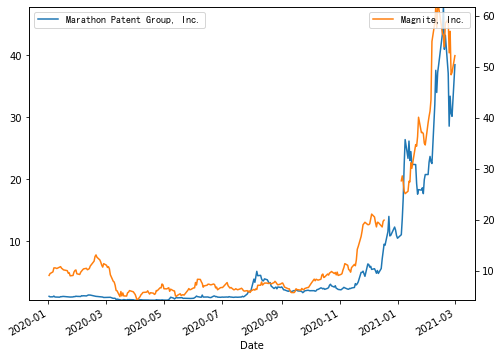


 830 : Maxim Integrated Products, Inc. vs Xilinx, Inc. ( 0.9578 )


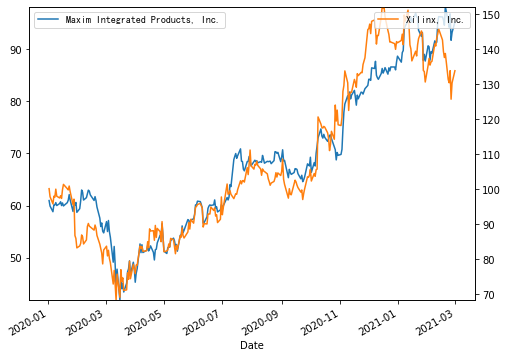


 798 : Microsoft Corporation vs Synopsys, Inc. ( 0.9578 )


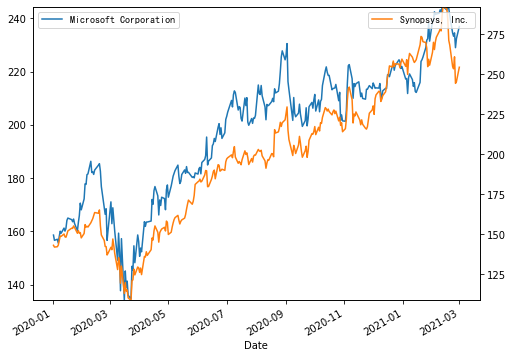


 645 : Intuit Inc. vs Synopsys, Inc. ( 0.9577 )


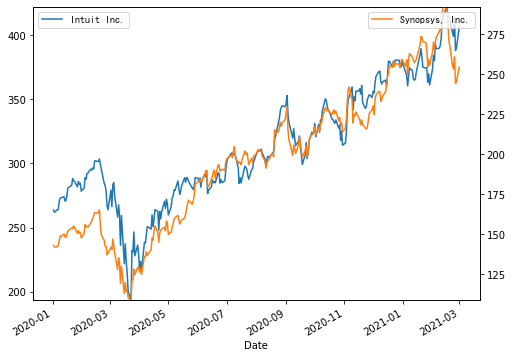


 97 : ANSYS, Inc. vs Texas Instruments Incorporated ( 0.9577 )


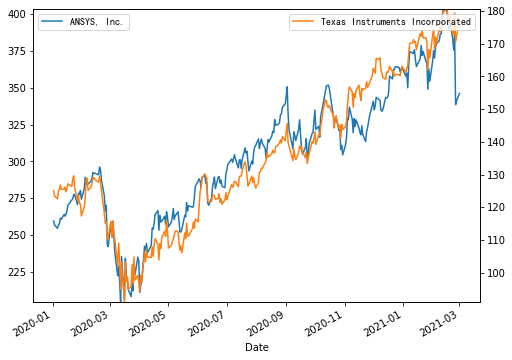


 4 : Apple Inc. vs Cadence Design Systems, Inc. ( 0.9576 )


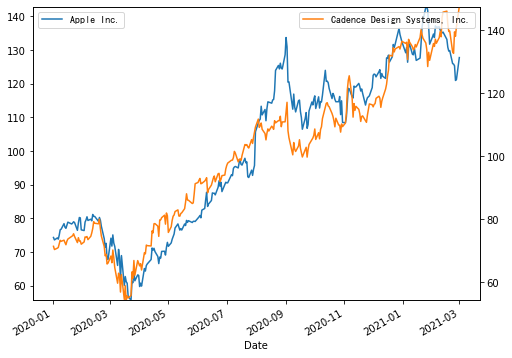


 875 : Nuance Communications, Inc. vs SolarEdge Technologies, Inc. ( 0.9576 )


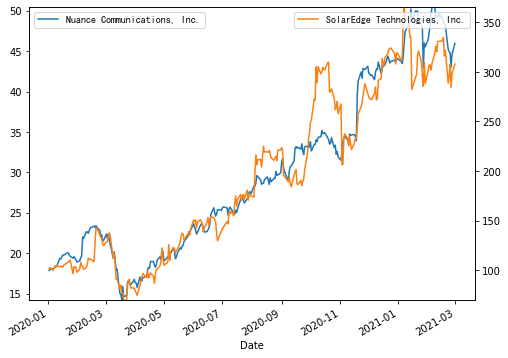


 13 : Apple Inc. vs Match Group, Inc. ( 0.9576 )


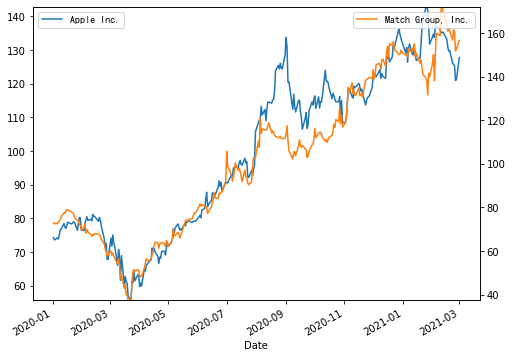


 32 : Analog Devices, Inc. vs Lam Research Corporation ( 0.9576 )


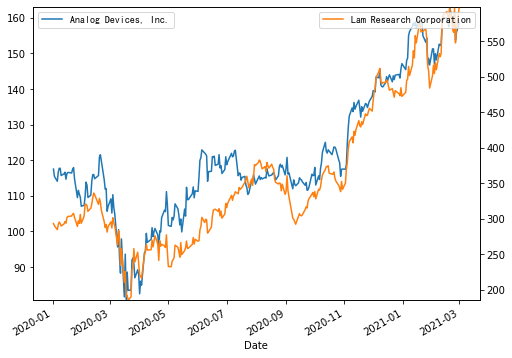


 822 : Maxim Integrated Products, Inc. vs QUALCOMM Incorporated ( 0.9576 )


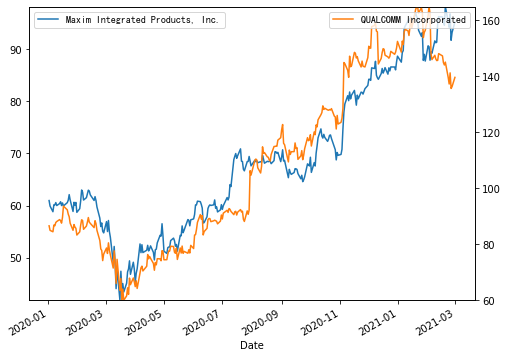


 718 : Microchip Technology Incorporat vs Qorvo, Inc. ( 0.9575 )


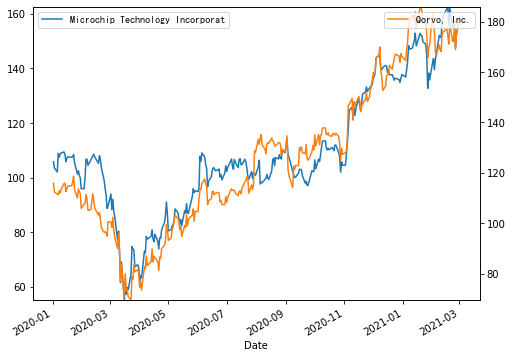


 641 : Intuit Inc. vs Maxim Integrated Products, Inc. ( 0.9575 )


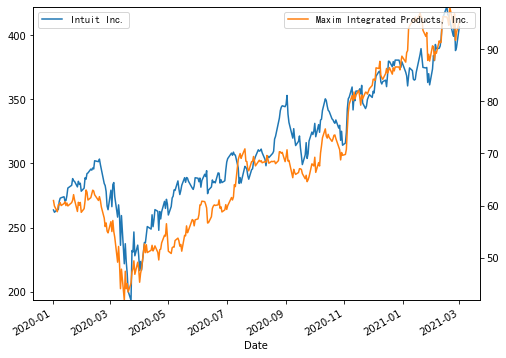


 240 : Cadence Design Systems, Inc. vs GDS Holdings Limited ( 0.9575 )


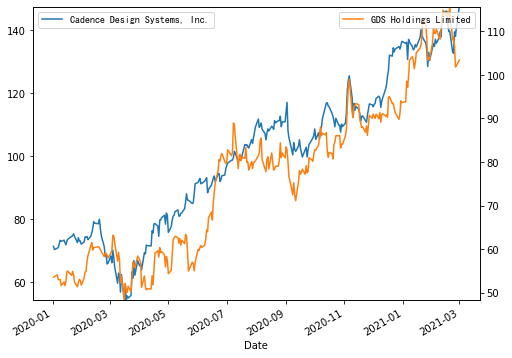


 675 : KLA Corporation vs Trimble Inc. ( 0.9574 )


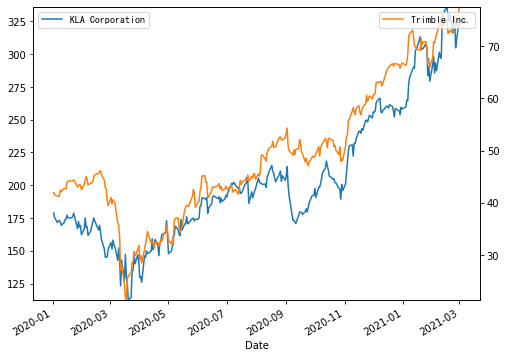


 181 : Broadcom Inc. vs ON Semiconductor Corporation ( 0.9573 )


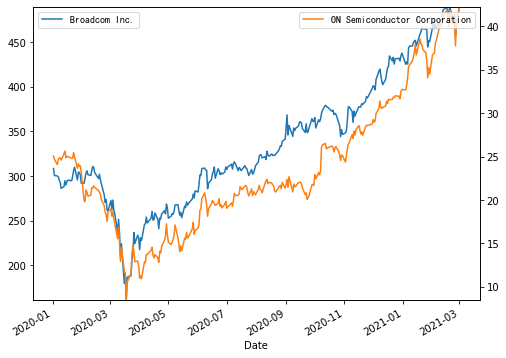


 58 : Align Technology, Inc. vs Natera, Inc. ( 0.9573 )


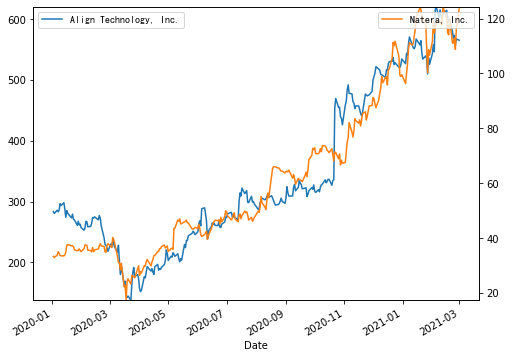


 983 : Synopsys, Inc. vs Take-Two Interactive Software,  ( 0.9573 )


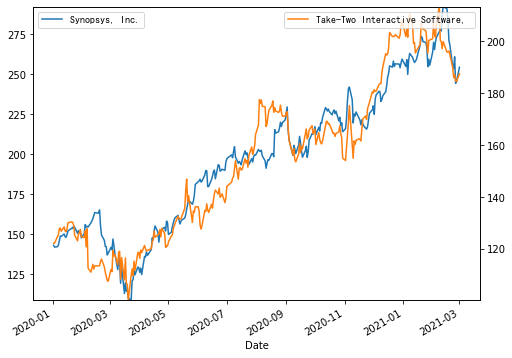


 877 : Nuance Communications, Inc. vs StoneCo Ltd. ( 0.9573 )


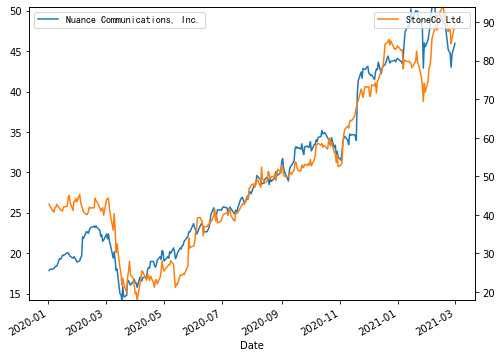


 821 : Maxim Integrated Products, Inc. vs ON Semiconductor Corporation ( 0.9573 )


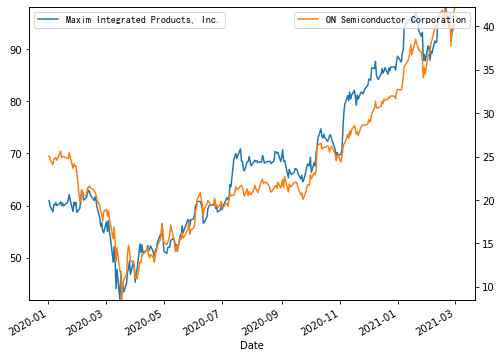


 224 : Booking Holdings Inc. Common St vs Expedia Group, Inc. ( 0.9572 )


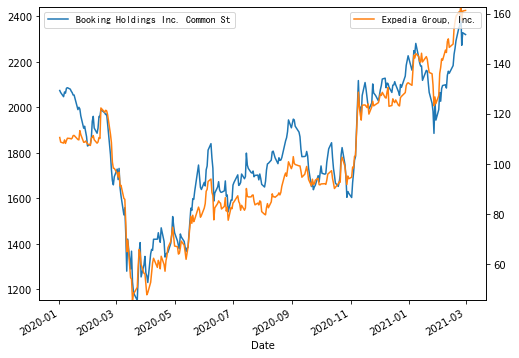


 487 : Five9, Inc. vs Marvell Technology Group Ltd. ( 0.9571 )


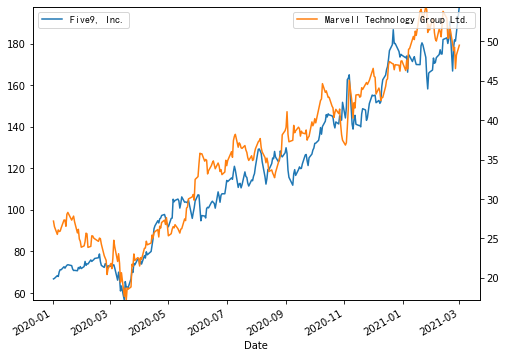


 640 : Intuit Inc. vs Match Group, Inc. ( 0.9571 )


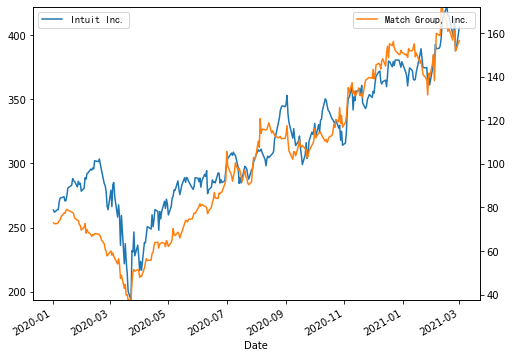


 695 : Lam Research Corporation vs Microchip Technology Incorporat ( 0.9569 )


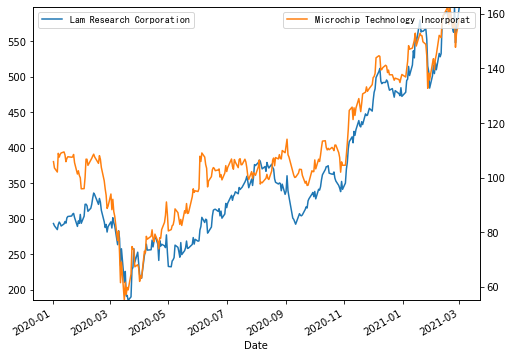


 194 : BridgeBio Pharma, Inc. vs Beam Therapeutics Inc. ( 0.9568 )


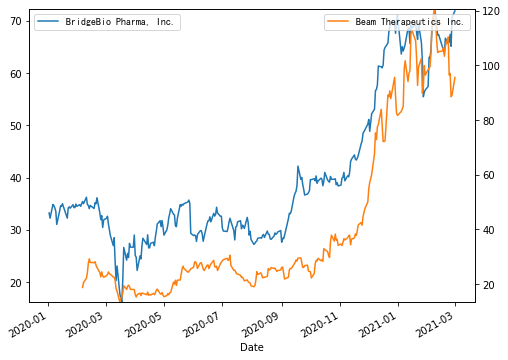


 784 : Monolithic Power Systems, Inc. vs Take-Two Interactive Software,  ( 0.9568 )


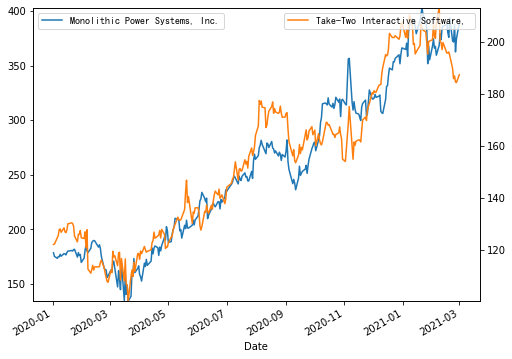


 173 : Broadcom Inc. vs Microchip Technology Incorporat ( 0.9568 )


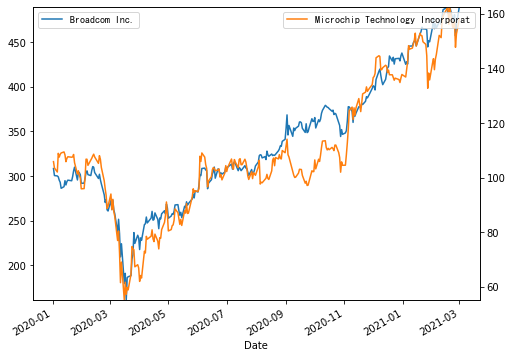


 732 : MongoDB, Inc. vs Varonis Systems, Inc. ( 0.9567 )


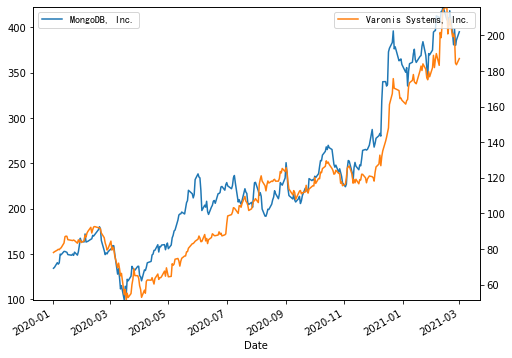


 814 : Match Group, Inc. vs Zscaler, Inc. ( 0.9566 )


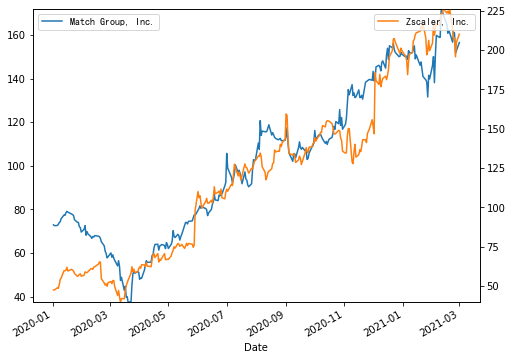


 691 : Logitech International S.A. - R vs Take-Two Interactive Software,  ( 0.9566 )


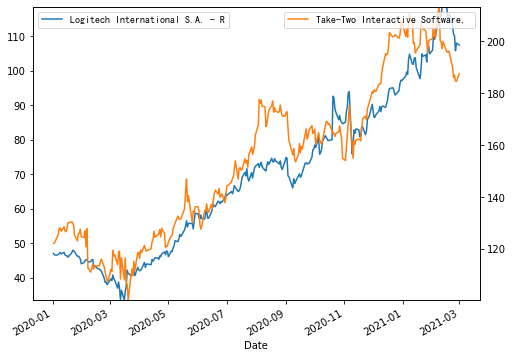


 152 : ASML Holding N.V. - New York Re vs Upwork Inc. ( 0.9566 )


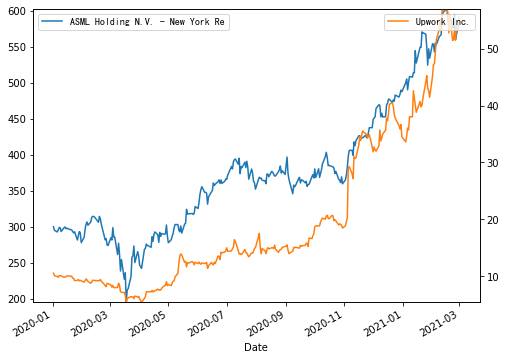


 302 : CRISPR Therapeutics AG vs Natera, Inc. ( 0.9565 )


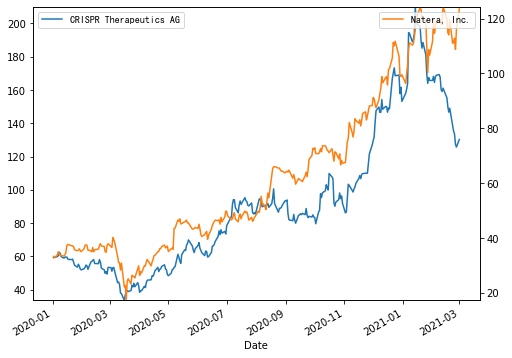


 648 : Intuit Inc. vs Workday, Inc. ( 0.9565 )


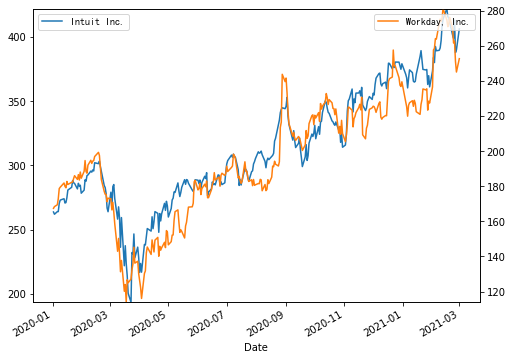


 787 : Marvell Technology Group Ltd. vs Match Group, Inc. ( 0.9564 )


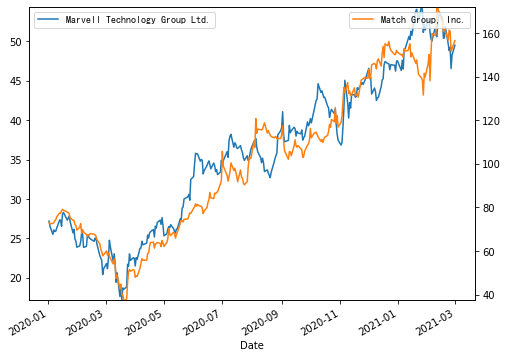


 248 : Cadence Design Systems, Inc. vs Microsoft Corporation ( 0.9563 )


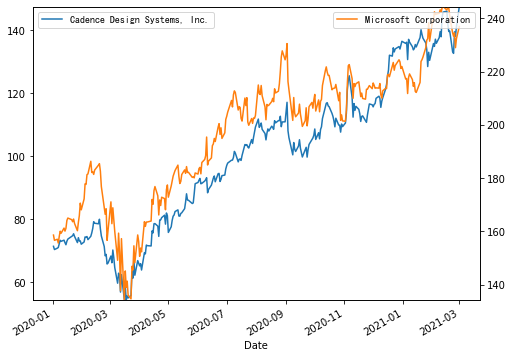


 15 : Apple Inc. vs NVIDIA Corporation ( 0.9562 )


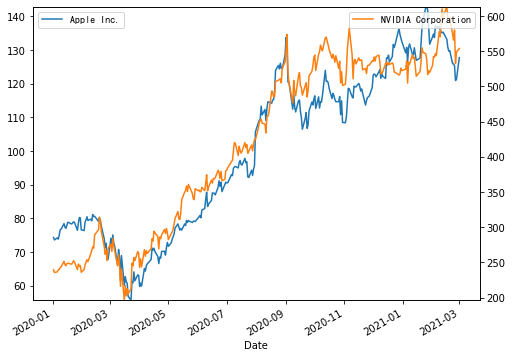


 38 : Analog Devices, Inc. vs Qorvo, Inc. ( 0.9562 )


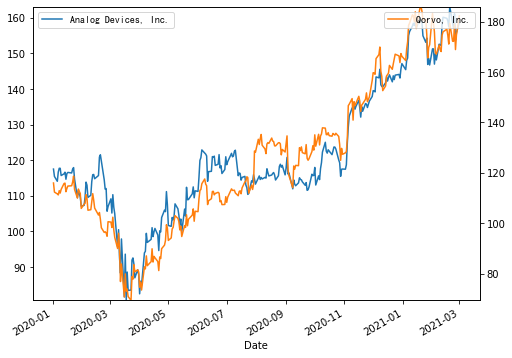


 137 : ASML Holding N.V. - New York Re vs Logitech International S.A. - R ( 0.9562 )


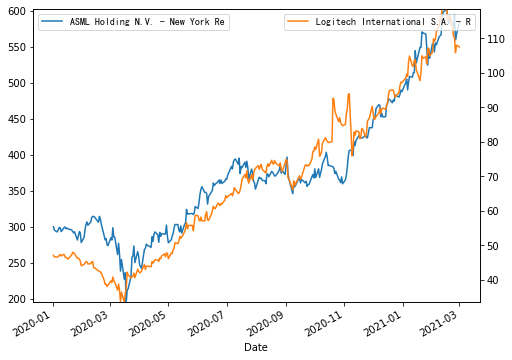


 219 : Bilibili Inc. vs Nano Dimension Ltd. ( 0.9562 )


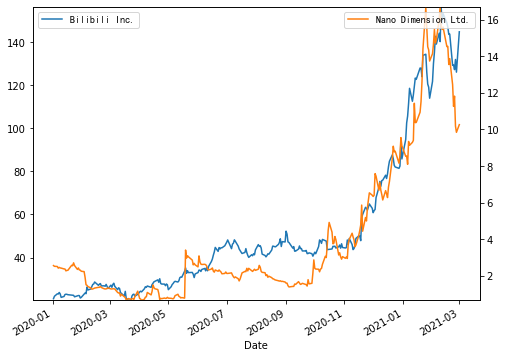


 758 : MercadoLibre, Inc. vs Zillow Group, Inc. ( 0.9562 )


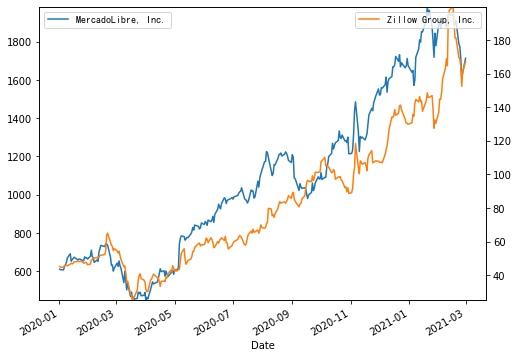


 210 : Baidu, Inc. vs Marathon Patent Group, Inc. ( 0.9561 )


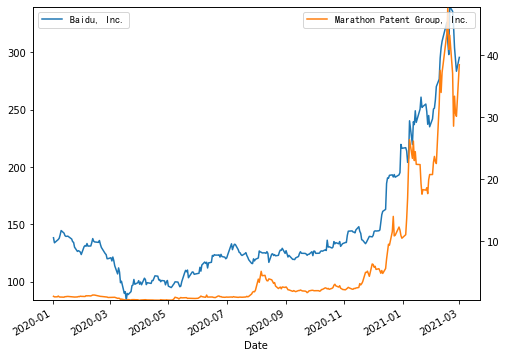


 644 : Intuit Inc. vs Qorvo, Inc. ( 0.9561 )


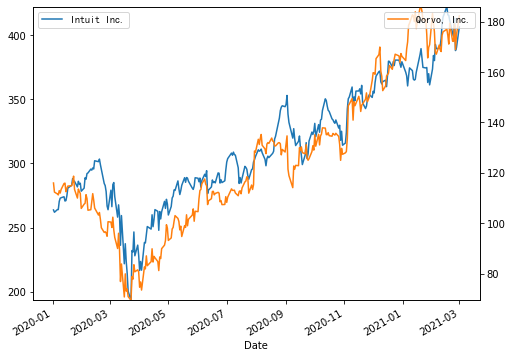


 829 : Maxim Integrated Products, Inc. vs Varonis Systems, Inc. ( 0.956 )


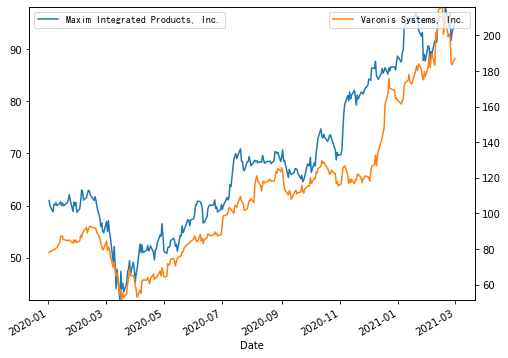


 734 : MongoDB, Inc. vs Zscaler, Inc. ( 0.956 )


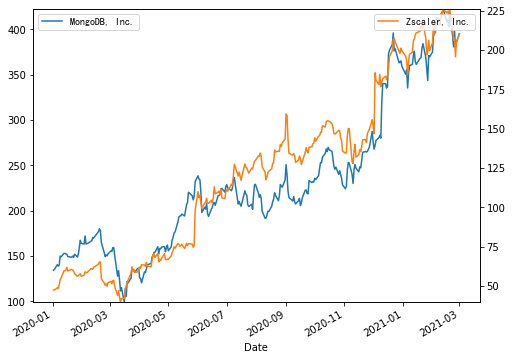


 3 : Apple Inc. vs ANSYS, Inc. ( 0.9559 )


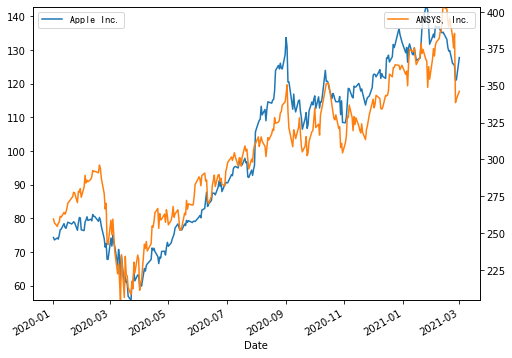


 876 : Nuance Communications, Inc. vs Synopsys, Inc. ( 0.9559 )


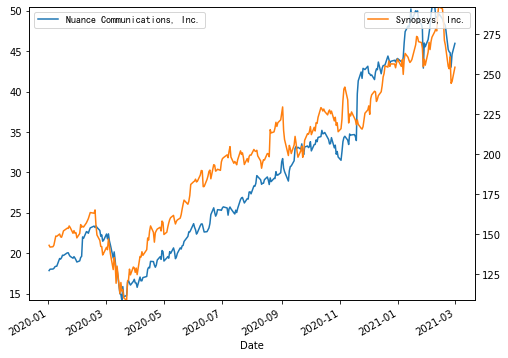


 176 : Broadcom Inc. vs Match Group, Inc. ( 0.9559 )


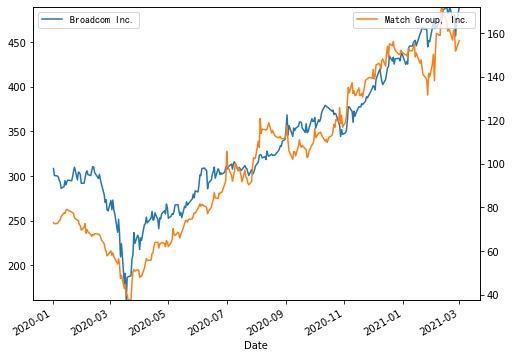


 849 : Intellia Therapeutics, Inc. vs Twist Bioscience Corporation ( 0.9558 )


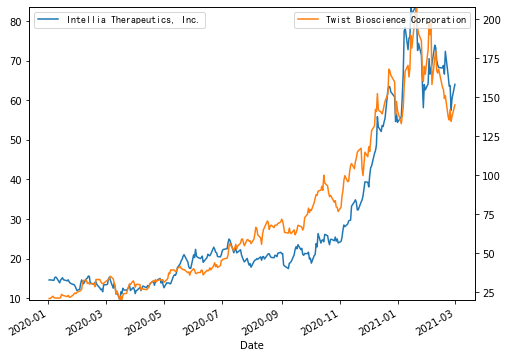


 685 : Logitech International S.A. - R vs Okta, Inc. ( 0.9557 )


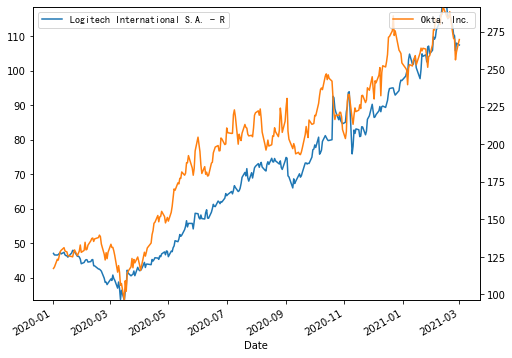


 389 : Enphase Energy, Inc. vs Upwork Inc. ( 0.9556 )


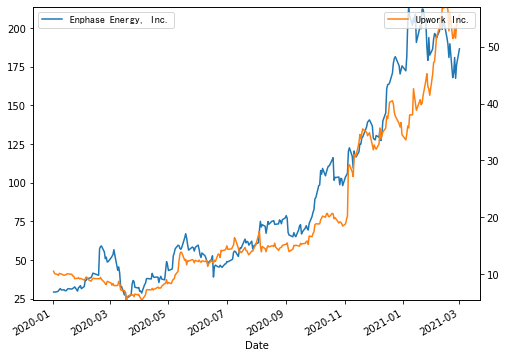


 86 : Amazon.com, Inc. vs Tractor Supply Company ( 0.9553 )


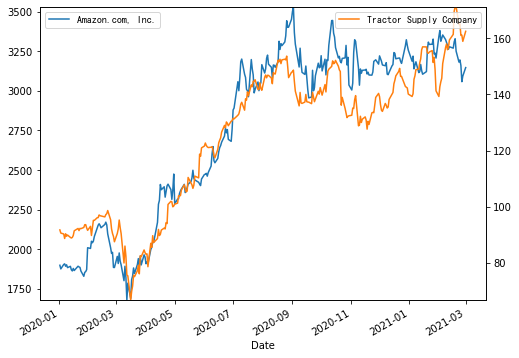


 496 : Five9, Inc. vs Atlassian Corporation Plc ( 0.9552 )


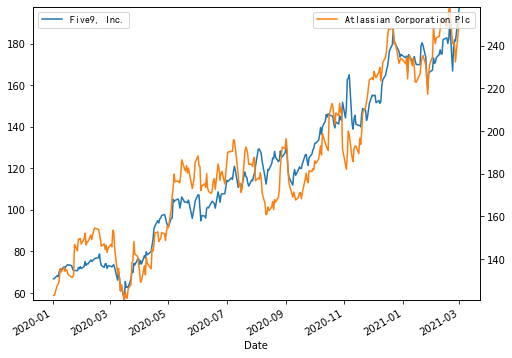


 301 : CRISPR Therapeutics AG vs Intellia Therapeutics, Inc. ( 0.9551 )


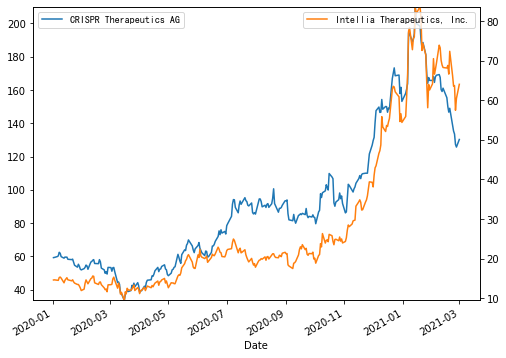


 837 : NICE Ltd vs SolarEdge Technologies, Inc. ( 0.955 )


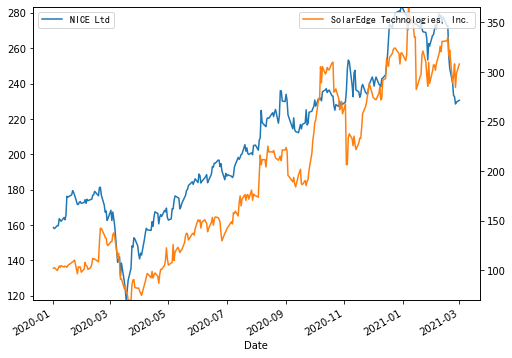


 531 : First Solar, Inc. vs Qorvo, Inc. ( 0.955 )


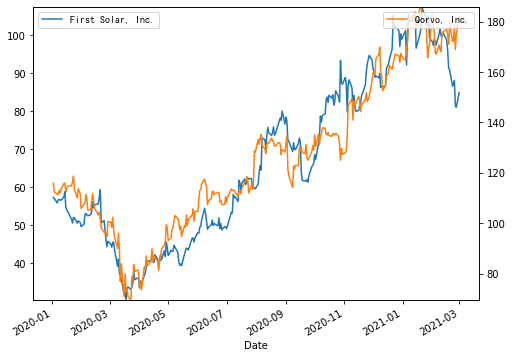


 379 : Enphase Energy, Inc. vs MongoDB, Inc. ( 0.9549 )


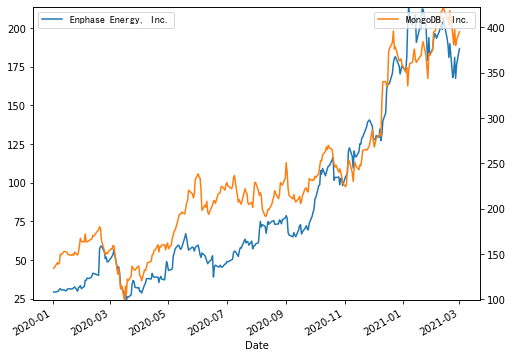


 789 : Marvell Technology Group Ltd. vs Nuance Communications, Inc. ( 0.9548 )


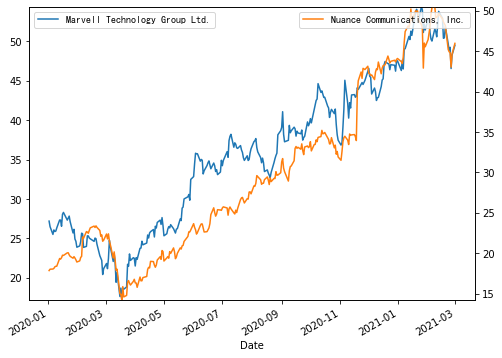


 967 : Roku, Inc. vs Stitch Fix, Inc. ( 0.9548 )


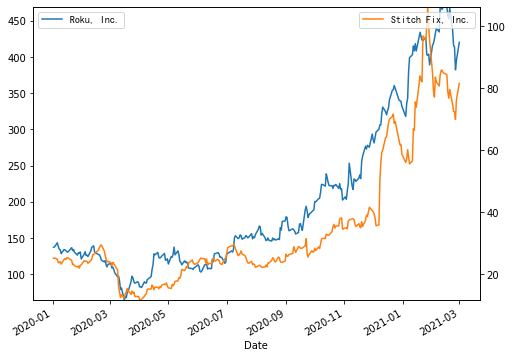


 528 : First Solar, Inc. vs Maxim Integrated Products, Inc. ( 0.9546 )


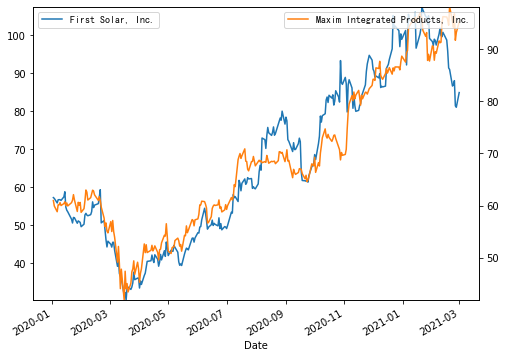


 913 : ON Semiconductor Corporation vs StoneCo Ltd. ( 0.9546 )


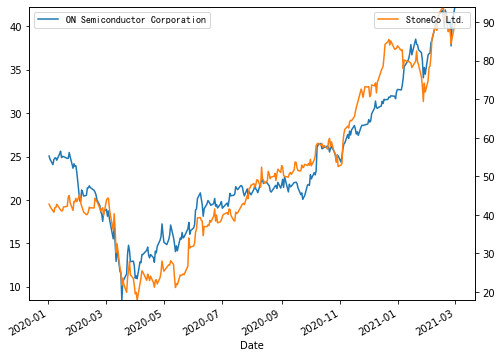


 53 : Align Technology, Inc. vs Halozyme Therapeutics, Inc. ( 0.9546 )


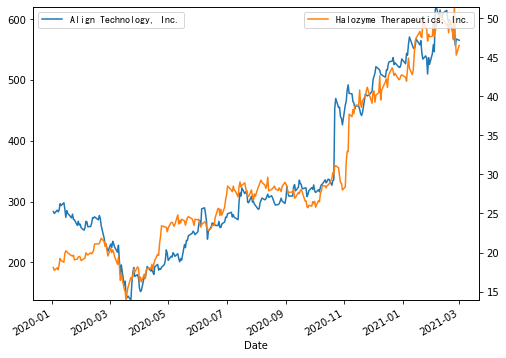


 212 : Baidu, Inc. vs MicroStrategy Incorporated ( 0.9545 )


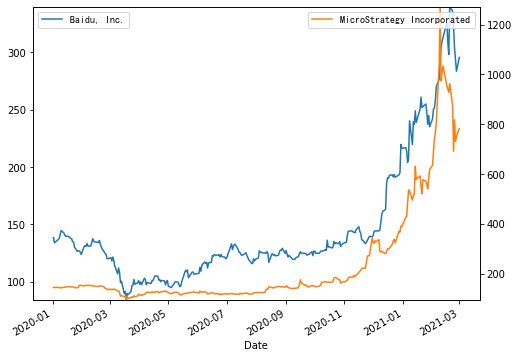


 908 : Okta, Inc. vs Atlassian Corporation Plc ( 0.9543 )


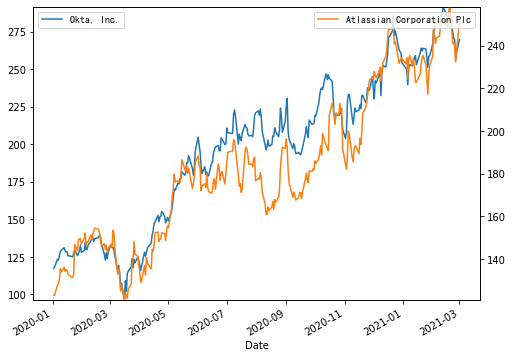


 235 : Cadence Design Systems, Inc. vs Coupa Software Incorporated ( 0.9543 )


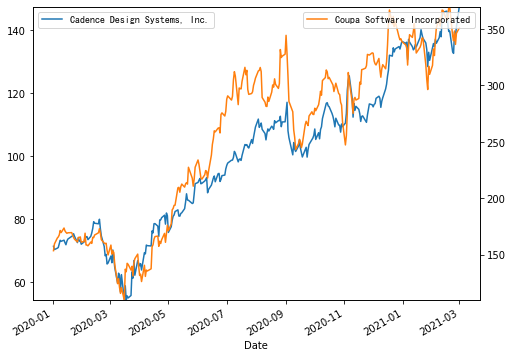


 46 : Autodesk, Inc. vs Match Group, Inc. ( 0.9543 )


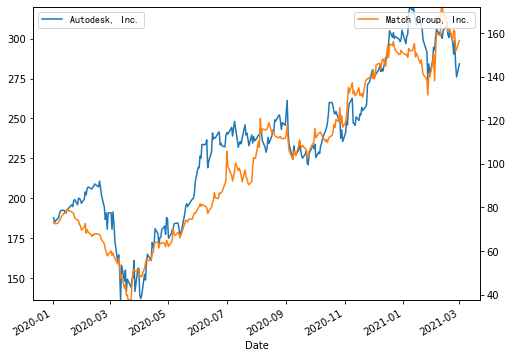


 75 : Applied Materials, Inc. vs ON Semiconductor Corporation ( 0.9542 )


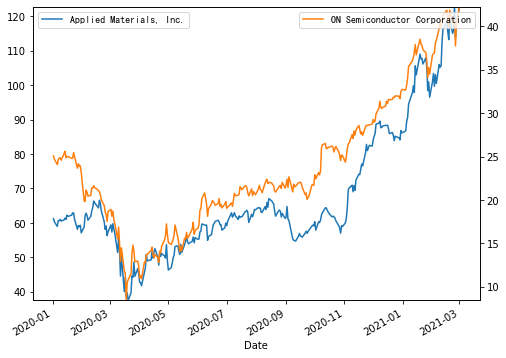


 23 : Adobe Inc. vs DocuSign, Inc. ( 0.9541 )


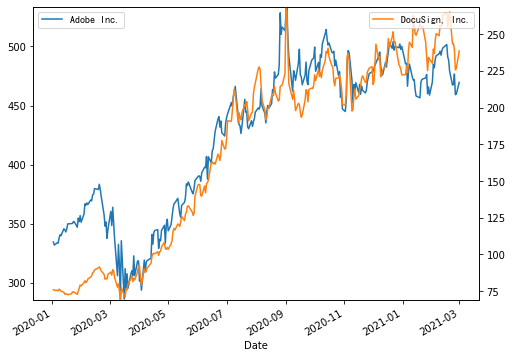


 157 : ASML Holding N.V. - New York Re vs Zscaler, Inc. ( 0.9541 )


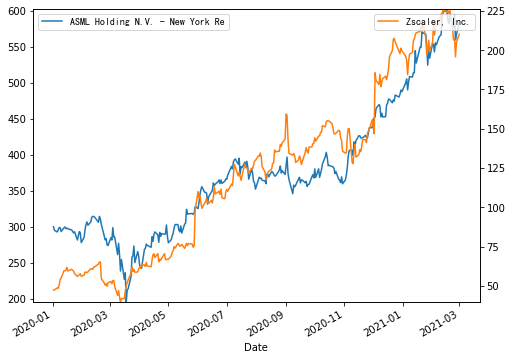


 143 : ASML Holding N.V. - New York Re vs Nuance Communications, Inc. ( 0.9541 )


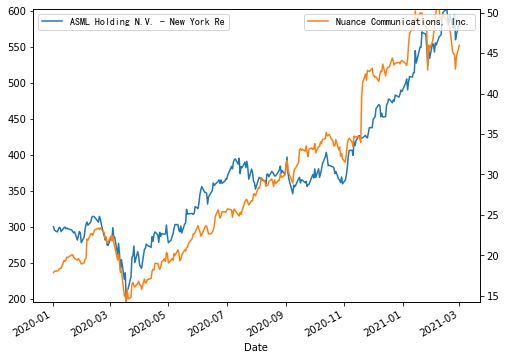


 185 : Broadcom Inc. vs Synopsys, Inc. ( 0.9541 )


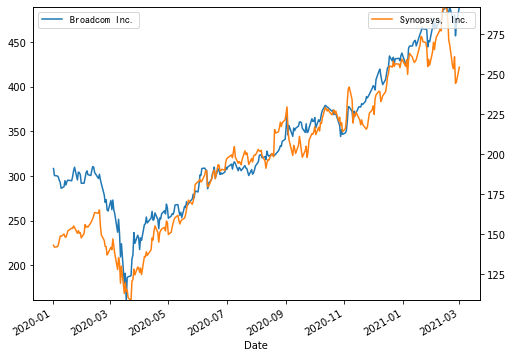


 527 : First Solar, Inc. vs Match Group, Inc. ( 0.9541 )


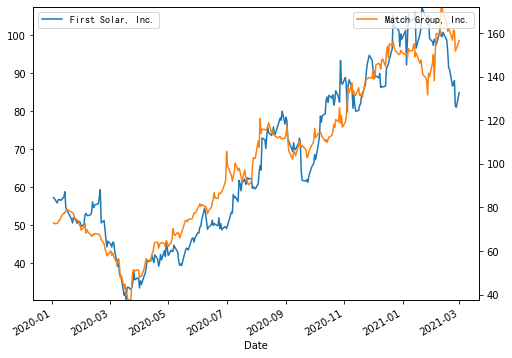


 915 : ON Semiconductor Corporation vs Texas Instruments Incorporated ( 0.954 )


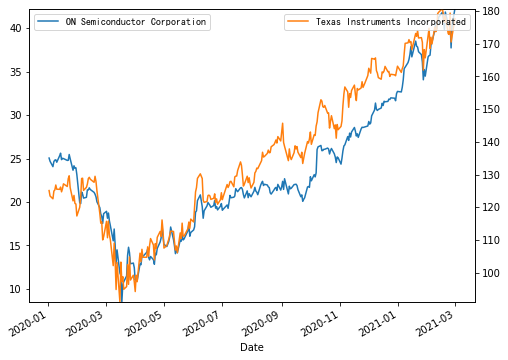


 96 : ANSYS, Inc. vs Skyworks Solutions, Inc. ( 0.9538 )


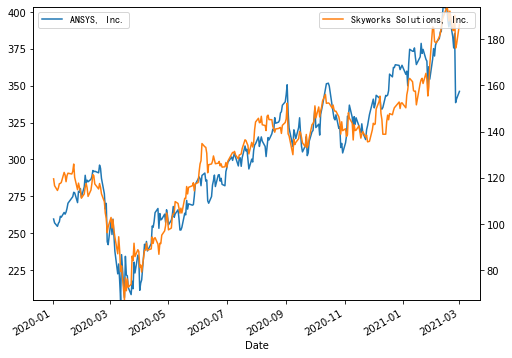


 532 : First Solar, Inc. vs SolarEdge Technologies, Inc. ( 0.9537 )


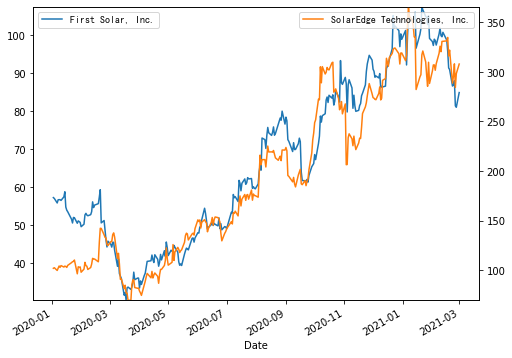


 474 : Five Below, Inc. vs Starbucks Corporation ( 0.9537 )


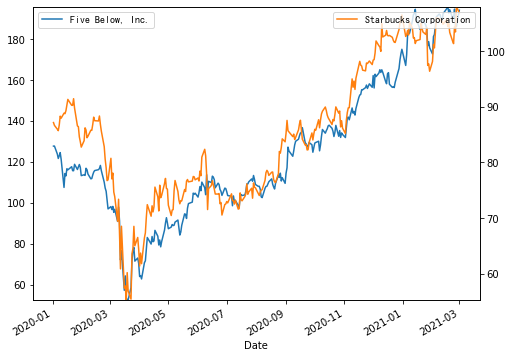


 482 : Five9, Inc. vs Inphi Corporation ( 0.9536 )


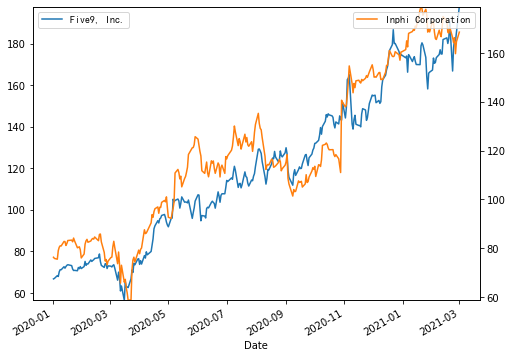


 813 : Match Group, Inc. vs Xilinx, Inc. ( 0.9535 )


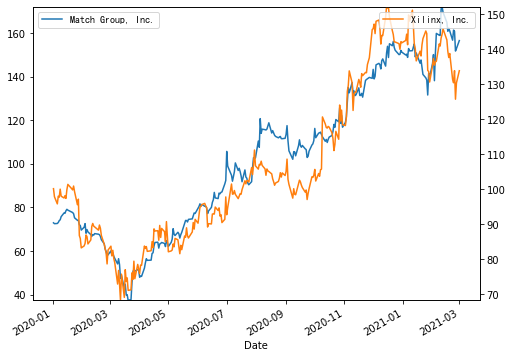


 820 : Maxim Integrated Products, Inc. vs NXP Semiconductors N.V. ( 0.9535 )


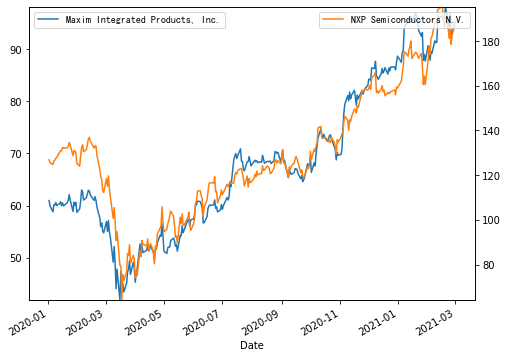


 603 : IAC/InterActiveCorp vs ViacomCBS Inc. ( 0.9534 )


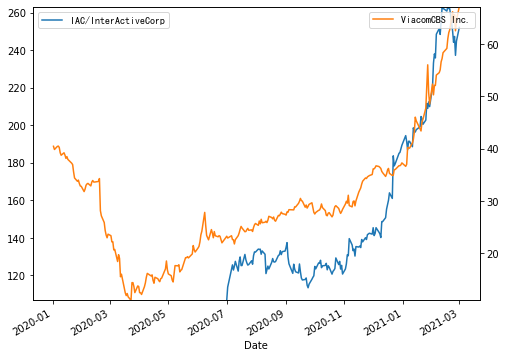


 25 : Analog Devices, Inc. vs Applied Materials, Inc. ( 0.9533 )


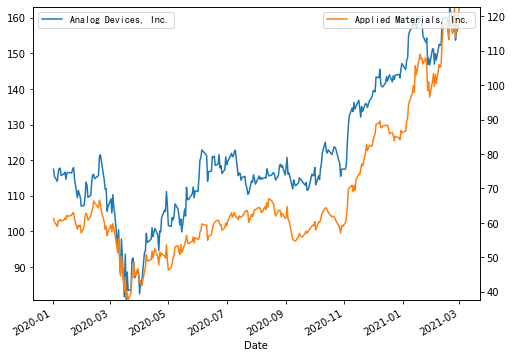


 343 : Canadian Solar Inc. vs SunPower Corporation ( 0.9533 )


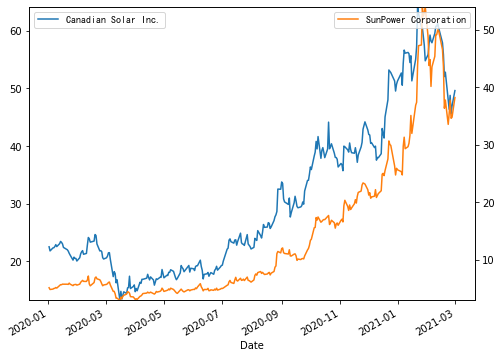


 26 : Analog Devices, Inc. vs ASML Holding N.V. - New York Re ( 0.9532 )


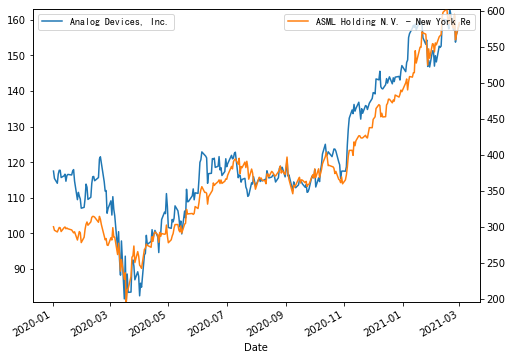


 702 : Lam Research Corporation vs StoneCo Ltd. ( 0.9532 )


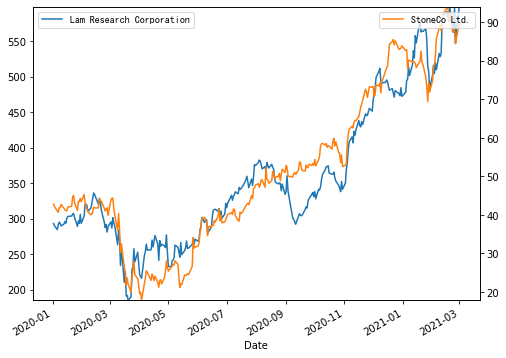


 773 : Monolithic Power Systems, Inc. vs Maxim Integrated Products, Inc. ( 0.9531 )


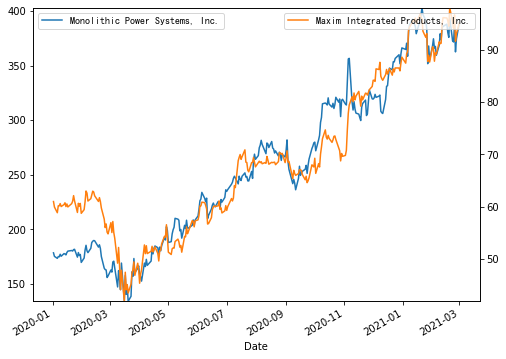


 916 : ON Semiconductor Corporation vs Zebra Technologies Corporation ( 0.9531 )


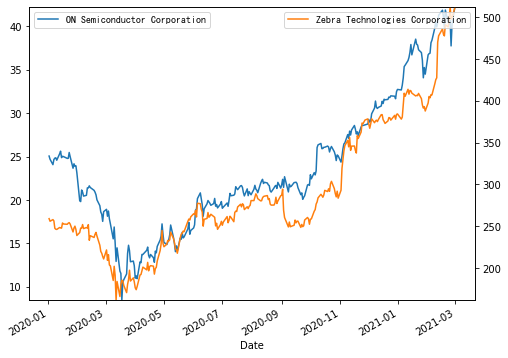


 796 : Microsoft Corporation vs Okta, Inc. ( 0.9531 )


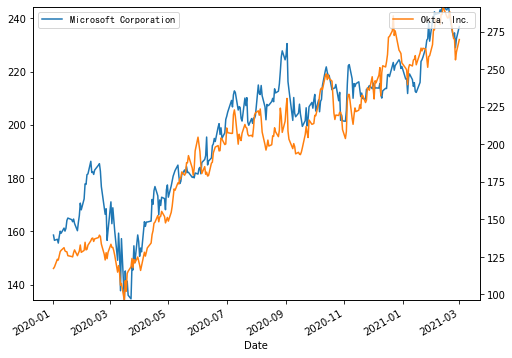


 836 : NICE Ltd vs QUALCOMM Incorporated ( 0.953 )


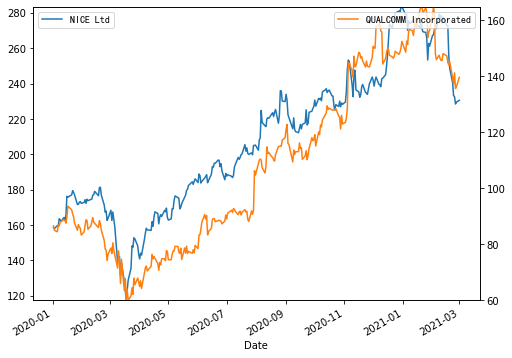


 258 : Comcast Corporation vs News Corporation ( 0.953 )


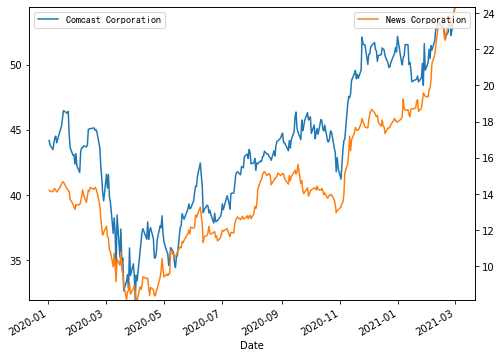


 788 : Marvell Technology Group Ltd. vs NICE Ltd ( 0.9529 )


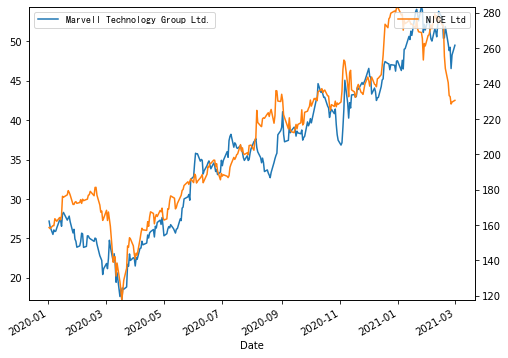


 593 : Host Hotels & Resorts, Inc. vs Marriott International ( 0.9529 )


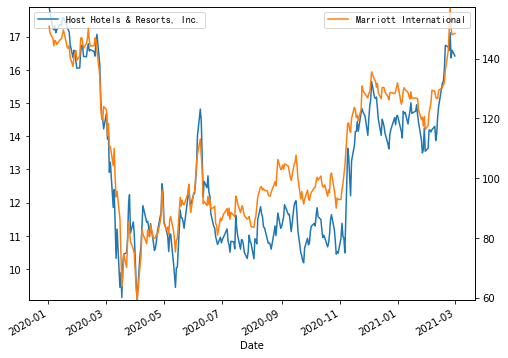


 260 : Coupa Software Incorporated vs Datadog, Inc. ( 0.9527 )


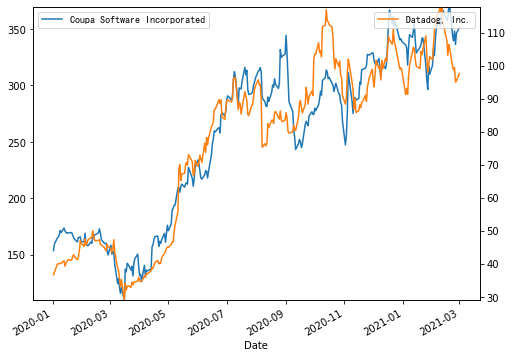


 497 : Five9, Inc. vs Take-Two Interactive Software,  ( 0.9527 )


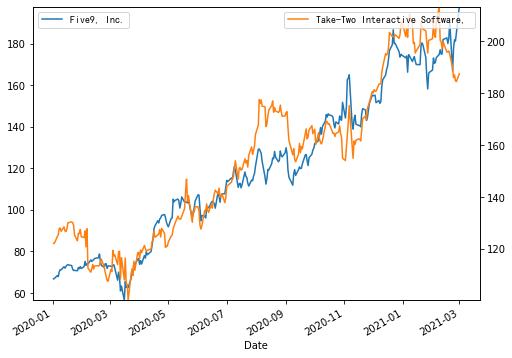


 780 : Monolithic Power Systems, Inc. vs Qorvo, Inc. ( 0.9527 )


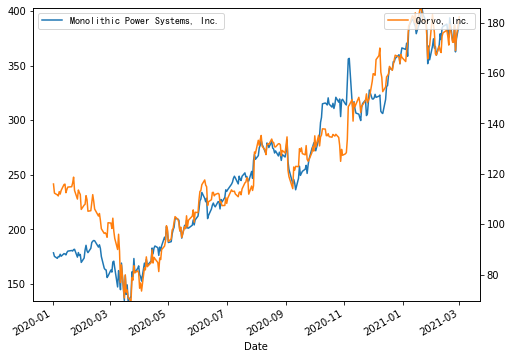


 112 : Digital Turbine, Inc. vs Etsy, Inc. ( 0.9526 )


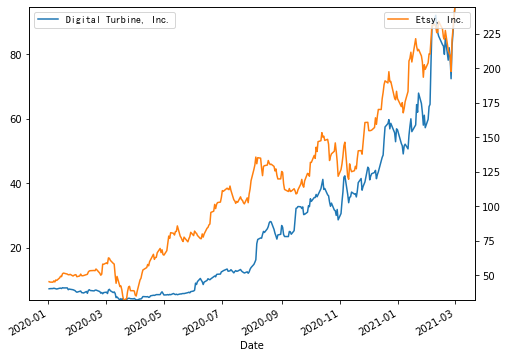


 698 : Lam Research Corporation vs ON Semiconductor Corporation ( 0.9526 )


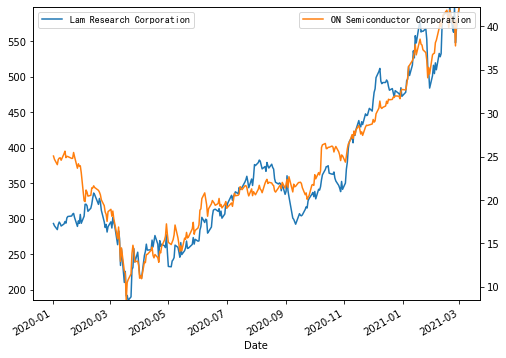


 27 : Analog Devices, Inc. vs Broadcom Inc. ( 0.9526 )


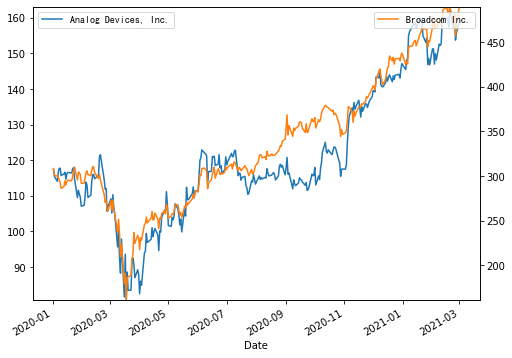


 766 : MKS Instruments, Inc. vs Trimble Inc. ( 0.9525 )


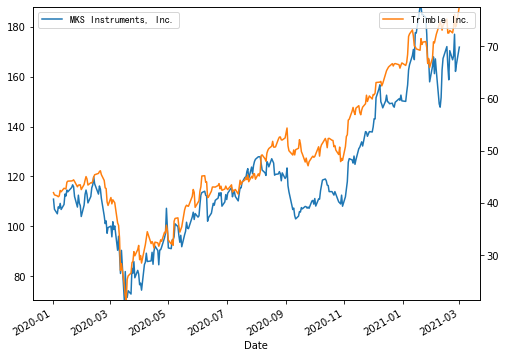


 885 : Nuance Communications, Inc. vs Varonis Systems, Inc. ( 0.9525 )


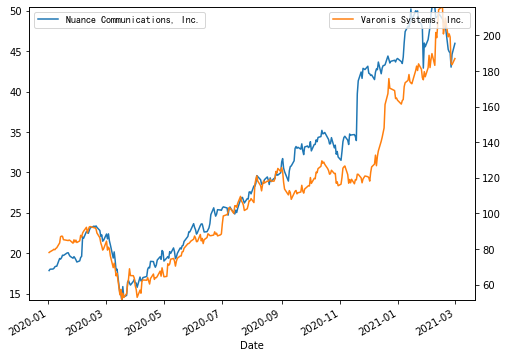


 180 : Broadcom Inc. vs NXP Semiconductors N.V. ( 0.9525 )


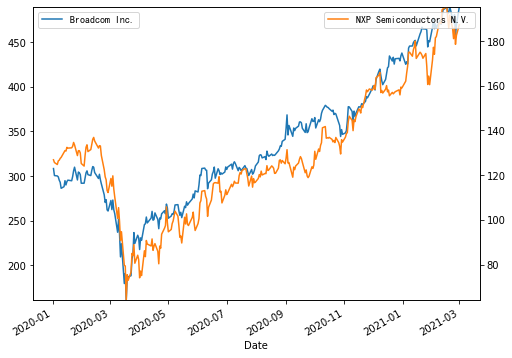


 833 : NICE Ltd vs Nuance Communications, Inc. ( 0.9524 )


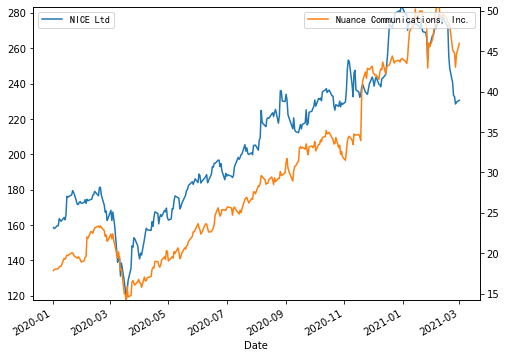


 432 : Etsy, Inc. vs Pinduoduo Inc. ( 0.9524 )


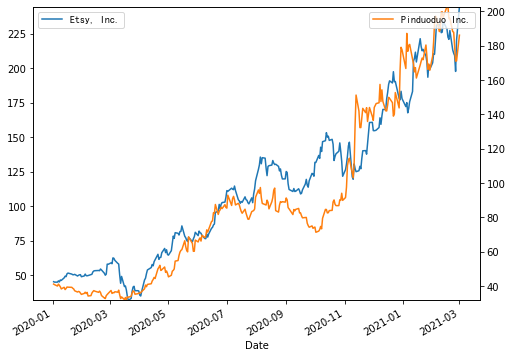


 164 : Broadcom Inc. vs Cree, Inc. ( 0.9523 )


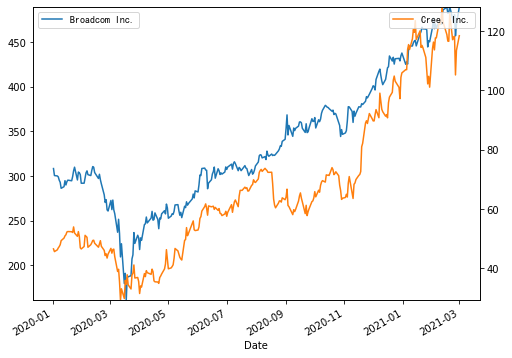


 479 : Five Below, Inc. vs Texas Roadhouse, Inc. ( 0.9522 )


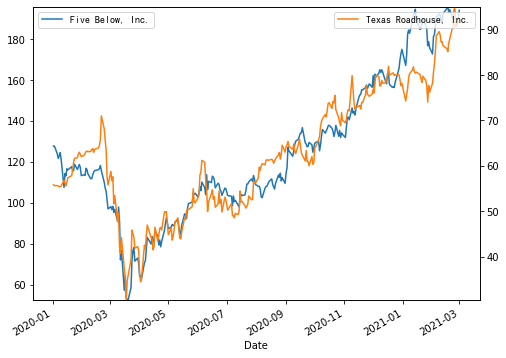


 706 : Lam Research Corporation vs Upwork Inc. ( 0.9522 )


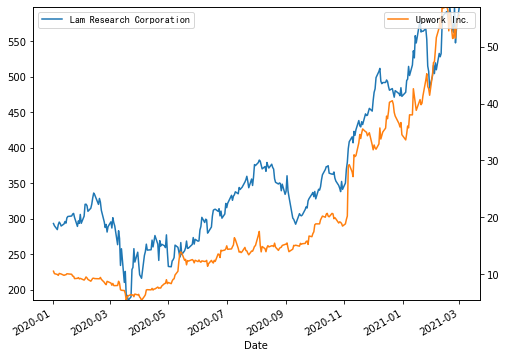


 36 : Analog Devices, Inc. vs NXP Semiconductors N.V. ( 0.952 )


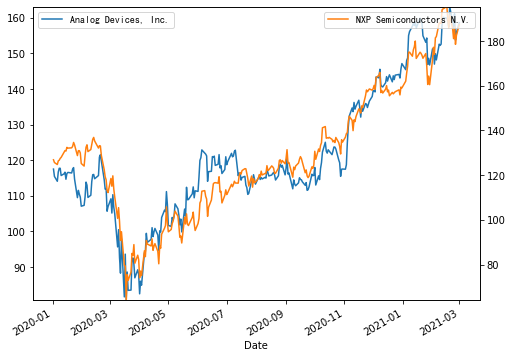


 163 : Activision Blizzard, Inc vs Zscaler, Inc. ( 0.952 )


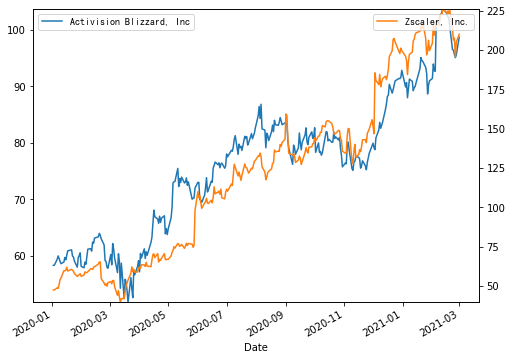


 777 : Monolithic Power Systems, Inc. vs Okta, Inc. ( 0.9519 )


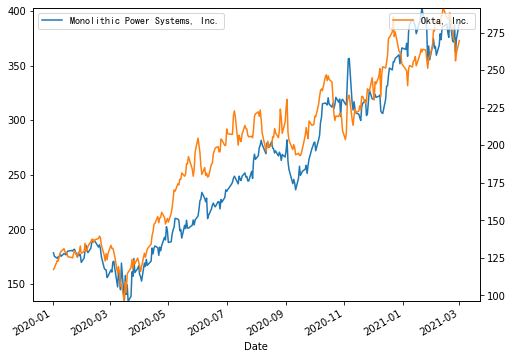


 166 : Broadcom Inc. vs Canadian Solar Inc. ( 0.9517 )


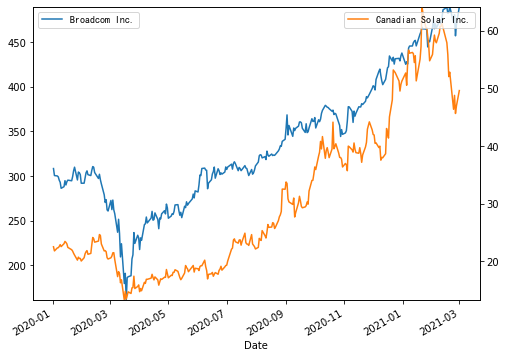


 692 : Logitech International S.A. - R vs Varonis Systems, Inc. ( 0.9517 )


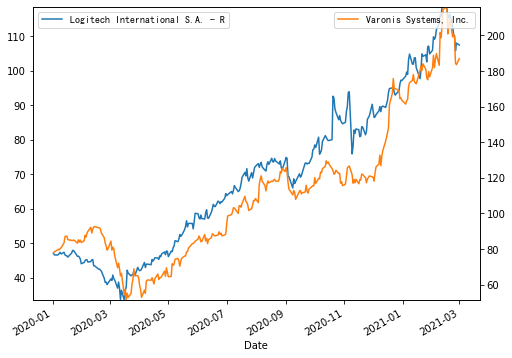


 127 : ASML Holding N.V. - New York Re vs Bilibili Inc. ( 0.9516 )


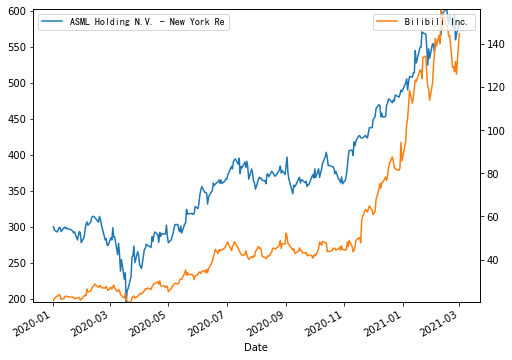


 263 : Coupa Software Incorporated vs Microsoft Corporation ( 0.9515 )


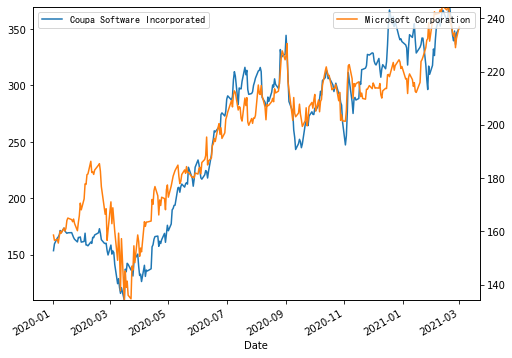


 175 : Broadcom Inc. vs Marvell Technology Group Ltd. ( 0.9515 )


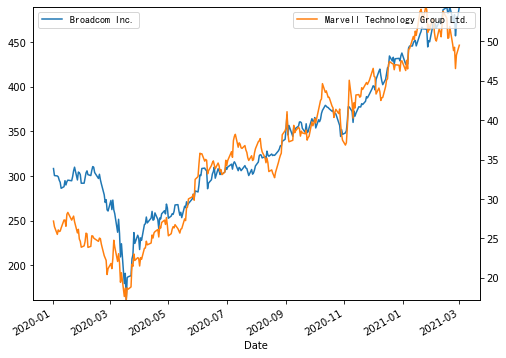


 840 : NICE Ltd vs Zscaler, Inc. ( 0.9515 )


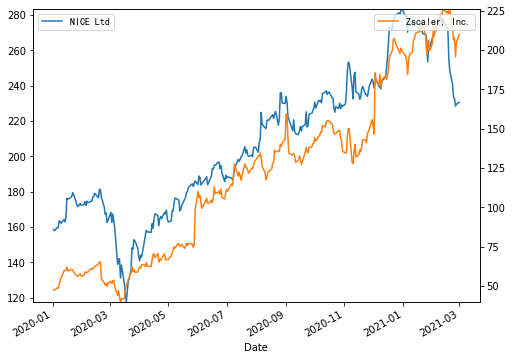


 643 : Intuit Inc. vs Nuance Communications, Inc. ( 0.9515 )


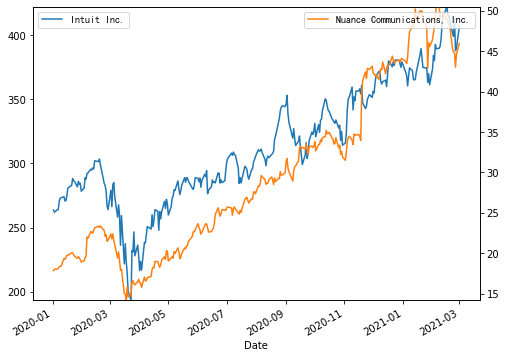


 297 : CRISPR Therapeutics AG vs Fate Therapeutics, Inc. ( 0.9515 )


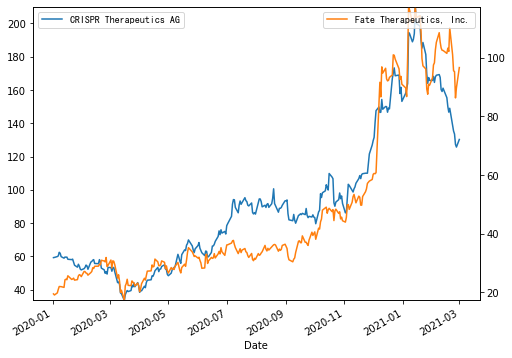


 731 : MongoDB, Inc. vs Upwork Inc. ( 0.9514 )


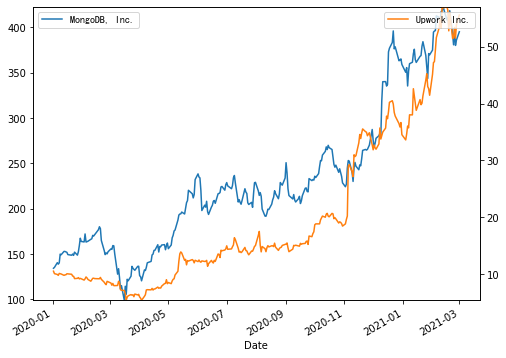


 8 : Apple Inc. vs First Solar, Inc. ( 0.9513 )


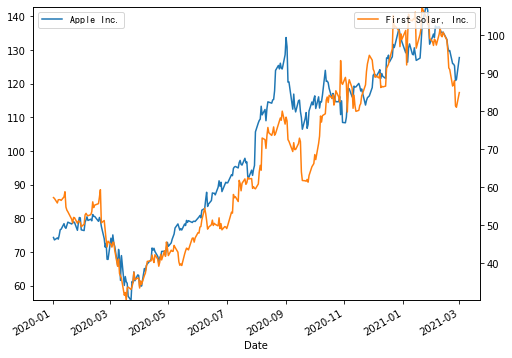


 705 : Lam Research Corporation vs Texas Instruments Incorporated ( 0.9512 )


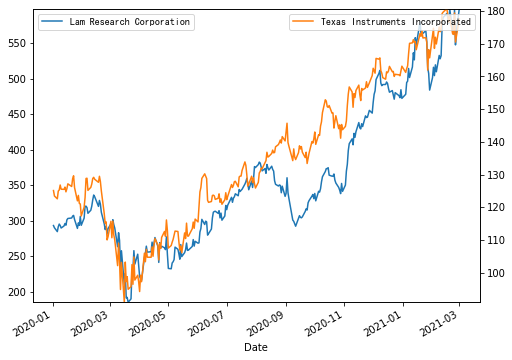


 910 : ON Semiconductor Corporation vs Qorvo, Inc. ( 0.9512 )


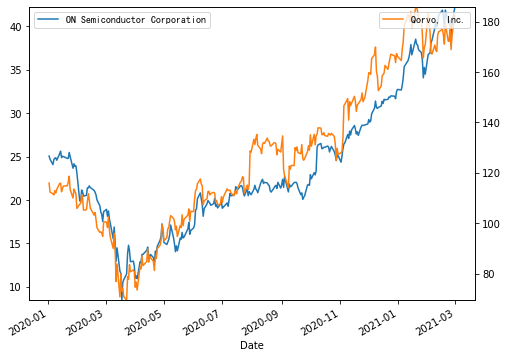


 708 : Marriott International vs Wynn Resorts, Limited ( 0.9512 )


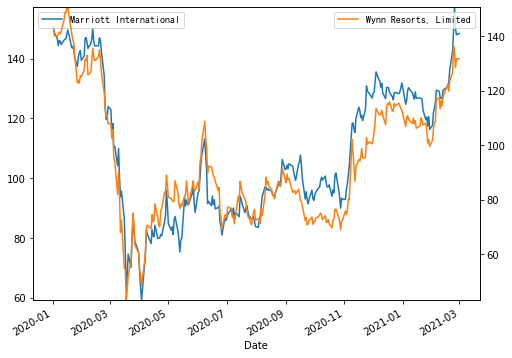


 271 : Cree, Inc. vs Enphase Energy, Inc. ( 0.9512 )


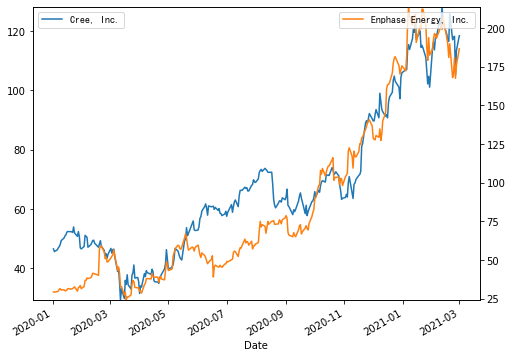


 632 : II-VI Incorporated vs MKS Instruments, Inc. ( 0.9511 )


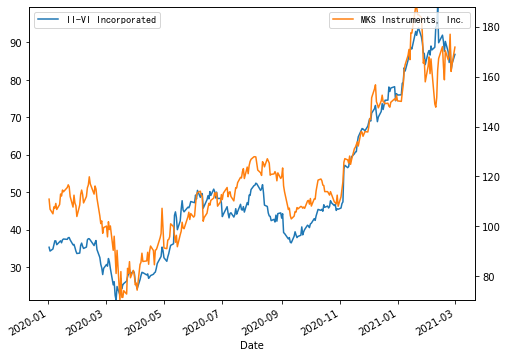


 196 : BridgeBio Pharma, Inc. vs Intellia Therapeutics, Inc. ( 0.9511 )


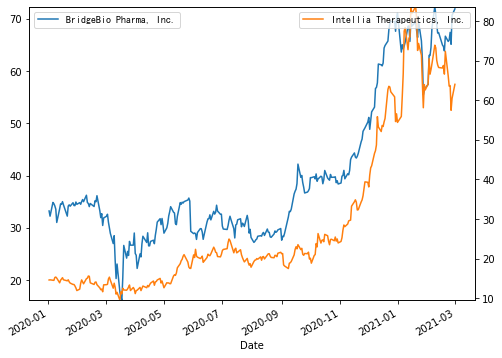


 160 : Activision Blizzard, Inc vs NetEase, Inc. ( 0.9511 )


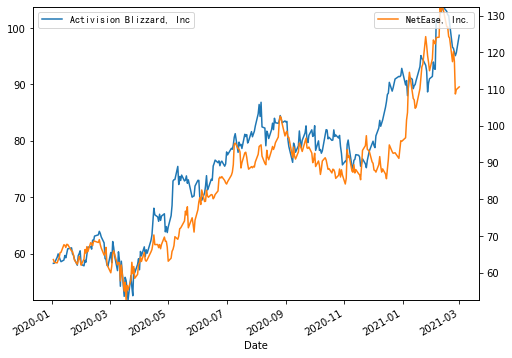


 148 : ASML Holding N.V. - New York Re vs Synopsys, Inc. ( 0.951 )


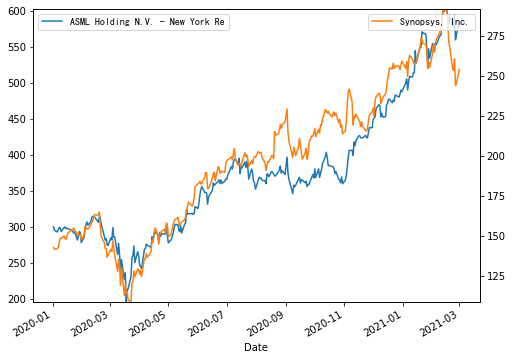


 80 : Applied Materials, Inc. vs Upwork Inc. ( 0.951 )


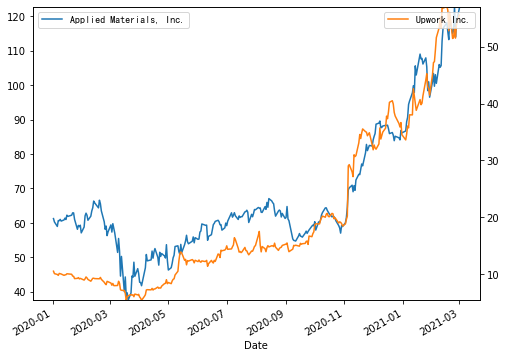


 1008 : Texas Instruments Incorporated vs Xilinx, Inc. ( 0.951 )


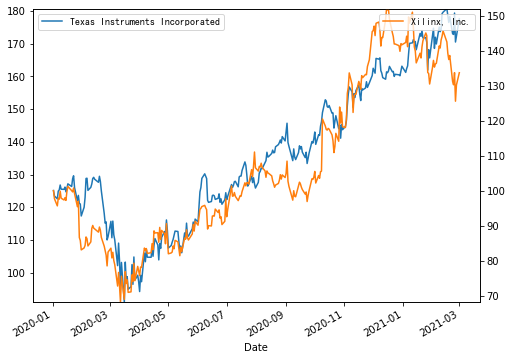


 42 : Analog Devices, Inc. vs Texas Instruments Incorporated ( 0.9509 )


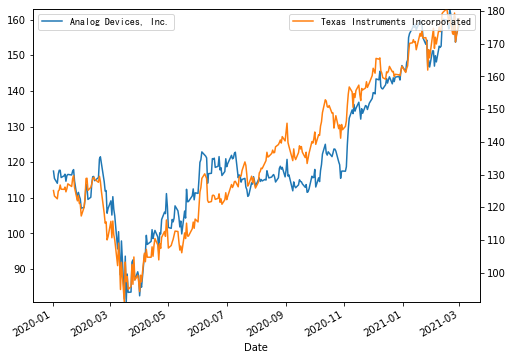


 54 : Align Technology, Inc. vs IDEXX Laboratories, Inc. ( 0.9508 )


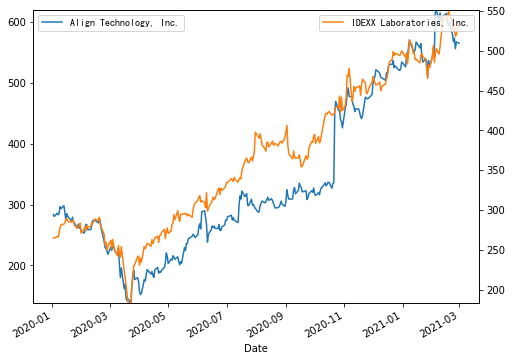


 335 : Canadian Solar Inc. vs First Solar, Inc. ( 0.9508 )


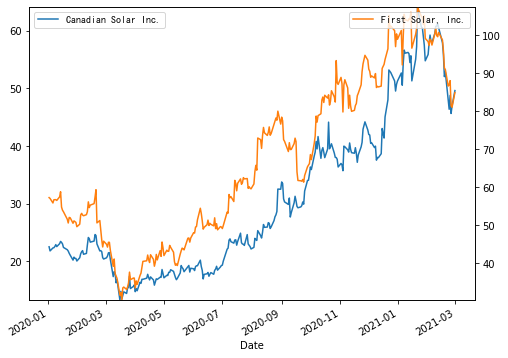


 590 : Hologic, Inc. vs IDEXX Laboratories, Inc. ( 0.9507 )


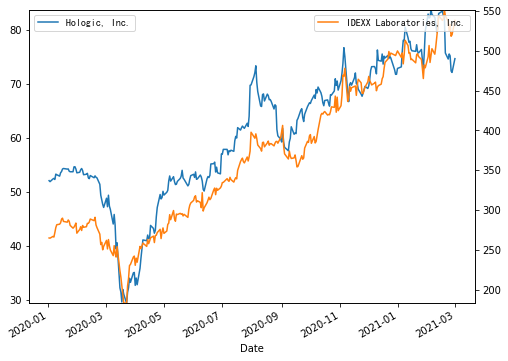


 726 : MongoDB, Inc. vs Nuance Communications, Inc. ( 0.9506 )


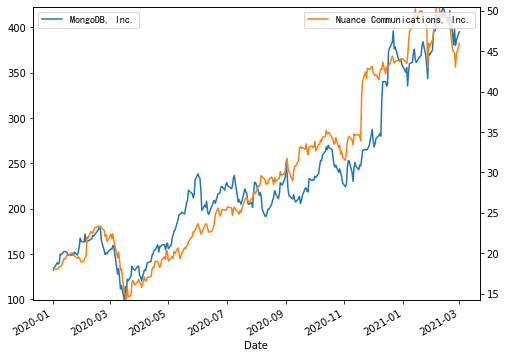


 28 : Analog Devices, Inc. vs Cree, Inc. ( 0.9505 )


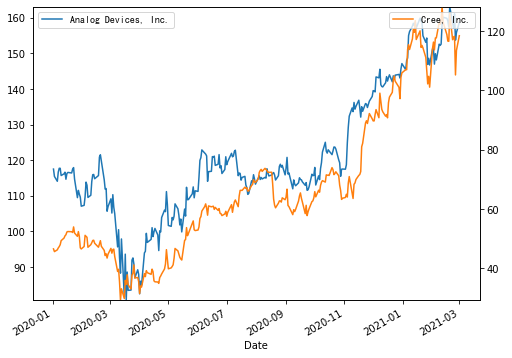


 153 : ASML Holding N.V. - New York Re vs 21Vianet Group, Inc. ( 0.9505 )


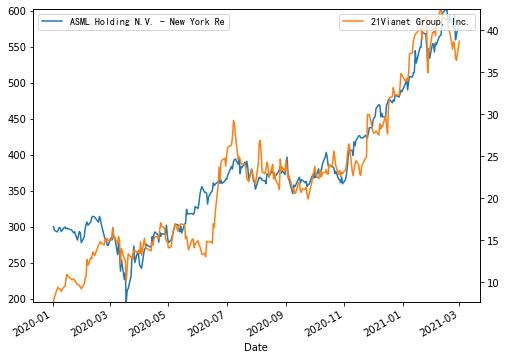


 494 : Five9, Inc. vs SolarEdge Technologies, Inc. ( 0.9504 )


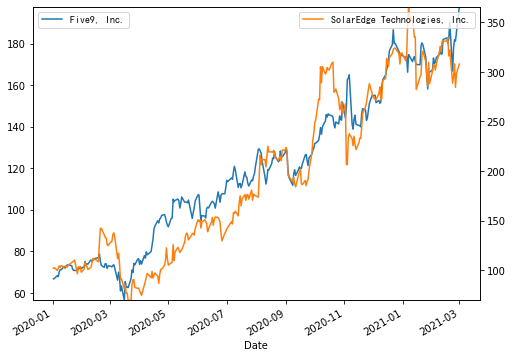


 785 : Monolithic Power Systems, Inc. vs Texas Instruments Incorporated ( 0.9504 )


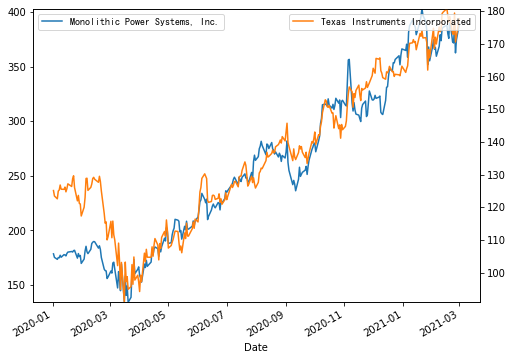


 955 : Qorvo, Inc. vs Xilinx, Inc. ( 0.9504 )


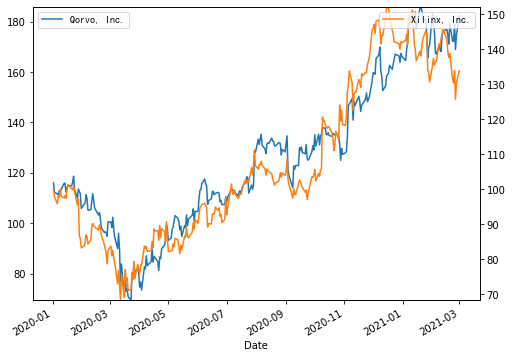


 298 : CRISPR Therapeutics AG vs Halozyme Therapeutics, Inc. ( 0.9504 )


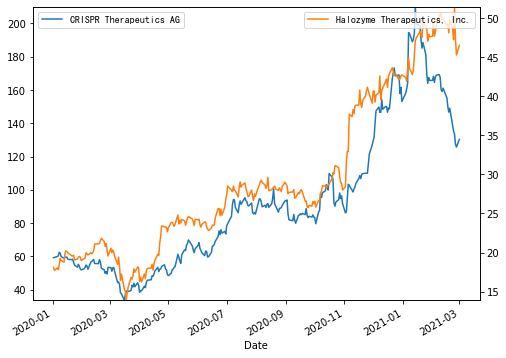


 526 : First Solar, Inc. vs Monolithic Power Systems, Inc. ( 0.9502 )


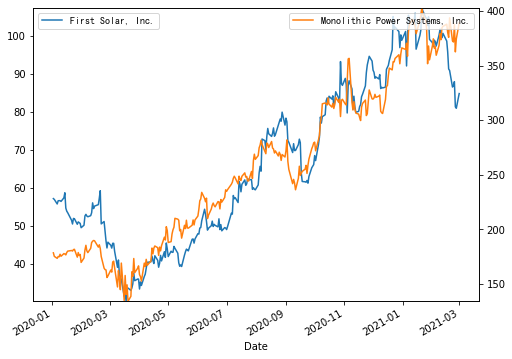


 490 : Five9, Inc. vs Nuance Communications, Inc. ( 0.9502 )


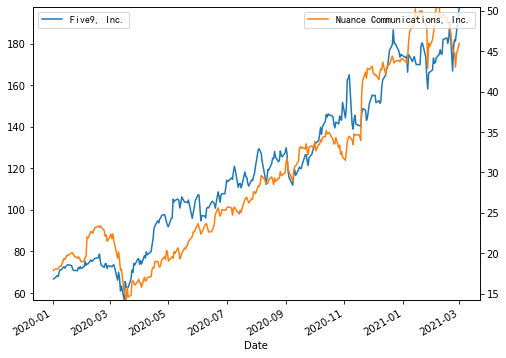


 47 : Autodesk, Inc. vs NICE Ltd ( 0.9501 )


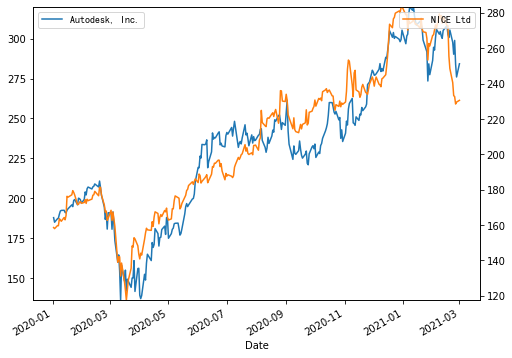


 572 : Halozyme Therapeutics, Inc. vs IDEXX Laboratories, Inc. ( 0.95 )


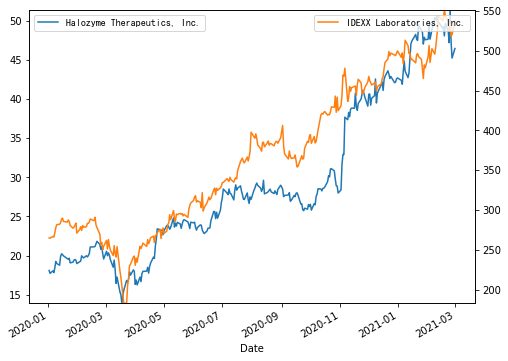

In [ ]:
# Plot all the correlated Pairs with same sector
sectorPairsDf = pairsDf[(pairsDf.sameSector == True)]

for index, row in sectorPairsDf.iterrows():
    print('\n', index, ':', row['stockA'], 'vs', row['stockB'], '(', row['corr'], ')')
    plotPair(stocks, row['stockA'], row['stockB'], SMALL_CHART_SIZE_X, SMALL_CHART_SIZE_Y)

In [ ]:
# Select a Pair for running the ratio
selected_pair = 253

# Calculate the stock price ratios of Pair A/B and Pair B/A over the date period
# The price ratio is "adjusted close price" ratio between the 2 stocks
PAIR_STOCK_A = pairsDf.loc[selected_pair]['stockA']
PAIR_STOCK_B = pairsDf.loc[selected_pair]['stockB']

AB_stock = PAIR_STOCK_A + " / " + PAIR_STOCK_B
BA_stock = PAIR_STOCK_B + " / " + PAIR_STOCK_A

stocks[AB_stock] = stocks[PAIR_STOCK_A] / stocks[PAIR_STOCK_B]
stocks[BA_stock] = stocks[PAIR_STOCK_B] / stocks[PAIR_STOCK_A]

stocks[[PAIR_STOCK_A, PAIR_STOCK_B, AB_stock, BA_stock]]

,"Cadence Design Systems, Inc.","Synopsys, Inc.","Cadence Design Systems, Inc. / Synopsys, Inc.","Synopsys, Inc. / Cadence Design Systems, Inc."
Date,,,,
2020-01-02,71.440002,142.869995,0.500035,1.999860
2020-01-03,70.419998,141.759995,0.496755,2.013064
2020-01-06,70.849998,141.979996,0.499014,2.003952
2020-01-07,71.070000,142.960007,0.497132,2.011538
2020-01-08,72.279999,145.860001,0.495544,2.017986
...,...,...,...,...
2021-02-23,132.600006,253.210007,0.523676,1.909578
2021-02-24,139.419998,260.679993,0.534832,1.869746
2021-02-25,138.020004,244.089996,0.565447,1.768512


In [ ]:
# Calculate the average price ratio of the Pair over the period
# Trade if the current price ratio is significantly different 
PX_RATIO_THRESHOLD = 0.05

# Calculate the average Buy PAIR_STOCK_A / Sell PAIR_STOCK_B ratio
avgPxRatio = stocks[AB_stock].mean()
print("Average BUY/SELL price ratio of", AB_stock, ":", avgPxRatio)

execPxRatio = avgPxRatio * (1 - PX_RATIO_THRESHOLD)
print("Buy", PAIR_STOCK_A, "and Sell", PAIR_STOCK_B, "when the BUY/SELL price ratio is smaller than:", execPxRatio)

print(f'-'*100)
print("The ratio can be reached when relatively ... ")
print(PAIR_STOCK_A, "goes down and become under-valued and should buy it")
print(PAIR_STOCK_B, "goes up and become over-valued and should sell it")

Average BUY/SELL price ratio of Cadence Design Systems, Inc. / Synopsys, Inc. : 0.5071256520849418
Buy Cadence Design Systems, Inc. and Sell Synopsys, Inc. when the BUY/SELL price ratio is smaller than: 0.48176936948069465
----------------------------------------------------------------------------------------------------
The ratio can be reached when relatively ... 
Cadence Design Systems, Inc. goes down and become under-valued and should buy it
Synopsys, Inc. goes up and become over-valued and should sell it


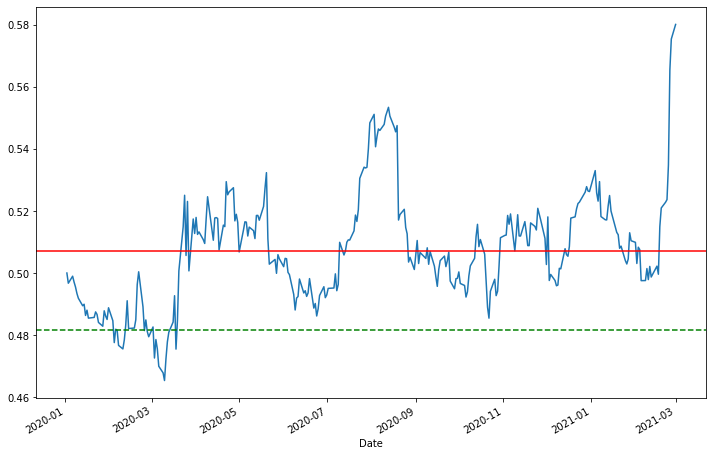

In [ ]:
# Plot the averge ratio vs the price ratio threshold
stocks[AB_stock].plot(figsize=(CHART_SIZE_X, CHART_SIZE_Y))

plt.axhline(y=avgPxRatio, color='r', linestyle='-')
plt.axhline(y=execPxRatio, color='g', linestyle='--')

In [ ]:
# Calculate the average Buy PAIR_STOCK_B / Sell PAIR_STOCK_A ratio
avgPxRatio = stocks[BA_stock].mean()
print("Average BUY/SELL price ratio of", BA_stock, ":", avgPxRatio)

execPxRatio = avgPxRatio * (1 - PX_RATIO_THRESHOLD)
print("Buy", PAIR_STOCK_B, "and Sell", PAIR_STOCK_A, "when the BUY/SELL price ratio is smaller than:", execPxRatio)

print(f'-'*100)
print("The ratio can be reached when relatively ... ")
print(PAIR_STOCK_B, "goes down and become under-valued and should buy it")
print(PAIR_STOCK_A, "goes up and become over-valued and should sell it")

Average BUY/SELL price ratio of Synopsys, Inc. / Cadence Design Systems, Inc. : 1.9743672303492124
Buy Synopsys, Inc. and Sell Cadence Design Systems, Inc. when the BUY/SELL price ratio is smaller than: 1.8756488688317516
----------------------------------------------------------------------------------------------------
The ratio can be reached when relatively ... 
Synopsys, Inc. goes down and become under-valued and should buy it
Cadence Design Systems, Inc. goes up and become over-valued and should sell it


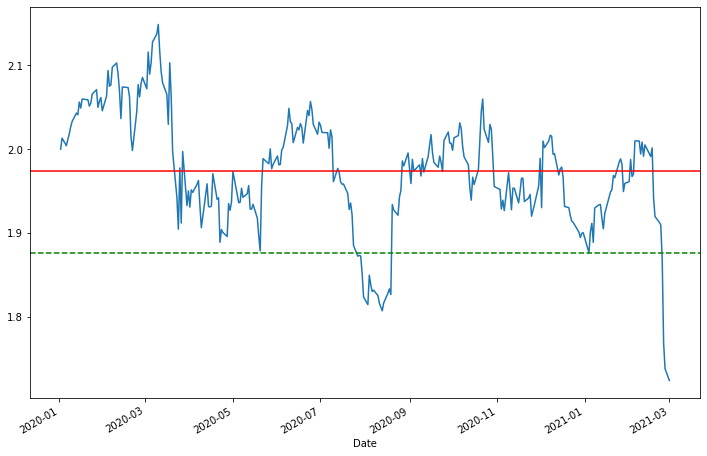

In [ ]:
# Plot the averge ratio vs the price ratio threshold
stocks[BA_stock].plot(figsize=(CHART_SIZE_X, CHART_SIZE_Y))

plt.axhline(y=avgPxRatio, color='r', linestyle='-')
plt.axhline(y=execPxRatio, color='g', linestyle='--')

In [ ]:
def find_cointegrated_pairs(data):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    pairs = []
    for i in range(n):
        for j in range(i+1, n):
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result = coint(S1, S2)
            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue
            if pvalue < 0.05:
                pairs.append((keys[i], keys[j]))
    return score_matrix, pvalue_matrix, pairs



In [ ]:
start = datetime(2017, 1, 1)
end = datetime(2021, 3, 1)

tickers = ['CDNS','SNPS']


df = yf.download(tickers, start, end)['Adj Close']
df.tail()

[*********************100%***********************]  2 of 2 completed


,CDNS,SNPS
Date,,
2021-02-22,133.160004,254.690002
2021-02-23,132.600006,253.210007
2021-02-24,139.419998,260.679993
2021-02-25,138.020004,244.089996
2021-02-26,141.089996,245.210007


In [ ]:
df=df.dropna()

[('American Airlines Group, Inc.', 'Automatic Data Processing, Inc.'), ('American Airlines Group, Inc.', 'Avis Budget Group, Inc.'), ('American Airlines Group, Inc.', 'ChromaDex Corporation'), ('American Airlines Group, Inc.', 'DermTech, Inc.'), ('American Airlines Group, Inc.', 'Diamondback Energy, Inc. - Comm'), ('American Airlines Group, Inc.', 'First Solar, Inc.'), ('American Airlines Group, Inc.', 'The Goodyear Tire & Rubber Comp'), ('American Airlines Group, Inc.', 'Li Auto Inc.'), ('American Airlines Group, Inc.', 'Mondelez International, Inc.'), ('American Airlines Group, Inc.', 'Marvell Technology Group Ltd.'), ('American Airlines Group, Inc.', 'Microvision, Inc.'), ('American Airlines Group, Inc.', 'News Corporation'), ('American Airlines Group, Inc.', 'Universal Display Corporation'), ('American Airlines Group, Inc.', 'Plug Power, Inc.'), ('American Airlines Group, Inc.', 'Peloton Interactive, Inc.'), ('American Airlines Group, Inc.', 'Splunk Inc.'), ('American Airlines Grou

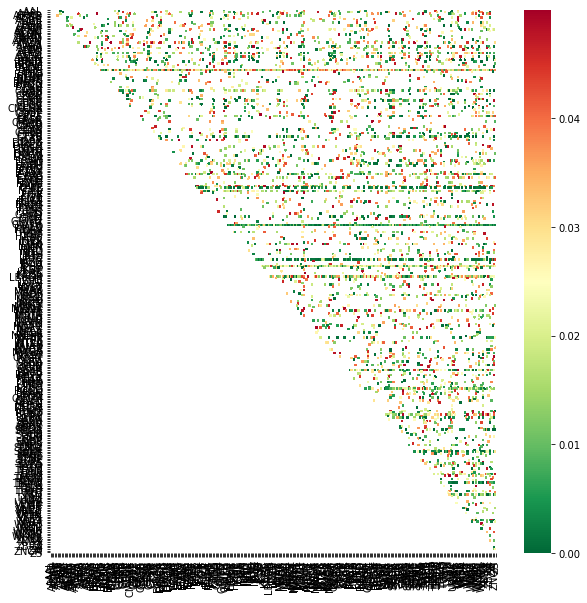

In [ ]:
# Heatmap to show the p-values of the cointegration test between each pair of
# stocks. Only show the value in the upper-diagonal of the heatmap
scores, pvalues, pairs = find_cointegrated_pairs(stockss)
import seaborn
fig, ax = plt.subplots(figsize=(10,10))
seaborn.heatmap(pvalues, xticklabels=stocksFilteredInfo['Symbol'], yticklabels=stocksFilteredInfo['Symbol'], cmap='RdYlGn_r' 
                , mask = (pvalues >= 0.05)
                )
print(pairs)

In [ ]:
S1 = df['CDNS']
S2 = df['SNPS']

score, pvalue, _ = coint(S1, S2)
pvalue

# As we can see, the p-value is less than 0.05 which means these two are indeed cointegrated pairs.

0.03292722964868971

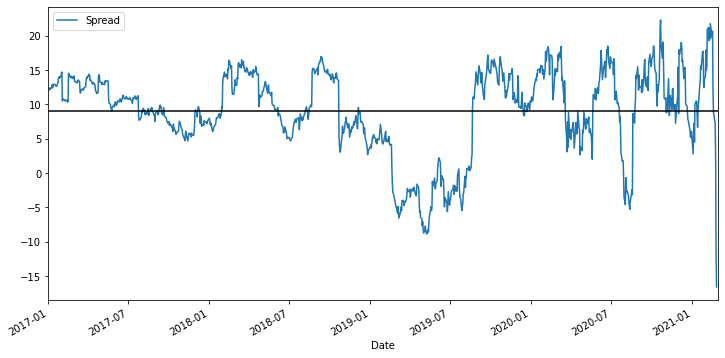

In [ ]:
# In order to caculate the spread, we use a linear regression to get the coefficient for the lineat combination to construct bewteen two stocks
S1 = sm.add_constant(S1)
results = sm.OLS(S2, S1).fit()
S1 = S1['CDNS']
b = results.params['CDNS']

spread = S2 - b * S1
spread.plot(figsize=(12,6))
plt.axhline(spread.mean(), color='black')
plt.xlim('2017-01-01', '2021-03-01')
plt.legend(['Spread']);

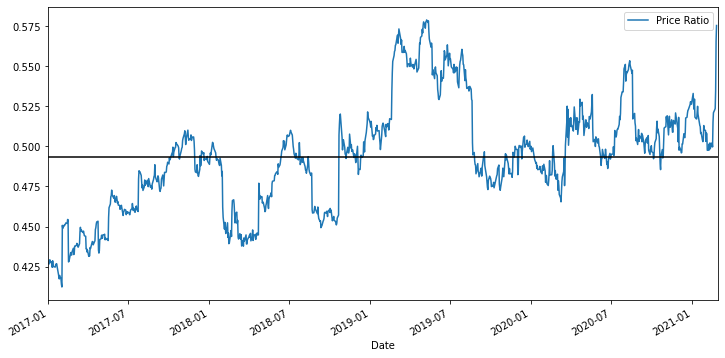

In [ ]:
# Alternatively, we examine the ration between the two time series
ratio = S1/S2
ratio.plot(figsize=(12,6))
plt.axhline(ratio.mean(), color='black')
plt.xlim('2017-01-01', '2021-03-01')
plt.legend(['Price Ratio']);

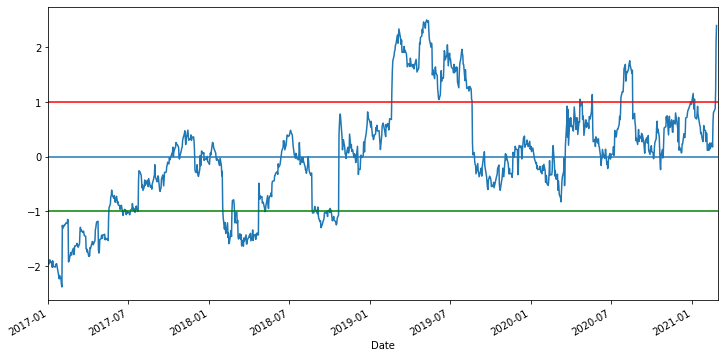

In [ ]:
# By setting two other lines placed at the z-score of 1 and -1, we can clearly see any bug divergences from the mean eventually converges back.
def zscore(series):
    return (series - series.mean()) / np.std(series)
zscore(ratio).plot(figsize=(12,6))
plt.axhline(zscore(ratio).mean())
plt.axhline(1.0, color='red')
plt.axhline(-1.0, color='green')
plt.xlim('2017-01-01', '2021-03-01')
plt.show()

In [ ]:
#Train Test Split
ratios = df['CDNS']/df['SNPS']
print(len(ratios) * .70 ) 

731.5


In [ ]:
train = ratios[:732]
test = ratios[732:]

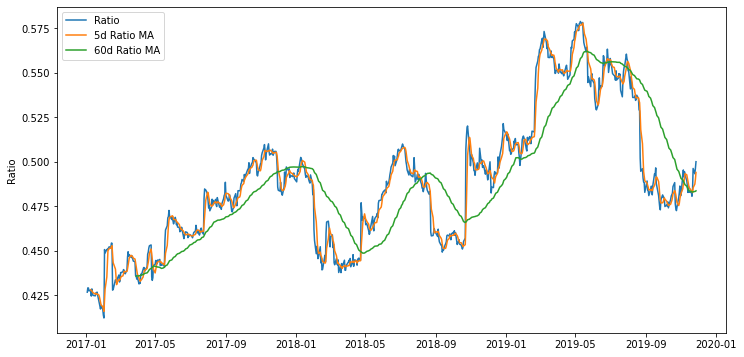

In [ ]:
# Feature Engineering 
# 60 day moving average ratio, 5 day moving average ratio, 60 day standard deviation
ratios_mavg5 = train.rolling(window=5, center=False).mean()
ratios_mavg60 = train.rolling(window=60, center=False).mean()
std_60 = train.rolling(window=60, center=False).std()
zscore_60_5 = (ratios_mavg5 - ratios_mavg60)/std_60
plt.figure(figsize=(12, 6))
plt.plot(train.index, train.values)
plt.plot(ratios_mavg5.index, ratios_mavg5.values)
plt.plot(ratios_mavg60.index, ratios_mavg60.values)
plt.legend(['Ratio', '5d Ratio MA', '60d Ratio MA'])

plt.ylabel('Ratio')
plt.show()

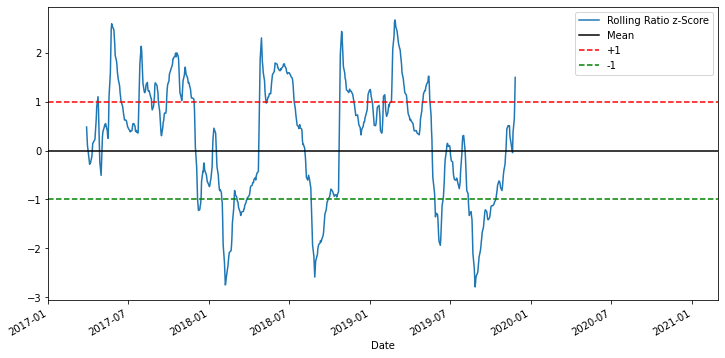

In [ ]:
# z-score
plt.figure(figsize=(12,6))
zscore_60_5.plot()
plt.xlim('2017-01-01', '2021-03-01')
plt.axhline(0, color='black')
plt.axhline(1.0, color='red', linestyle='--')
plt.axhline(-1.0, color='green', linestyle='--')
plt.legend(['Rolling Ratio z-Score', 'Mean', '+1', '-1'])
plt.show()

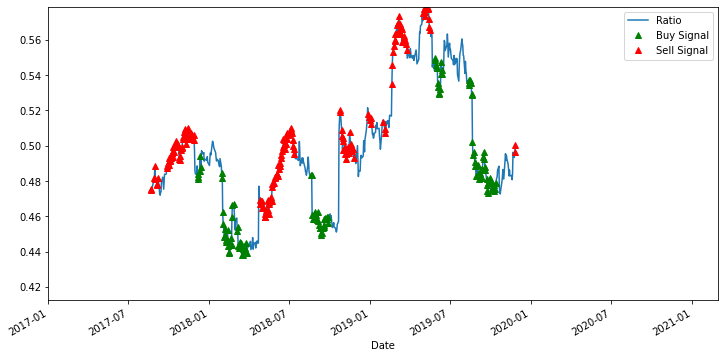

In [ ]:
# Creating a Model
# Buy(1)whenever the z-score is below -1, meaning we expect the ratio to increase.
# Sell(-1) whenever the z-score is above 1, meaning we expect the ratio to decrease.
plt.figure(figsize=(12,6))

train[160:].plot()
buy = train.copy()
sell = train.copy()
buy[zscore_60_5>-1] = 0
sell[zscore_60_5<1] = 0
buy[160:].plot(color='g', linestyle='None', marker='^')
sell[160:].plot(color='r', linestyle='None', marker='^')
x1, x2, y1, y2 = plt.axis()
plt.axis((x1, x2, ratios.min(), ratios.max()))
plt.xlim('2017-01-01','2021-03-01')
plt.legend(['Ratio', 'Buy Signal', 'Sell Signal'])
plt.show()

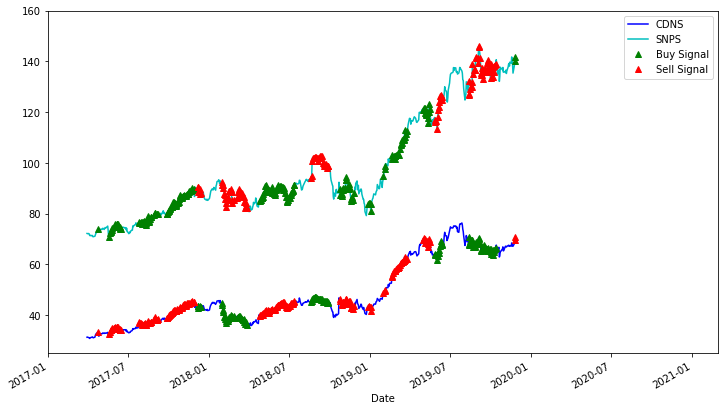

In [ ]:
plt.figure(figsize=(12,7))
S1 = df['CDNS'].iloc[:732]
S2 = df['SNPS'].iloc[:732]

S1[60:].plot(color='b')
S2[60:].plot(color='c')
buyR = 0*S1.copy()
sellR = 0*S1.copy()

# When you buy the ratio, you buy stock S1 and sell S2
buyR[buy!=0] = S1[buy!=0]
sellR[buy!=0] = S2[buy!=0]

# When you sell the ratio, you sell stock S1 and buy S2
buyR[sell!=0] = S2[sell!=0]
sellR[sell!=0] = S1[sell!=0]

buyR[60:].plot(color='g', linestyle='None', marker='^')
sellR[60:].plot(color='r', linestyle='None', marker='^')
x1, x2, y1, y2 = plt.axis()
plt.axis((x1, x2, min(S1.min(), S2.min()), max(S1.max(), S2.max())))
plt.ylim(25, 160)
plt.xlim('2017-01-01', '2021-03-01')

plt.legend(['CDNS', 'SNPS', 'Buy Signal', 'Sell Signal'])
plt.show()

In [ ]:
# Trade using a simple strategy
def trade(S1, S2, window1, window2):
    
    # If window length is 0, algorithm doesn't make sense, so exit
    if (window1 == 0) or (window2 == 0):
        return 0
    
    # Compute rolling mean and rolling standard deviation
    ratios = S1/S2
    ma1 = ratios.rolling(window=window1,
                               center=False).mean()
    ma2 = ratios.rolling(window=window2,
                               center=False).mean()
    std = ratios.rolling(window=window2,
                        center=False).std()
    zscore = (ma1 - ma2)/std
    
    # Simulate trading
    # Start with no money and no positions
    money = 0
    countS1 = 0
    countS2 = 0
    for i in range(len(ratios)):
        # Sell short if the z-score is > 1
        if zscore[i] < -1:
            money += S1[i] - S2[i] * ratios[i]
            countS1 -= 1
            countS2 += ratios[i]
            #print('Selling Ratio %s %s %s %s'%(money, ratios[i], countS1,countS2))
        # Buy long if the z-score is < -1
        elif zscore[i] > 1:
            money -= S1[i] - S2[i] * ratios[i]
            countS1 += 1
            countS2 -= ratios[i]
            #print('Buying Ratio %s %s %s %s'%(money,ratios[i], countS1,countS2))
        # Clear positions if the z-score between -.5 and .5
        elif abs(zscore[i]) < 0.75:
            money += S1[i] * countS1 + S2[i] * countS2
            countS1 = 0
            countS2 = 0
            #print('Exit pos %s %s %s %s'%(money,ratios[i], countS1,countS2))
            
            
    return money

In [ ]:
trade(df['CDNS'].iloc[732:],df['SNPS'].iloc[732:], 60, 5)

625.8206675782883

In [ ]:
stockss

,"American Airlines Group, Inc.",Apple Inc.,"ABIOMED, Inc.","Airbnb, Inc.",Arch Capital Group Ltd.,Adobe Inc.,"Analog Devices, Inc.","Automatic Data Processing, Inc.","Autodesk, Inc.",American Electric Power Company,"Affirm Holdings, Inc.",AGNC Investment Corp.,"Akamai Technologies, Inc.","Align Technology, Inc.","Alexion Pharmaceuticals, Inc.","Applied Materials, Inc.","Advanced Micro Devices, Inc.",Amgen Inc.,"Amazon.com, Inc.","ANSYS, Inc.",Apache Corporation,Aphria Inc.,"Agora, Inc.",Appian Corporation,"Digital Turbine, Inc.",ASML Holding N.V. - New York Re,"Activision Blizzard, Inc",Broadcom Inc.,Astrazeneca PLC,Bed Bath & Beyond Inc.,"BridgeBio Pharma, Inc.",Beam Therapeutics Inc.,"BeiGene, Ltd.","Baidu, Inc.","BigCommerce Holdings, Inc. - Se",Biogen Inc.,Bilibili Inc.,Booking Holdings Inc. Common St,"Ballard Power Systems, Inc.",Blink Charging Co. Common Stock,...,"Tesla, Inc.","The Trade Desk, Inc.","Take-Two Interactive Software,",Twist Bioscience Corporation,"10x Genomics, Inc.",Texas Instruments Incorporated,"Texas Roadhouse, Inc.","United Continental Holdings, In","Ulta Beauty, Inc.",Upwork Inc.,"Vaccinex, Inc.",ViacomCBS Inc.,"Velodyne Lidar, Inc.","21Vianet Group, Inc.","Varonis Systems, Inc.","Verisk Analytics, Inc.","VeriSign, Inc.",Vertex Pharmaceuticals Incorpor,Viatris Inc.,Vuzix Corporation,Energous Corporation,"Walgreens Boots Alliance, Inc.","Workday, Inc.",Western Digital Corporation,ContextLogic Inc.,Wix.com Ltd.,"Workhorse Group, Inc.",Willis Towers Watson Public Lim,WSFS Financial Corporation,"Wynn Resorts, Limited",Xcel Energy Inc.,"Xilinx, Inc.",Yandex N.V.,JOYY Inc.,"Zillow Group, Inc.",Zebra Technologies Corporation,ZoomInfo Technologies Inc.,"Zoom Video Communications, Inc.",Zynga Inc.,"Zscaler, Inc."
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-13,15.530000,130.694702,323.709991,169.990005,35.610001,472.049988,157.803986,164.660004,314.329987,77.435860,97.239998,15.290578,101.680000,551.140015,156.440002,97.864265,91.779999,235.985321,3165.889893,375.579987,17.774527,10.000000,39.709999,159.550003,57.619999,514.059998,89.769997,451.209991,49.915211,23.020000,65.680000,97.940002,310.140015,236.940002,66.000000,266.670013,119.309998,2182.419922,36.580002,50.810001,...,854.409973,785.450012,199.500000,168.410004,175.520004,170.376862,80.739998,44.430000,294.010010,41.340000,2.42,43.119999,23.910000,39.220001,174.009995,196.880005,199.399994,227.100006,18.400000,9.750000,3.13,48.477852,229.070007,49.470001,23.920000,253.509995,24.540001,204.270004,46.449638,107.900002,65.010002,141.169998,68.989998,89.510002,143.229996,412.450012,45.020000,364.630005,9.81,207.080002
2021-01-14,16.440001,128.717667,318.309998,180.500000,35.220001,463.269989,158.779816,161.910004,311.109985,78.109650,114.940002,15.389099,102.849998,554.640015,156.649994,105.599586,90.790001,239.876389,3127.469971,369.049988,18.323740,12.110000,39.080002,174.089996,59.970001,544.650024,89.989998,452.070007,50.317436,27.340000,69.730003,111.320000,335.959991,249.000000,64.739998,280.290009,123.220001,2182.590088,34.549999,52.619999,...,845.000000,775.299988,195.470001,189.429993,179.889999,170.675064,80.379997,46.290001,301.790009,40.209999,2.56,46.000000,24.070000,39.540001,173.289993,193.880005,195.699997,226.119995,17.309999,9.490000,3.03,48.854267,227.330002,50.369999,28.129999,248.509995,24.610001,205.500000,47.018166,109.000000,63.560001,140.000000,69.290001,90.010002,143.699997,411.980011,45.419998,383.239990,9.91,209.869995
2021-01-15,15.760000,126.950294,329.690002,169.270004,34.689999,458.079987,157.077103,161.119995,308.510010,79.734665,117.000000,15.418655,106.449997,567.229980,156.699997,102.944618,88.209999,243.678131,3104.250000,364.279999,17.245287,12.420000,37.139999,169.699997,55.990002,527.500000,90.690002,445.850006,50.366486,25.600000,68.610001,113.040001,345.000000,238.869995,62.369999,275.839996,122.629997,2119.229980,30.830000,47.099998,...,826.159973,785.359985,19

In [ ]:
from pandas_datareader import data as pdr

import yfinance as yf
yf.pdr_override() # <== that's all it takes :-)

# download dataframe using pandas_datareader
data = pdr.get_data_yahoo("SPY", start="2017-01-01", end="2017-04-30")

[*********************100%***********************]  1 of 1 completed


In [ ]:
pip install yfinance

     |████████████████████████████████| 5.5MB 11.3MB/s 
  Created wheel for yfinance: filename=yfinance-0.1.55-py2.py3-none-any.whl size=22616 sha256=c1369ced6ed3d66c2d46301d7e03367362684da5df483d2f447fb07a0b34e997
  Stored in directory: /root/.cache/pip/wheels/04/98/cc/2702a4242d60bdc14f48b4557c427ded1fe92aedf257d4565c
Successfully built yfinance
  Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6


In [ ]:
if type(data) == list:

    print("a is a list")

else:

    print("a is a tuple")

a is a tuple


In [ ]:
from functools import partial
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import random_split
import torchvision
import torchvision.transforms as transforms

from ray import tune
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler


# 定义神经网络模型
class Net(nn.Module):
    def __init__(self, l1=120, l2=84):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, l1)  # 参数待指定
        self.fc2 = nn.Linear(l1, l2)  # 参数待指定
        self.fc3 = nn.Linear(l2, 10)  # 参数待指定

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


# 封装数据加载过程，传递全局数据路径，以保证不同实验间共享数据路径
def load_data(data_dir="/home/taoshouzheng/Local_Connection/Algorithms/ray/"):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    trainset = torchvision.datasets.CIFAR10(
        root=data_dir, train=True, download=True, transform=transform)

    testset = torchvision.datasets.CIFAR10(
        root=data_dir, train=False, download=True, transform=transform)

    return trainset, testset


# 封装训练脚本
# config参数用于指定超参数
# checkpoint_dir参数用于存储检查点
# data_dir参数用于指定数据加载和存储路径
def train_cifar(config, checkpoint_dir=None, data_dir=None):
    # 模型实例化
    net = Net(config["l1"], config["l2"])  # 2个超参数

    # 这种写法保证没有GPU可用时模型也可以训练
    device = "cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
        if torch.cuda.device_count() > 1:
            # 将模型封装到nn.DataParallel中以支持多GPU并行训练
            net = nn.DataParallel(net)
    net.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(net.parameters(), lr=config["lr"], momentum=0.9)  # 1个超参数

    # 用于存储检查点
    if checkpoint_dir:
        # 模型的状态、优化器的状态
        model_state, optimizer_state = torch.load(
            os.path.join(checkpoint_dir, "checkpoint"))
        net.load_state_dict(model_state)
        optimizer.load_state_dict(optimizer_state)

    trainset, testset = load_data(data_dir)

    test_abs = int(len(trainset) * 0.8)
    # 将训练数据划分为训练集（80%）和验证集（20%）
    train_subset, val_subset = random_split(
        trainset, [test_abs, len(trainset) - test_abs])

    trainloader = torch.utils.data.DataLoader(
        train_subset,
        batch_size=int(config["batch_size"]),  # 1个超参数
        shuffle=True,
        num_workers=8)
    valloader = torch.utils.data.DataLoader(
        val_subset,
        batch_size=int(config["batch_size"]),
        shuffle=True,
        num_workers=8)

    for epoch in range(10):  # loop over the dataset multiple times
        running_loss = 0.0
        epoch_steps = 0

        # 训练循环
        for i, data in enumerate(trainloader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)
            # zero the parameter gradients
            optimizer.zero_grad()
            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            # print statistics
            running_loss += loss.item()
            epoch_steps += 1
            if i % 2000 == 1999:  # print every 2000 mini-batches
                print("[%d, %5d] loss: %.3f" % (epoch + 1, i + 1,
                                                running_loss / epoch_steps))
                running_loss = 0.0

        # 验证循环
        # Validation loss
        val_loss = 0.0
        val_steps = 0
        total = 0
        correct = 0
        for i, data in enumerate(valloader, 0):
            with torch.no_grad():
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)

                outputs = net(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                loss = criterion(outputs, labels)
                val_loss += loss.cpu().numpy()
                val_steps += 1

        # 保存检查点
        # ray.tune.checkpoint_dir(step)返回检查点路径
        with tune.checkpoint_dir(epoch) as checkpoint_dir:
            path = os.path.join(checkpoint_dir, "checkpoint")
            torch.save((net.state_dict(), optimizer.state_dict()), path)
        # 打印平均损失和平均精度
        tune.report(loss=(val_loss / val_steps), accuracy=correct / total)
    print("Finished Training")


# 测试集精度
def test_accuracy(net, device="cpu"):
    trainset, testset = load_data()

    testloader = torch.utils.data.DataLoader(
        testset, batch_size=4, shuffle=False, num_workers=2)

    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return correct / total


def main(num_samples=10, max_num_epochs=10, gpus_per_trial=2):
    # 全局文件路径
    data_dir = os.path.abspath("C:/home")
    # 加载训练数据
    load_data(data_dir)
    # 配置超参数搜索空间
    # 每次实验，Ray Tune会随机采样超参数组合，并行训练模型，找到最优参数组合
    config = {
        # 自定义采样方法
        "l1": tune.sample_from(lambda _: 2 ** np.random.randint(2, 9)),
        "l2": tune.sample_from(lambda _: 2 ** np.random.randint(2, 9)),
        # 随机分布采样
        "lr": tune.loguniform(1e-4, 1e-1),
        # 从类别型值中随机选择
        "batch_size": tune.choice([2, 4, 8, 16])
    }
    # ASHAScheduler会根据指定标准提前中止坏实验
    scheduler = ASHAScheduler(
        metric="loss",
        mode="min",
        max_t=max_num_epochs,
        grace_period=1,
        reduction_factor=2)
    # 在命令行打印实验报告
    reporter = CLIReporter(
        # parameter_columns=["l1", "l2", "lr", "batch_size"],
        metric_columns=["loss", "accuracy", "training_iteration"])
    # 执行训练过程
    result = tune.run(
        partial(train_cifar, data_dir=data_dir),
        # 指定训练资源
        resources_per_trial={"cpu": 8, "gpu": gpus_per_trial},
        config=config,
        num_samples=num_samples,
        scheduler=scheduler,
        progress_reporter=reporter)

    # 找出最佳实验
    best_trial = result.get_best_trial("loss", "min", "last")
    # 打印最佳实验的参数配置
    print("Best trial config: {}".format(best_trial.config))
    print("Best trial final validation loss: {}".format(
        best_trial.last_result["loss"]))
    print("Best trial final validation accuracy: {}".format(
        best_trial.last_result["accuracy"]))

    # 打印最优超参数组合对应的模型在测试集上的性能
    best_trained_model = Net(best_trial.config["l1"], best_trial.config["l2"])
    device = "cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
        if gpus_per_trial > 1:
            best_trained_model = nn.DataParallel(best_trained_model)
    best_trained_model.to(device)

    best_checkpoint_dir = best_trial.checkpoint.value
    model_state, optimizer_state = torch.load(os.path.join(
        best_checkpoint_dir, "checkpoint"))
    best_trained_model.load_state_dict(model_state)

    test_acc = test_accuracy(best_trained_model, device)
    print("Best trial test set accuracy: {}".format(test_acc))


In [ ]:
pip install ray torch torchvision

     |████████████████████████████████| 47.5MB 98kB/s 
     |████████████████████████████████| 71kB 7.1MB/s 
     |████████████████████████████████| 81kB 7.8MB/s 
     |████████████████████████████████| 81kB 7.5MB/s 
     |████████████████████████████████| 1.3MB 40.7MB/s 
     |████████████████████████████████| 204kB 52.2MB/s 
     |████████████████████████████████| 133kB 40.4MB/s 
     |████████████████████████████████| 3.2MB 46.5MB/s 
     |████████████████████████████████| 71kB 6.5MB/s 
     |████████████████████████████████| 296kB 49.0MB/s 
     |████████████████████████████████| 143kB 52.3MB/s 
  Created wheel for gpustat: filename=gpustat-0.6.0-cp37-none-any.whl size=12621 sha256=ac7d35928bebfacaf02598f1a5c91eba064febde1e48d314b442a73e6bc84661
  Stored in directory: /root/.cache/pip/wheels/48/b4/d5/fb5b7f1d040f2ff20687e3bad6867d63155dbde5a7c10f4293
Successfully built gpustat
